<a href="https://colab.research.google.com/github/JuliaVillaVerde/Processamentos-de-Sinais-7P./blob/main/Aula6_Processamento_de_Sinais.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

QUESTÃO 1: Considere uma frequência de amostragem fs = 20000 Hz e utilize blocos componentes básicos de 2ª ordem para os projetos descritos a seguir. Para todos os casos, obtenha a função de transferência, apresente a resposta em frequência, apresente o diagrama de polos e zeros, investigue o efeito da variação do parâmetro r e comente os resultados obtidos em termos de seletividade, estabilidade e largura de banda.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from matplotlib.patches import Circle

# Global sampling frequency
fs = 20000  # Hz
print(f"Frequência de amostragem (fs): {fs} Hz")

Frequência de amostragem (fs): 20000 Hz


In [2]:
# Função para calcular e plotar a resposta em frequência (magnitude e fase)
def plot_freq_response(b, a, fs, title, ax_mag, ax_phase):
    w, h = signal.freqz(b, a, worN=8000)
    freq = w * fs / (2 * np.pi)

    # Plot da Magnitude
    ax_mag.plot(freq, 20 * np.log10(abs(h)))
    ax_mag.set_title(f'Resposta em Magnitude - {title}')
    ax_mag.set_xlabel('Frequência [Hz]')
    ax_mag.set_ylabel('Magnitude [dB]')
    ax_mag.grid(True)
    ax_mag.set_xscale('log')
    ax_mag.set_xlim([1, fs / 2])

    # Plot da Fase
    angles = np.unwrap(np.angle(h))
    ax_phase.plot(freq, angles * 180 / np.pi)
    ax_phase.set_title(f'Resposta em Fase - {title}')
    ax_phase.set_xlabel('Frequência [Hz]')
    ax_phase.set_ylabel('Fase [graus]')
    ax_phase.grid(True)
    ax_phase.set_xscale('log')
    ax_phase.set_xlim([1, fs / 2])

In [3]:
# Função para plotar o diagrama de polos e zeros
def plot_pole_zero(b, a, title, ax):
    zeros, poles, gain = signal.tf2zpk(b, a)

    ax.plot(np.real(zeros), np.imag(zeros), 'o', markersize=9, label='Zeros')
    ax.plot(np.real(poles), np.imag(poles), 'x', markersize=9, label='Poles')

    # Desenhar círculo unitário
    unit_circle = Circle((0, 0), 1, color='gray', linestyle='--', fill=False, alpha=0.5)
    ax.add_patch(unit_circle)

    ax.axvline(0, color='gray', linewidth=0.8)
    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_title(f'Diagrama de Polos e Zeros - {title}')
    ax.set_xlabel('Real')
    ax.set_ylabel('Imaginário')
    ax.set_xlim([-1.5, 1.5])
    ax.set_ylim([-1.5, 1.5])
    ax.set_aspect('equal')
    ax.legend()
    ax.grid(True)

### 1. Filtro Passa-Baixas (Low-Pass Filter) com $f_c = 1000$ Hz

Filtro Passa-Baixas com fc = 1000 Hz

--- r = 0.9 ---
Função de Transferência: H(z) = (0.0245 + 0.0490z^-1 + 0.0245z^-2) / (1 + -1.7119z^-1 + 0.8100z^-2)

--- r = 0.95 ---
Função de Transferência: H(z) = (0.0239 + 0.0477z^-1 + 0.0239z^-2) / (1 + -1.8070z^-1 + 0.9025z^-2)

--- r = 0.99 ---
Função de Transferência: H(z) = (0.0243 + 0.0485z^-1 + 0.0243z^-2) / (1 + -1.8831z^-1 + 0.9801z^-2)


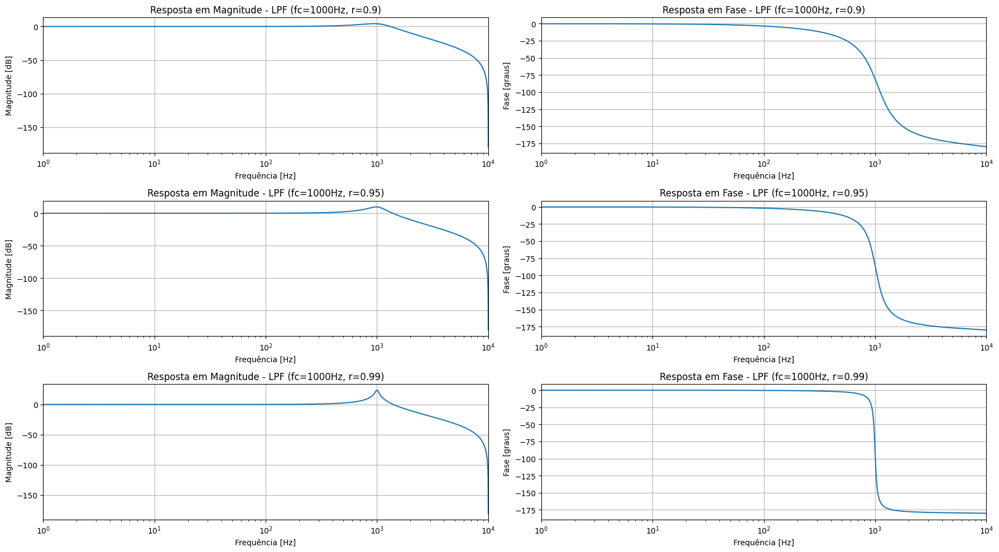

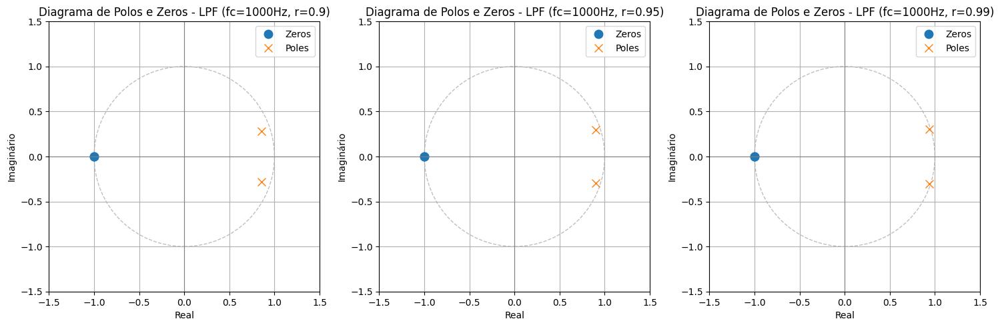


--- Análise e Comentários (Filtro Passa-Baixas) ---
Estabilidade: Para todos os valores de 'r' (r < 1), os polos estão dentro do círculo unitário, garantindo a estabilidade do filtro.
Efeito de 'r':
- À medida que 'r' se aproxima de 1 (ex: 0.9 -> 0.99), os polos se movem para mais perto do círculo unitário.
- Seletividade: O aumento de 'r' resulta em uma transição mais acentuada entre a banda de passagem e a banda de rejeição, ou seja, maior seletividade.
- Largura de Banda: A largura de banda efetiva (definida, por exemplo, pelo ponto -3dB) fica mais 'estreita' no sentido da atenuação, com uma queda mais abrupta na resposta em frequência após a frequência de corte.
- Quanto maior 'r', maior o 'Q' do filtro, tornando a resposta mais 'pontiaguda' ao redor da frequência de corte (se a frequência de corte estiver longe de 0 ou Nyquist).


In [4]:
fc_lp = 1000  # Hz
theta_lp = 2 * np.pi * fc_lp / fs
r_values = [0.9, 0.95, 0.99]

print(f"Filtro Passa-Baixas com fc = {fc_lp} Hz")

plt.figure(figsize=(18, 10))

for i, r in enumerate(r_values):
    # Denominador: 1 - 2r cos(theta_c) z^-1 + r^2 z^-2
    a = [1, -2 * r * np.cos(theta_lp), r**2]

    # Numerador para LPF: zeros em z=-1, normalizado para ganho unitário em DC (z=1)
    K_lp = (1 - 2 * r * np.cos(theta_lp) + r**2) / 4
    b = [K_lp, 2 * K_lp, K_lp]

    print(f"\n--- r = {r} ---")
    print(f"Função de Transferência: H(z) = ({b[0]:.4f} + {b[1]:.4f}z^-1 + {b[2]:.4f}z^-2) / (1 + {a[1]:.4f}z^-1 + {a[2]:.4f}z^-2)")

    # Plot da Resposta em Frequência
    ax_mag = plt.subplot(len(r_values), 2, 2 * i + 1)
    ax_phase = plt.subplot(len(r_values), 2, 2 * i + 2)
    plot_freq_response(b, a, fs, f'LPF (fc={fc_lp}Hz, r={r})', ax_mag, ax_phase)

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5))
for i, r in enumerate(r_values):
    a = [1, -2 * r * np.cos(theta_lp), r**2]
    K_lp = (1 - 2 * r * np.cos(theta_lp) + r**2) / 4
    b = [K_lp, 2 * K_lp, K_lp]
    ax_pz = plt.subplot(1, len(r_values), i + 1)
    plot_pole_zero(b, a, f'LPF (fc={fc_lp}Hz, r={r})', ax_pz)
plt.tight_layout()
plt.show()

# Comentários
print("\n--- Análise e Comentários (Filtro Passa-Baixas) ---")
print("Estabilidade: Para todos os valores de 'r' (r < 1), os polos estão dentro do círculo unitário, garantindo a estabilidade do filtro.")
print("Efeito de 'r':")
print("- À medida que 'r' se aproxima de 1 (ex: 0.9 -> 0.99), os polos se movem para mais perto do círculo unitário.")
print("- Seletividade: O aumento de 'r' resulta em uma transição mais acentuada entre a banda de passagem e a banda de rejeição, ou seja, maior seletividade.")
print("- Largura de Banda: A largura de banda efetiva (definida, por exemplo, pelo ponto -3dB) fica mais 'estreita' no sentido da atenuação, com uma queda mais abrupta na resposta em frequência após a frequência de corte.")
print("- Quanto maior 'r', maior o 'Q' do filtro, tornando a resposta mais 'pontiaguda' ao redor da frequência de corte (se a frequência de corte estiver longe de 0 ou Nyquist).")

### 2. Filtro Passa-Altas (High-Pass Filter) com $f_c = 2000$ Hz

Filtro Passa-Altas com fc = 2000 Hz

--- r = 0.9 ---
Função de Transferência: H(z) = (0.8166 + -1.6331z^-1 + 0.8166z^-2) / (1 + -1.4562z^-1 + 0.8100z^-2)

--- r = 0.95 ---
Função de Transferência: H(z) = (0.8599 + -1.7198z^-1 + 0.8599z^-2) / (1 + -1.5371z^-1 + 0.9025z^-2)

--- r = 0.99 ---
Função de Transferência: H(z) = (0.8955 + -1.7910z^-1 + 0.8955z^-2) / (1 + -1.6019z^-1 + 0.9801z^-2)


/tmp/ipykernel_415/365940938.py:7: RuntimeWarning: divide by zero encountered in log10
  ax_mag.plot(freq, 20 * np.log10(abs(h)))


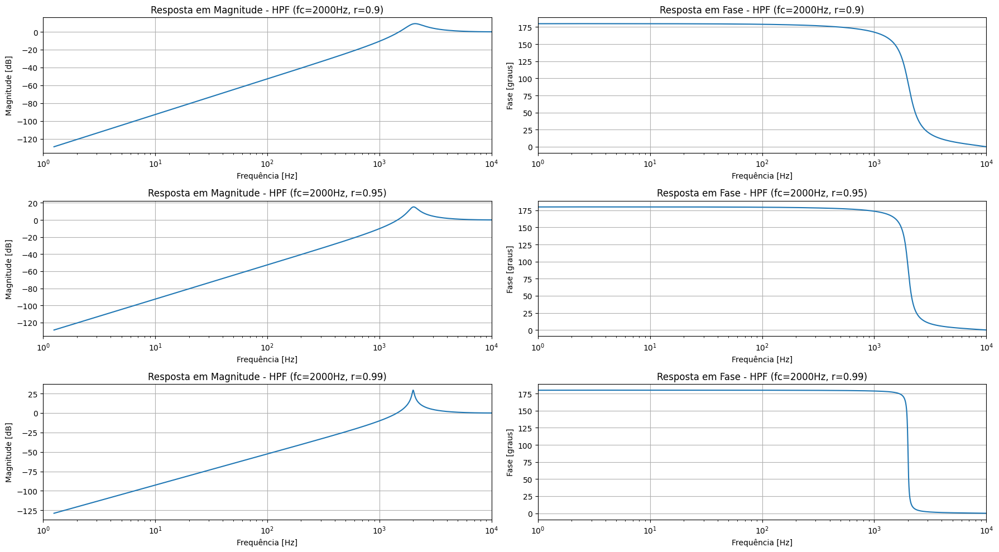

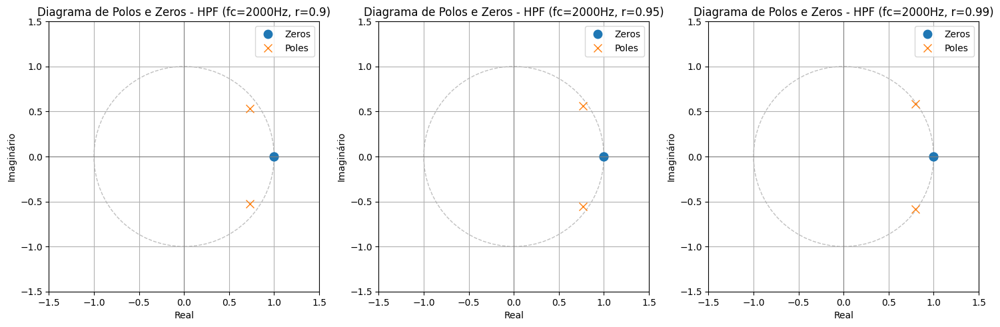


--- Análise e Comentários (Filtro Passa-Altas) ---
Estabilidade: Para todos os valores de 'r' (r < 1), os polos estão dentro do círculo unitário, garantindo a estabilidade do filtro.
Efeito de 'r':
- Semelhante ao LPF, à medida que 'r' se aproxima de 1, os polos se aproximam do círculo unitário.
- Seletividade: Isso resulta em uma transição mais acentuada entre a banda de rejeição e a banda de passagem (maior seletividade).
- Largura de Banda: A largura de banda rejeitada se torna mais estreita, com uma subida mais íngreme na resposta em frequência após a frequência de corte.
- Um 'r' maior leva a um 'Q' maior, resultando em uma resposta de pico mais pronunciada perto da frequência de corte (se longe de Nyquist).


In [5]:
fc_hp = 2000  # Hz
theta_hp = 2 * np.pi * fc_hp / fs
r_values = [0.9, 0.95, 0.99]

print(f"Filtro Passa-Altas com fc = {fc_hp} Hz")

plt.figure(figsize=(18, 10))

for i, r in enumerate(r_values):
    # Denominador: 1 - 2r cos(theta_c) z^-1 + r^2 z^-2
    a = [1, -2 * r * np.cos(theta_hp), r**2]

    # Numerador para HPF: zeros em z=1, normalizado para ganho unitário na frequência de Nyquist (z=-1)
    K_hp = (1 + 2 * r * np.cos(theta_hp) + r**2) / 4 # (1 - a1 + a2) / (1 - (-2) + 1) = (1 - a1 + a2) / 4
    b = [K_hp, -2 * K_hp, K_hp]

    print(f"\n--- r = {r} ---")
    print(f"Função de Transferência: H(z) = ({b[0]:.4f} + {b[1]:.4f}z^-1 + {b[2]:.4f}z^-2) / (1 + {a[1]:.4f}z^-1 + {a[2]:.4f}z^-2)")

    # Plot da Resposta em Frequência
    ax_mag = plt.subplot(len(r_values), 2, 2 * i + 1)
    ax_phase = plt.subplot(len(r_values), 2, 2 * i + 2)
    plot_freq_response(b, a, fs, f'HPF (fc={fc_hp}Hz, r={r})', ax_mag, ax_phase)

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5))
for i, r in enumerate(r_values):
    a = [1, -2 * r * np.cos(theta_hp), r**2]
    K_hp = (1 + 2 * r * np.cos(theta_hp) + r**2) / 4
    b = [K_hp, -2 * K_hp, K_hp]
    ax_pz = plt.subplot(1, len(r_values), i + 1)
    plot_pole_zero(b, a, f'HPF (fc={fc_hp}Hz, r={r})', ax_pz)
plt.tight_layout()
plt.show()

# Comentários
print("\n--- Análise e Comentários (Filtro Passa-Altas) ---")
print("Estabilidade: Para todos os valores de 'r' (r < 1), os polos estão dentro do círculo unitário, garantindo a estabilidade do filtro.")
print("Efeito de 'r':")
print("- Semelhante ao LPF, à medida que 'r' se aproxima de 1, os polos se aproximam do círculo unitário.")
print("- Seletividade: Isso resulta em uma transição mais acentuada entre a banda de rejeição e a banda de passagem (maior seletividade).")
print("- Largura de Banda: A largura de banda rejeitada se torna mais estreita, com uma subida mais íngreme na resposta em frequência após a frequência de corte.")
print("- Um 'r' maior leva a um 'Q' maior, resultando em uma resposta de pico mais pronunciada perto da frequência de corte (se longe de Nyquist).")

### 3. Filtro Passa-Faixas (Band-Pass Filter) com $f_c = 7000$ Hz

Filtro Passa-Faixas com fc = 7000 Hz

--- r = 0.9 ---
Função de Transferência: H(z) = (0.0950 + 0.0000z^-1 + -0.0950z^-2) / (1 + 1.0580z^-1 + 0.8100z^-2)

--- r = 0.95 ---
Função de Transferência: H(z) = (0.0488 + 0.0000z^-1 + -0.0488z^-2) / (1 + 1.1168z^-1 + 0.9025z^-2)

--- r = 0.99 ---
Função de Transferência: H(z) = (0.0100 + 0.0000z^-1 + -0.0100z^-2) / (1 + 1.1638z^-1 + 0.9801z^-2)


/tmp/ipykernel_415/365940938.py:7: RuntimeWarning: divide by zero encountered in log10
  ax_mag.plot(freq, 20 * np.log10(abs(h)))


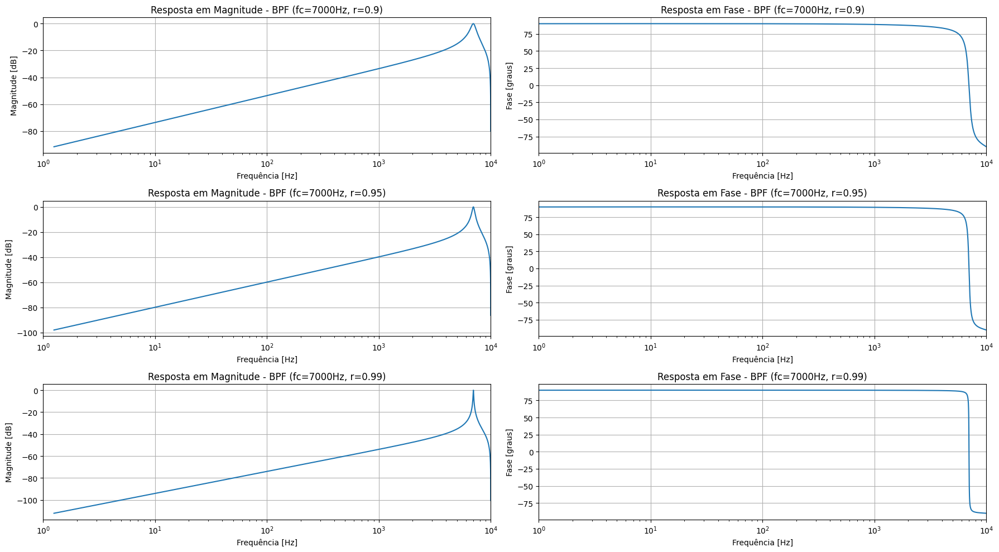

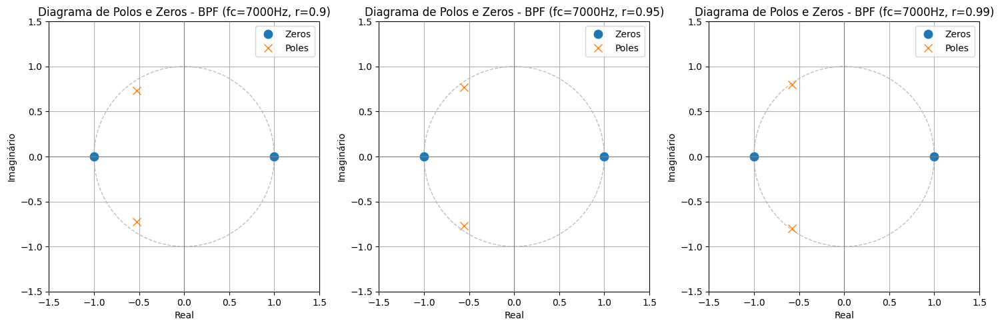


--- Análise e Comentários (Filtro Passa-Faixas) ---
Estabilidade: Com 'r' < 1, os polos permanecem dentro do círculo unitário, garantindo a estabilidade.
Efeito de 'r':
- Para o filtro passa-faixas, 'r' está diretamente ligado ao fator de qualidade (Q) e à largura de banda do filtro.
- À medida que 'r' se aproxima de 1, os polos se aproximam do círculo unitário e se localizam mais próximos à frequência central.
- Seletividade e Largura de Banda: Um 'r' maior resulta em um filtro com Q mais alto e uma banda de passagem mais estreita (maior seletividade). O filtro se torna mais 'seletivo' ao redor da frequência central, atenuando mais abruptamente frequências fora da banda de passagem.
- A largura de banda diminui conforme 'r' aumenta, tornando o filtro mais focado na frequência central.


In [6]:
fc_bp = 7000  # Hz (frequência central)
theta_bp = 2 * np.pi * fc_bp / fs
r_values = [0.9, 0.95, 0.99]

print(f"Filtro Passa-Faixas com fc = {fc_bp} Hz")

plt.figure(figsize=(18, 10))

for i, r in enumerate(r_values):
    # Denominador: 1 - 2r cos(theta_c) z^-1 + r^2 z^-2
    a = [1, -2 * r * np.cos(theta_bp), r**2]

    # Numerador para BPF: zeros em z=1 e z=-1 (1 - z^-2), normalizado para ganho unitário na fc
    # Usando forma comum onde b0 = (1-r^2)/2, b1=0, b2=-(1-r^2)/2
    b = [(1 - r**2) / 2, 0, -(1 - r**2) / 2]

    print(f"\n--- r = {r} ---")
    print(f"Função de Transferência: H(z) = ({b[0]:.4f} + {b[1]:.4f}z^-1 + {b[2]:.4f}z^-2) / (1 + {a[1]:.4f}z^-1 + {a[2]:.4f}z^-2)")

    # Plot da Resposta em Frequência
    ax_mag = plt.subplot(len(r_values), 2, 2 * i + 1)
    ax_phase = plt.subplot(len(r_values), 2, 2 * i + 2)
    plot_freq_response(b, a, fs, f'BPF (fc={fc_bp}Hz, r={r})', ax_mag, ax_phase)

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5))
for i, r in enumerate(r_values):
    a = [1, -2 * r * np.cos(theta_bp), r**2]
    b = [(1 - r**2) / 2, 0, -(1 - r**2) / 2]
    ax_pz = plt.subplot(1, len(r_values), i + 1)
    plot_pole_zero(b, a, f'BPF (fc={fc_bp}Hz, r={r})', ax_pz)
plt.tight_layout()
plt.show()

# Comentários
print("\n--- Análise e Comentários (Filtro Passa-Faixas) ---")
print("Estabilidade: Com 'r' < 1, os polos permanecem dentro do círculo unitário, garantindo a estabilidade.")
print("Efeito de 'r':")
print("- Para o filtro passa-faixas, 'r' está diretamente ligado ao fator de qualidade (Q) e à largura de banda do filtro.")
print("- À medida que 'r' se aproxima de 1, os polos se aproximam do círculo unitário e se localizam mais próximos à frequência central.")
print("- Seletividade e Largura de Banda: Um 'r' maior resulta em um filtro com Q mais alto e uma banda de passagem mais estreita (maior seletividade). O filtro se torna mais 'seletivo' ao redor da frequência central, atenuando mais abruptamente frequências fora da banda de passagem.")
print("- A largura de banda diminui conforme 'r' aumenta, tornando o filtro mais focado na frequência central.")

### 4. Filtro Notch (Rejeita-Faixas) com $f_c = 3000$ Hz

Filtro Notch com fc = 3000 Hz

--- r = 0.9 ---
Função de Transferência: H(z) = (0.9121 + -1.0723z^-1 + 0.9121z^-2) / (1 + -1.0580z^-1 + 0.8100z^-2)

--- r = 0.95 ---
Função de Transferência: H(z) = (0.9530 + -1.1204z^-1 + 0.9530z^-2) / (1 + -1.1168z^-1 + 0.9025z^-2)

--- r = 0.99 ---
Função de Transferência: H(z) = (0.9901 + -1.1640z^-1 + 0.9901z^-2) / (1 + -1.1638z^-1 + 0.9801z^-2)


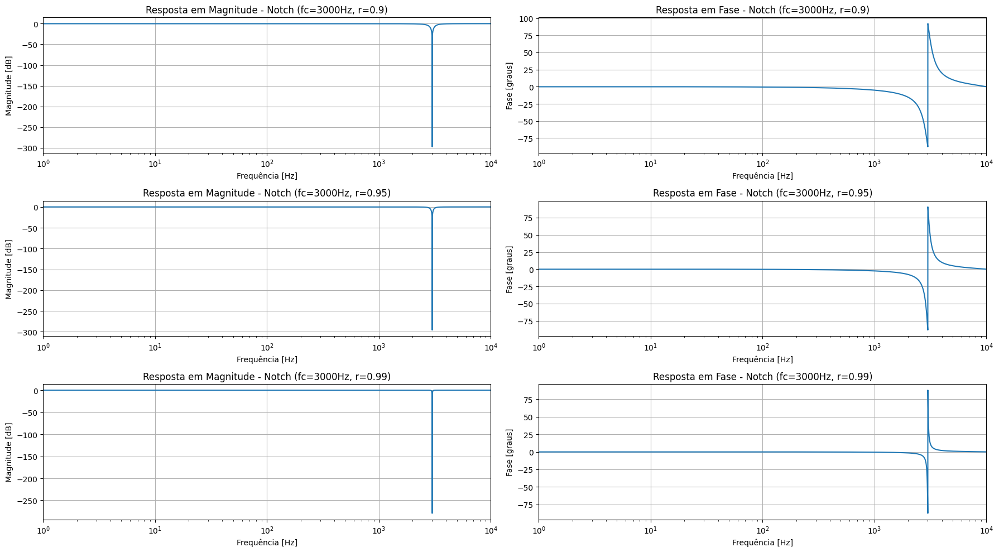

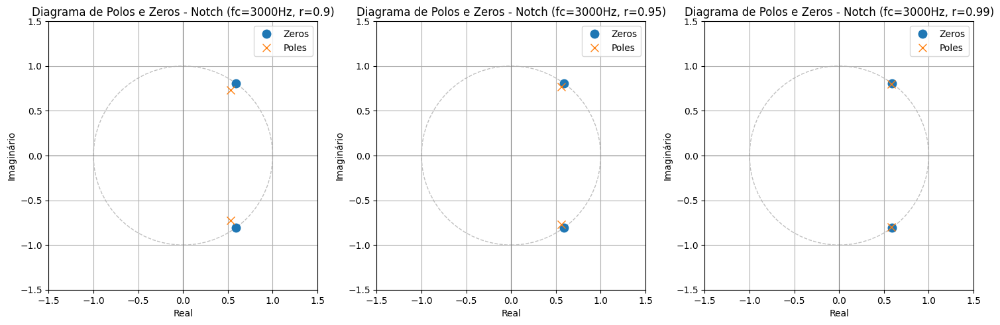


--- Análise e Comentários (Filtro Notch) ---
Estabilidade: Como 'r' < 1, os polos estão dentro do círculo unitário, assegurando a estabilidade.
Efeito de 'r':
- Para o filtro Notch, os zeros estão fixos no círculo unitário na frequência do entalhe, enquanto os polos se movem com 'r'.
- À medida que 'r' se aproxima de 1, os polos se aproximam dos zeros e do círculo unitário.
- Seletividade: Um 'r' maior resulta em um entalhe (notch) mais profundo e mais estreito na resposta em frequência (maior seletividade). Isso significa que uma banda muito específica de frequências é atenuada de forma mais eficaz.
- Largura de Banda: A largura de banda do entalhe diminui significativamente à medida que 'r' se aproxima de 1. O filtro se torna muito seletivo na remoção de frequências específicas.


In [7]:
fc_notch = 3000  # Hz (frequência central do entalhe)
theta_notch = 2 * np.pi * fc_notch / fs
r_values = [0.9, 0.95, 0.99]

print(f"Filtro Notch com fc = {fc_notch} Hz")

plt.figure(figsize=(18, 10))

for i, r in enumerate(r_values):
    # Denominador: 1 - 2r cos(theta_c) z^-1 + r^2 z^-2
    a = [1, -2 * r * np.cos(theta_notch), r**2]

    # Numerador para Notch: zeros no círculo unitário na frequência do entalhe
    b_notch_unscaled = [1, -2 * np.cos(theta_notch), 1]
    # Normalização para ganho unitário em DC (z=1)
    K_notch = (1 - 2 * r * np.cos(theta_notch) + r**2) / (1 - 2 * np.cos(theta_notch) + 1)
    b = [K_notch * val for val in b_notch_unscaled]

    print(f"\n--- r = {r} ---")
    print(f"Função de Transferência: H(z) = ({b[0]:.4f} + {b[1]:.4f}z^-1 + {b[2]:.4f}z^-2) / (1 + {a[1]:.4f}z^-1 + {a[2]:.4f}z^-2)")

    # Plot da Resposta em Frequência
    ax_mag = plt.subplot(len(r_values), 2, 2 * i + 1)
    ax_phase = plt.subplot(len(r_values), 2, 2 * i + 2)
    plot_freq_response(b, a, fs, f'Notch (fc={fc_notch}Hz, r={r})', ax_mag, ax_phase)

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5))
for i, r in enumerate(r_values):
    a = [1, -2 * r * np.cos(theta_notch), r**2]
    b_notch_unscaled = [1, -2 * np.cos(theta_notch), 1]
    K_notch = (1 - 2 * r * np.cos(theta_notch) + r**2) / (1 - 2 * np.cos(theta_notch) + 1)
    b = [K_notch * val for val in b_notch_unscaled]
    ax_pz = plt.subplot(1, len(r_values), i + 1)
    plot_pole_zero(b, a, f'Notch (fc={fc_notch}Hz, r={r})', ax_pz)
plt.tight_layout()
plt.show()

# Comentários
print("\n--- Análise e Comentários (Filtro Notch) ---")
print("Estabilidade: Como 'r' < 1, os polos estão dentro do círculo unitário, assegurando a estabilidade.")
print("Efeito de 'r':")
print("- Para o filtro Notch, os zeros estão fixos no círculo unitário na frequência do entalhe, enquanto os polos se movem com 'r'.")
print("- À medida que 'r' se aproxima de 1, os polos se aproximam dos zeros e do círculo unitário.")
print("- Seletividade: Um 'r' maior resulta em um entalhe (notch) mais profundo e mais estreito na resposta em frequência (maior seletividade). Isso significa que uma banda muito específica de frequências é atenuada de forma mais eficaz.")
print("- Largura de Banda: A largura de banda do entalhe diminui significativamente à medida que 'r' se aproxima de 1. O filtro se torna muito seletivo na remoção de frequências específicas.")

QUESTÃO 2: Considerando um fs = 20000 Hz, projete um filtro passa-faixas com fc1 = 6000 Hz e fc2 = 8000 Hz com uma cascata de blocos componentes básicos de 2ª ordem. Analise a resposta em frequência e o diagrama de polos e zeros do filtro. Compare com o filtro passa-faixas projetado na questão 1 e comente os resultados.

### 5. Filtro Passa-Faixas em Cascata com $f_{c1} = 6000$ Hz e $f_{c2} = 8000$ Hz

Filtro Passa-Faixas em cascata com fc1 = 6000 Hz e fc2 = 8000 Hz (r=0.95)

--- Coeficientes do Filtro Passa-Faixas Cascata (r=0.95) ---
Numerador (b): [ 0.28277383  0.         -0.56554766  0.          0.28277383]
Denominador (a): [1.         2.12426458 2.7075     1.91714878 0.81450625]


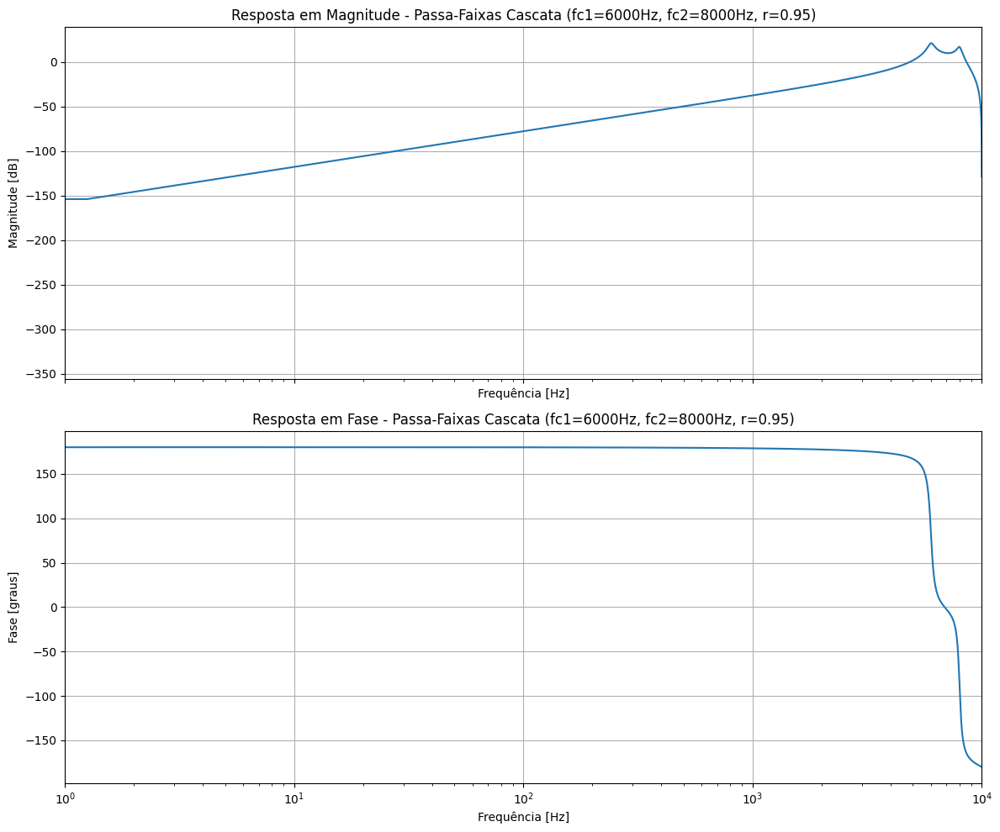

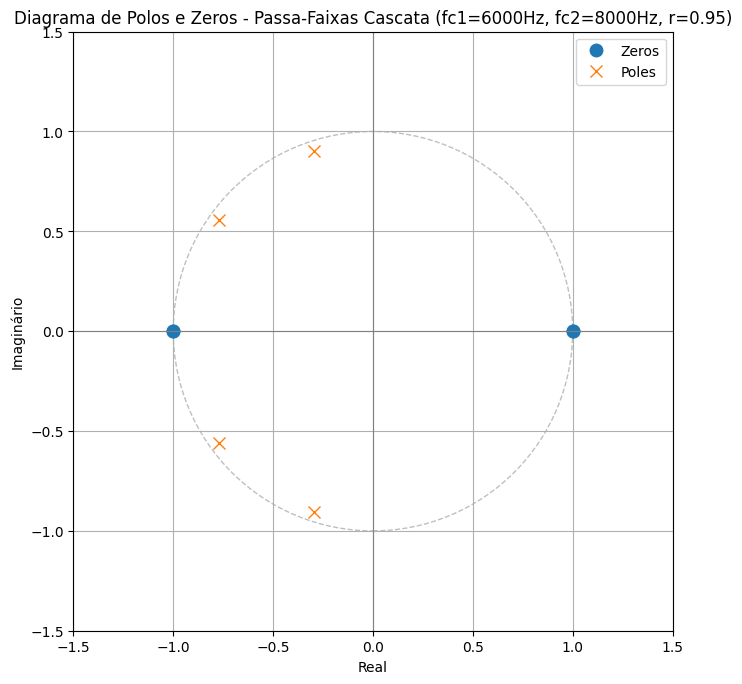


--- Análise e Comparação (Filtro Passa-Faixas Cascata vs. Questão 1) ---
Estabilidade: Assim como nos filtros individuais com r < 1, a cascata de filtros também é estável, pois todos os polos resultantes estão dentro do círculo unitário.
Seletividade e Largura de Banda:
- O filtro passa-faixas em cascata, por ser uma combinação de um HPF e um LPF, geralmente oferece uma transição mais acentuada entre as bandas de passagem e rejeição em comparação com um filtro passa-faixas de 2ª ordem simples (como na Questão 1).
- A largura de banda é definida de forma mais precisa pelas duas frequências de corte (fc1 e fc2).
- Na Questão 1, o filtro de 2ª ordem tinha uma frequência central e uma largura de banda que era inversamente proporcional ao Q (e, portanto, diretamente relacionada a 'r'). Aqui, controlamos as bordas da banda de passagem de forma mais direta.
- O filtro cascata tende a ter uma seletividade maior, ou seja, bordas de banda mais íngremes, especialmente se os valores de 'r' indivi

In [8]:
fc1_casc = 6000  # Hz (frequência de corte inferior para HPF)
fc2_casc = 8000  # Hz (frequência de corte superior para LPF)
r_casc = 0.95  # Parâmetro 'r' para os filtros em cascata (pode ser ajustado)

print(f"Filtro Passa-Faixas em cascata com fc1 = {fc1_casc} Hz e fc2 = {fc2_casc} Hz (r={r_casc})")

# --- 1. Projeto do Filtro Passa-Altas (HPF) com fc1 = 6000 Hz ---
theta_hpf_casc = 2 * np.pi * fc1_casc / fs
a_hpf = [1, -2 * r_casc * np.cos(theta_hpf_casc), r_casc**2]
K_hpf = (1 + 2 * r_casc * np.cos(theta_hpf_casc) + r_casc**2) / 4
b_hpf = [K_hpf, -2 * K_hpf, K_hpf]

# --- 2. Projeto do Filtro Passa-Baixas (LPF) com fc2 = 8000 Hz ---
theta_lpf_casc = 2 * np.pi * fc2_casc / fs
a_lpf = [1, -2 * r_casc * np.cos(theta_lpf_casc), r_casc**2]
K_lpf = (1 - 2 * r_casc * np.cos(theta_lpf_casc) + r_casc**2) / 4
b_lpf = [K_lpf, 2 * K_lpf, K_lpf]

# --- 3. Cascata dos filtros ---
# Multiplicar as funções de transferência equivale a convoluir os coeficientes
b_cascaded = np.convolve(b_hpf, b_lpf)
a_cascaded = np.convolve(a_hpf, a_lpf)

print(f"\n--- Coeficientes do Filtro Passa-Faixas Cascata (r={r_casc}) ---")
print(f"Numerador (b): {b_cascaded}")
print(f"Denominador (a): {a_cascaded}")

# --- 4. Análise do Filtro Cascata ---

fig, (ax_mag, ax_phase) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
plot_freq_response(b_cascaded, a_cascaded, fs, f'Passa-Faixas Cascata (fc1={fc1_casc}Hz, fc2={fc2_casc}Hz, r={r_casc})', ax_mag, ax_phase)
plt.tight_layout()
plt.show()

fig_pz, ax_pz = plt.subplots(1, 1, figsize=(7, 7))
plot_pole_zero(b_cascaded, a_cascaded, f'Passa-Faixas Cascata (fc1={fc1_casc}Hz, fc2={fc2_casc}Hz, r={r_casc})', ax_pz)
plt.tight_layout()
plt.show()

# --- 5. Comparação e Comentários ---
print("\n--- Análise e Comparação (Filtro Passa-Faixas Cascata vs. Questão 1) ---")
print("Estabilidade: Assim como nos filtros individuais com r < 1, a cascata de filtros também é estável, pois todos os polos resultantes estão dentro do círculo unitário.")
print("Seletividade e Largura de Banda:")
print("- O filtro passa-faixas em cascata, por ser uma combinação de um HPF e um LPF, geralmente oferece uma transição mais acentuada entre as bandas de passagem e rejeição em comparação com um filtro passa-faixas de 2ª ordem simples (como na Questão 1).")
print("- A largura de banda é definida de forma mais precisa pelas duas frequências de corte (fc1 e fc2).")
print("- Na Questão 1, o filtro de 2ª ordem tinha uma frequência central e uma largura de banda que era inversamente proporcional ao Q (e, portanto, diretamente relacionada a 'r'). Aqui, controlamos as bordas da banda de passagem de forma mais direta.")
print("- O filtro cascata tende a ter uma seletividade maior, ou seja, bordas de banda mais íngremes, especialmente se os valores de 'r' individuais forem próximos de 1. No entanto, ele também pode introduzir mais ripple na banda de passagem se os filtros componentes não forem projetados cuidadosamente.")
print("- O diagrama de polos e zeros do filtro cascata terá quatro polos (dois de cada filtro componente) e quatro zeros (dois de cada filtro componente), enquanto o filtro de 2ª ordem simples da Questão 1 tinha apenas dois polos e dois zeros. Isso reflete a maior ordem e, potencialmente, a maior complexidade na resposta em frequência.")
print("- O ganho na banda de passagem do filtro cascata pode ser menor do que o do filtro de 2ª ordem simples, dependendo da normalização dos coeficientes 'b' de cada filtro componente.")

QUESTÃO 3: Considerando um fs = 20000 Hz, projete um filtro rejeita-faixas com fc1 = 1000 Hz e fc2 = 4000 Hz com um paralelo de blocos componentes básicos de 2ª ordem. Analise a resposta em frequência e o diagrama de polos e zeros do filtro. Compare com o filtro notch projetado na questão 1 e comente os resultados obtidos.


### 6. Filtro Rejeita-Faixas (Notch) em Paralelo com $f_{c1} = 1000$ Hz e $f_{c2} = 4000$ Hz

Filtro Rejeita-Faixas em paralelo com fc1 = 1000 Hz e fc2 = 4000 Hz (r=0.95)

--- Coeficientes do Filtro Rejeita-Faixas Paralelo (r=0.95) ---
Numerador (b): [ 0.64628123 -2.33578252  3.4509086  -2.21906821  0.58326881]
Denominador (a): [ 1.         -2.39413967  2.86595238 -2.16071105  0.81450625]


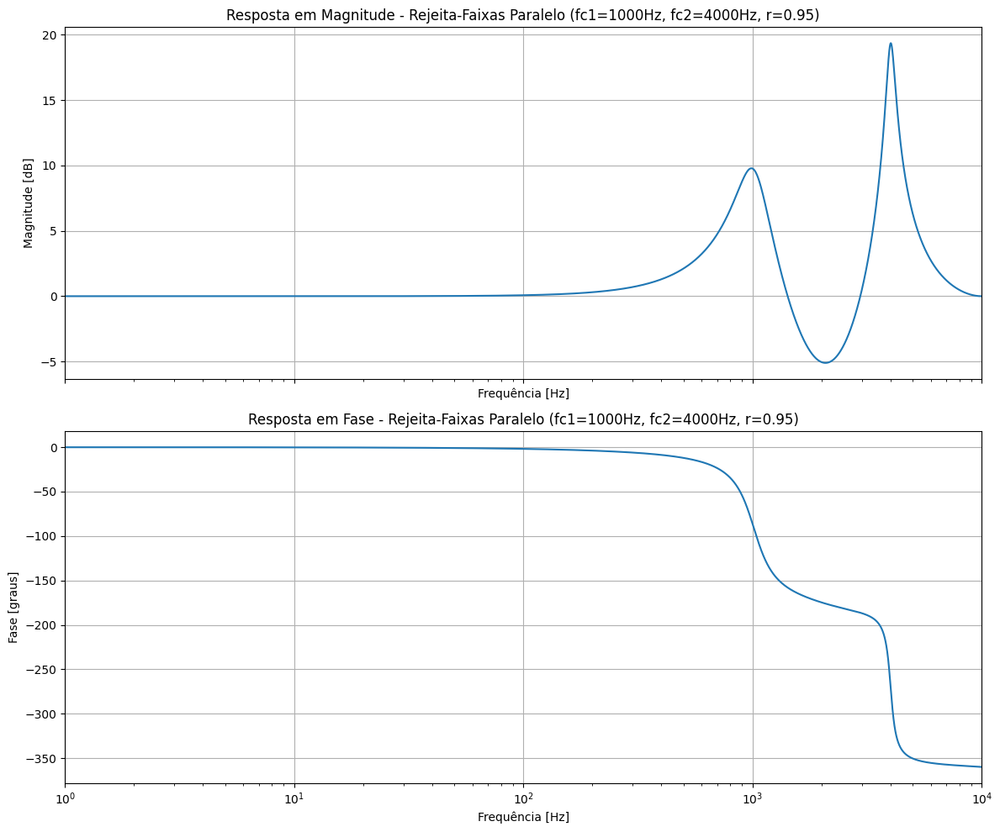

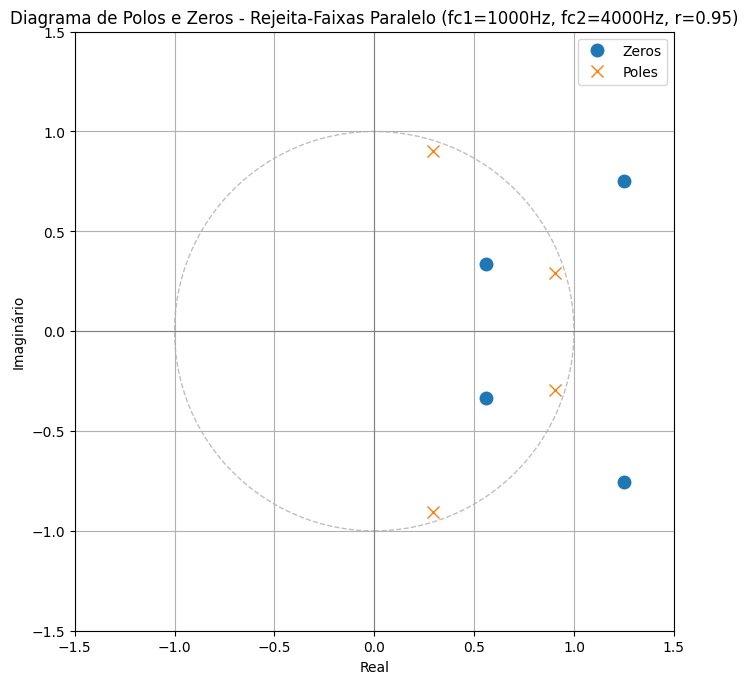


--- Análise e Comparação (Filtro Rejeita-Faixas Paralelo vs. Questão 1) ---
Estabilidade: Como todos os sub-filtros de 2ª ordem são estáveis (r < 1), a combinação em paralelo também será estável, pois todos os polos resultantes (que são a união dos polos dos sub-filtros) estarão dentro do círculo unitário.
Seletividade e Largura de Banda:
- O filtro rejeita-faixas em paralelo é de 4ª ordem (quatro polos e quatro zeros), enquanto o filtro Notch da Questão 1 era de 2ª ordem. Isso geralmente permite uma seletividade maior, com transições mais acentuadas entre as bandas de passagem e rejeição.
- A largura da banda de rejeição é claramente definida pelas frequências de corte dos filtros componentes (fc1 e fc2). No filtro Notch de 2ª ordem, a largura do entalhe era controlada principalmente pelo parâmetro 'r'.
- O filtro paralelo tende a ter um ganho mais uniforme nas bandas de passagem (abaixo de fc1 e acima de fc2) e uma rejeição mais profunda na banda de entalhe em comparação com o filtr

In [9]:
fc1_par = 1000  # Hz (frequência de corte do LPF)
fc2_par = 4000  # Hz (frequência de corte do HPF)
r_par = 0.95  # Parâmetro 'r' para os filtros em paralelo

print(f"Filtro Rejeita-Faixas em paralelo com fc1 = {fc1_par} Hz e fc2 = {fc2_par} Hz (r={r_par})")

# --- 1. Projeto do Filtro Passa-Baixas (LPF) com fc1 = 1000 Hz ---
theta_lpf_par = 2 * np.pi * fc1_par / fs
a_lpf_par = [1, -2 * r_par * np.cos(theta_lpf_par), r_par**2]
K_lpf_par = (1 - 2 * r_par * np.cos(theta_lpf_par) + r_par**2) / 4
b_lpf_par = [K_lpf_par, 2 * K_lpf_par, K_lpf_par]

# --- 2. Projeto do Filtro Passa-Altas (HPF) com fc2 = 4000 Hz ---
theta_hpf_par = 2 * np.pi * fc2_par / fs
a_hpf_par = [1, -2 * r_par * np.cos(theta_hpf_par), r_par**2]
K_hpf_par = (1 + 2 * r_par * np.cos(theta_hpf_par) + r_par**2) / 4
b_hpf_par = [K_hpf_par, -2 * K_hpf_par, K_hpf_par]

# --- 3. Combinação em Paralelo dos filtros ---
# H(z) = H_LPF(z) + H_HPF(z) = (b_LPF(z)*a_HPF(z) + b_HPF(z)*a_LPF(z)) / (a_LPF(z)*a_HPF(z))

b_term1 = np.convolve(b_lpf_par, a_hpf_par) # Numerador do LPF * Denominador do HPF
b_term2 = np.convolve(b_hpf_par, a_lpf_par) # Numerador do HPF * Denominador do LPF

# Os resultados da convolução terão o mesmo tamanho (3+3-1 = 5), então podem ser somados diretamente
b_parallel = b_term1 + b_term2
a_parallel = np.convolve(a_lpf_par, a_hpf_par)

print(f"\n--- Coeficientes do Filtro Rejeita-Faixas Paralelo (r={r_par}) ---")
print(f"Numerador (b): {b_parallel}")
print(f"Denominador (a): {a_parallel}")

# --- 4. Análise do Filtro Paralelo ---

fig, (ax_mag, ax_phase) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
plot_freq_response(b_parallel, a_parallel, fs, f'Rejeita-Faixas Paralelo (fc1={fc1_par}Hz, fc2={fc2_par}Hz, r={r_par})', ax_mag, ax_phase)
plt.tight_layout()
plt.show()

fig_pz, ax_pz = plt.subplots(1, 1, figsize=(7, 7))
plot_pole_zero(b_parallel, a_parallel, f'Rejeita-Faixas Paralelo (fc1={fc1_par}Hz, fc2={fc2_par}Hz, r={r_par})', ax_pz)
plt.tight_layout()
plt.show()

# --- 5. Comparação e Comentários ---
print("\n--- Análise e Comparação (Filtro Rejeita-Faixas Paralelo vs. Questão 1) ---")
print("Estabilidade: Como todos os sub-filtros de 2ª ordem são estáveis (r < 1), a combinação em paralelo também será estável, pois todos os polos resultantes (que são a união dos polos dos sub-filtros) estarão dentro do círculo unitário.")
print("Seletividade e Largura de Banda:")
print("- O filtro rejeita-faixas em paralelo é de 4ª ordem (quatro polos e quatro zeros), enquanto o filtro Notch da Questão 1 era de 2ª ordem. Isso geralmente permite uma seletividade maior, com transições mais acentuadas entre as bandas de passagem e rejeição.")
print("- A largura da banda de rejeição é claramente definida pelas frequências de corte dos filtros componentes (fc1 e fc2). No filtro Notch de 2ª ordem, a largura do entalhe era controlada principalmente pelo parâmetro 'r'.")
print("- O filtro paralelo tende a ter um ganho mais uniforme nas bandas de passagem (abaixo de fc1 e acima de fc2) e uma rejeição mais profunda na banda de entalhe em comparação com o filtro de 2ª ordem, especialmente se 'r' for próximo de 1.")
print("- O diagrama de polos e zeros do filtro paralelo terá quatro polos (dois próximos a fc1 e dois próximos a fc2) e quatro zeros. Os zeros se alinham para criar o entalhe na resposta em frequência, e os polos próximos ao círculo unitário (devido ao 'r' próximo de 1) definem as bordas da banda de rejeição.")
print("- É importante notar que a normalização dos ganhos dos filtros LPF e HPF individuais é crucial para garantir que as bandas de passagem do filtro combinado tenham o ganho desejado (tipicamente 0 dB).")

QUESTÃO 4: Realize uma quantização de b ∈ {2, 4, 8, 16, 32} bits nos coeficientes do filtro projetado nas questões 2 e 3. Primeiro, realize a quantização no filtro resultante e depois, faça a quantização em cada bloco dos filtros. Compare a resposta em frequência, o diagrama de polos e zeros do filtro original com as suas versões quantizadas e verifique a estabilidade e a sensibilidade numérica dos filtros quantizados. Comente os resultados obtidos.

### 7. Quantização dos Coeficientes dos Filtros (Questão 2 e 3)

In [10]:
def quantize_coefficients(coefficients, num_bits, max_abs_val):
    if not isinstance(coefficients, np.ndarray):
        coefficients = np.array(coefficients)

    if num_bits <= 1:
        print(f"Warning: num_bits={num_bits} is too small for meaningful signed fixed-point representation. Returning zeros.")
        return np.zeros_like(coefficients)

    # Determine the number of integer bits needed to represent max_abs_val
    # Max value is ~3.45, so 2 integer bits are needed (2^1 < 3.45 < 2^2)
    n_int = int(np.ceil(np.log2(max_abs_val))) if max_abs_val > 0 else 0
    if n_int == 0 and max_abs_val > 0: # Handle cases like max_abs_val = 0.5 where ceil(log2(0.5)) is 0.0
        n_int = 1 # At least one integer bit to represent 0.x

    # Number of fractional bits
    n_frac = num_bits - 1 - n_int # Total bits - sign bit - integer bits

    if n_frac < 0: # If num_bits is too small for n_int
        print(f"Warning: num_bits={num_bits} is too small for max_abs_val={max_abs_val}. Setting n_frac to 0 and integer part might be truncated.")
        n_frac = 0
        # In this case, the effective range will be smaller than max_abs_val, leading to clipping

    quantized_coeffs = []
    scale_factor = 2.0**n_frac

    # Determine the representable range given n_int and n_frac
    max_representable = (2.0**n_int) - (2.0**(-n_frac)) if n_frac > 0 else (2.0**n_int) - 1.0
    min_representable = -(2.0**n_int)

    for coef in coefficients:
        scaled_coef = coef * scale_factor
        rounded_coef = np.round(scaled_coef)
        quantized_coef = rounded_coef / scale_factor
        # Clamp to representable range
        quantized_coef = np.clip(quantized_coef, min_representable, max_representable)
        quantized_coeffs.append(quantized_coef)

    return np.array(quantized_coeffs)


# Modified Function for frequency response plotting to allow label
def plot_freq_response_comp(b, a, fs, label, ax_mag, ax_phase, color='b', linestyle='-'):
    w, h = signal.freqz(b, a, worN=8000)
    freq = w * fs / (2 * np.pi)

    ax_mag.plot(freq, 20 * np.log10(abs(h)), color=color, linestyle=linestyle, label=label)
    ax_mag.set_xlabel('Frequência [Hz]')
    ax_mag.set_ylabel('Magnitude [dB]')
    ax_mag.grid(True)
    ax_mag.set_xscale('log')
    ax_mag.set_xlim([1, fs / 2])

    angles = np.unwrap(np.angle(h))
    ax_phase.plot(freq, angles * 180 / np.pi, color=color, linestyle=linestyle, label=label)
    ax_phase.set_xlabel('Frequência [Hz]')
    ax_phase.set_ylabel('Fase [graus]')
    ax_phase.grid(True)
    ax_phase.set_xscale('log')
    ax_phase.set_xlim([1, fs / 2])

# Modified Function for pole-zero plotting to allow label and no title
def plot_pole_zero_comp(b, a, label, ax, color='b'):
    zeros, poles, gain = signal.tf2zpk(b, a)

    ax.plot(np.real(zeros), np.imag(zeros), 'o', markersize=9, label=f'Zeros ({label})', color=color)
    ax.plot(np.real(poles), np.imag(poles), 'x', markersize=9, label=f'Poles ({label})', color=color)

    unit_circle = Circle((0, 0), 1, color='gray', linestyle='--', fill=False, alpha=0.5)
    ax.add_patch(unit_circle)

    ax.axvline(0, color='gray', linewidth=0.8)
    ax.axhline(0, color='gray', linewidth=0.8)
    ax.set_xlabel('Real')
    ax.set_ylabel('Imaginário')
    ax.set_xlim([-1.5, 1.5])
    ax.set_ylim([-1.5, 1.5])
    ax.set_aspect('equal')
    ax.legend()
    ax.grid(True)

def compare_filter_versions(b_orig, a_orig, b_quant, a_quant, fs, title_suffix, b_bits):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'{title_suffix} - Comparação Original vs Quantizado ({b_bits} bits)', fontsize=16)

    # Magnitude Plot
    plot_freq_response_comp(b_orig, a_orig, fs, 'Original', axes[0, 0], axes[1, 0], color='b', linestyle='-')
    plot_freq_response_comp(b_quant, a_quant, fs, 'Quantizado', axes[0, 0], axes[1, 0], color='r', linestyle='--')
    axes[0, 0].set_title('Resposta em Magnitude')
    axes[1, 0].set_title('Resposta em Fase')
    axes[0, 0].legend()
    axes[1, 0].legend()


    # Pole-Zero Plot for Original
    plot_pole_zero_comp(b_orig, a_orig, 'Original', axes[0, 1], color='b')
    axes[0, 1].set_title('Diagrama de Polos e Zeros (Original)')

    # Pole-Zero Plot for Quantized (on a new subplot)
    plot_pole_zero_comp(b_quant, a_quant, 'Quantizado', axes[1, 1], color='r')
    axes[1, 1].set_title('Diagrama de Polos e Zeros (Quantizado)')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    _, poles_orig, _ = signal.tf2zpk(b_orig, a_orig)
    _, poles_quant, _ = signal.tf2zpk(b_quant, a_quant)
    stable_orig = np.all(np.abs(poles_orig) < 1)
    stable_quant = np.all(np.abs(poles_quant) < 1)

    print(f"Estabilidade do filtro original: {'Estável' if stable_orig else 'Instável'}")
    print(f"Estabilidade do filtro quantizado ({b_bits} bits): {'Estável' if stable_quant else 'Instável'}")
    if not stable_quant:
        print("Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.")
    else:
        print("O filtro quantizado permanece estável.")
    print("\nComentários sobre Sensibilidade Numérica:")
    print("A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.")
    print("Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.")
    print("A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.")

#### 7.1 Análise de Quantização para o Filtro Passa-Faixas em Cascata (Questão 2)

--- Quantização do Filtro Passa-Faixas Cascata Resultante ---

--- 2 bits ---
b_cascaded (Original): [ 0.28277383  0.         -0.56554766  0.          0.28277383]
b_cascaded (Quantizado 2 bits): [ 0.  0. -1.  0.  0.]
a_cascaded (Original): [1.         2.12426458 2.7075     1.91714878 0.81450625]
a_cascaded (Quantizado 2 bits): [1. 2. 3. 2. 1.]


/usr/local/lib/python3.12/dist-packages/scipy/signal/_filter_design.py:1230: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  b, a = normalize(b, a)


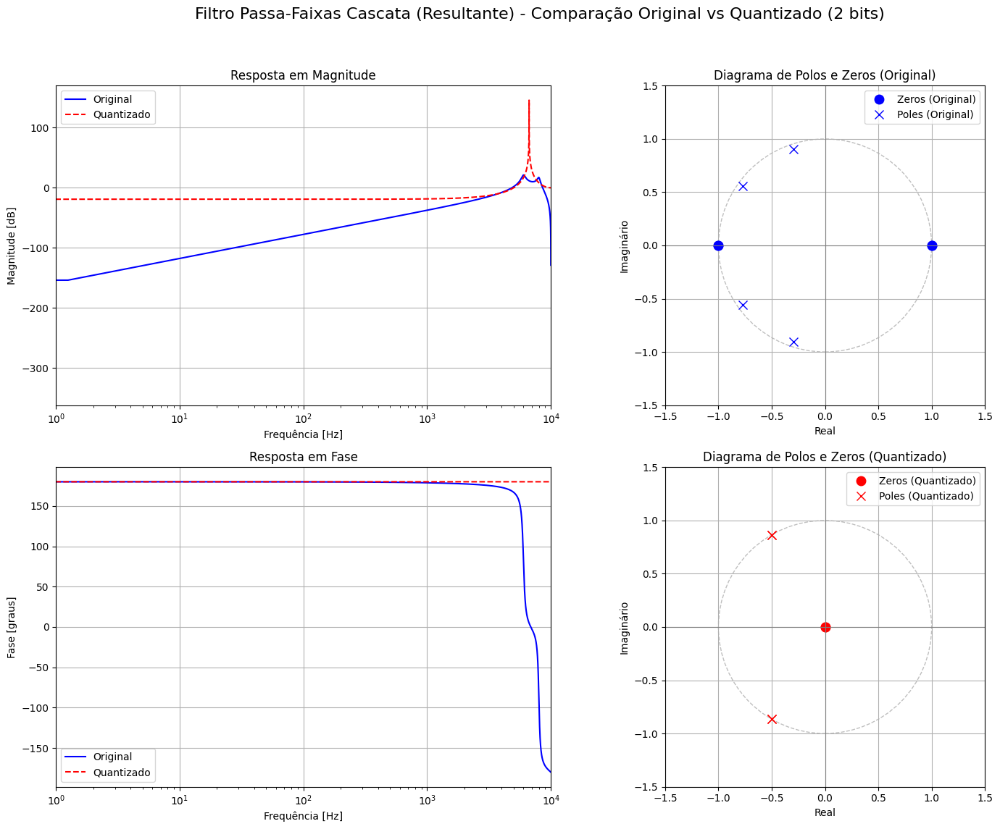

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (2 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 4 bits ---
b_cascaded (Original): [ 0.28277383  0.      

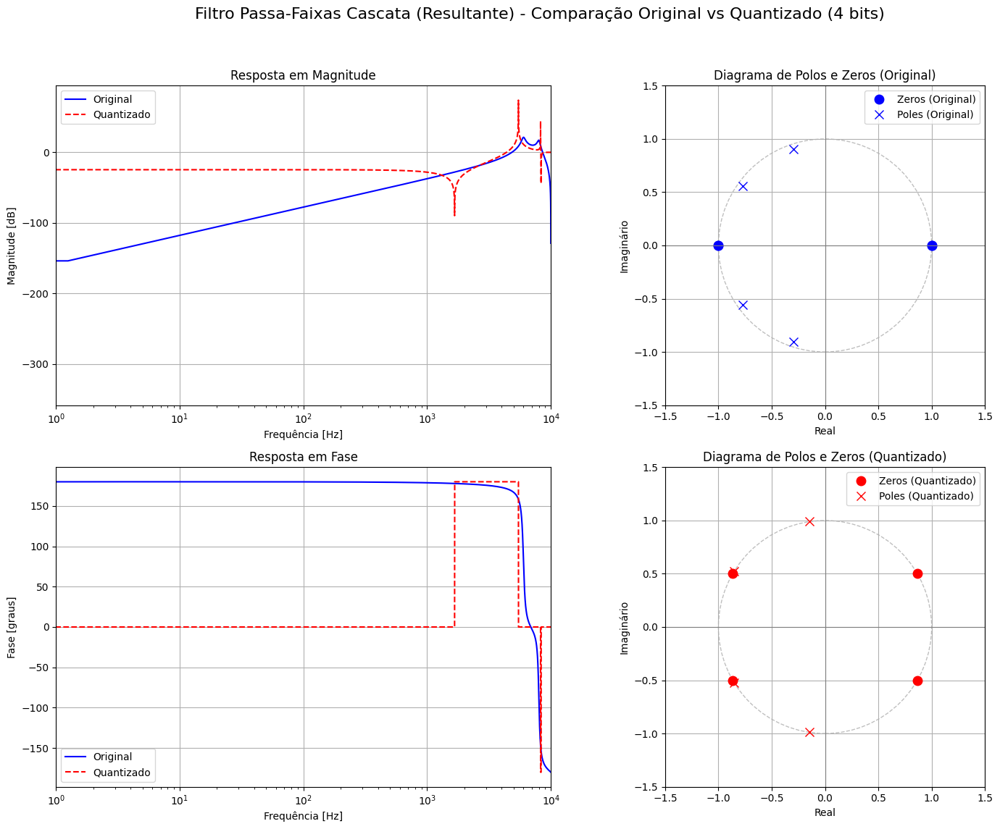

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (4 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 8 bits ---
b_cascaded (Original): [ 0.28277383  0.      

/tmp/ipykernel_415/3558647232.py:46: RuntimeWarning: divide by zero encountered in log10
  ax_mag.plot(freq, 20 * np.log10(abs(h)), color=color, linestyle=linestyle, label=label)


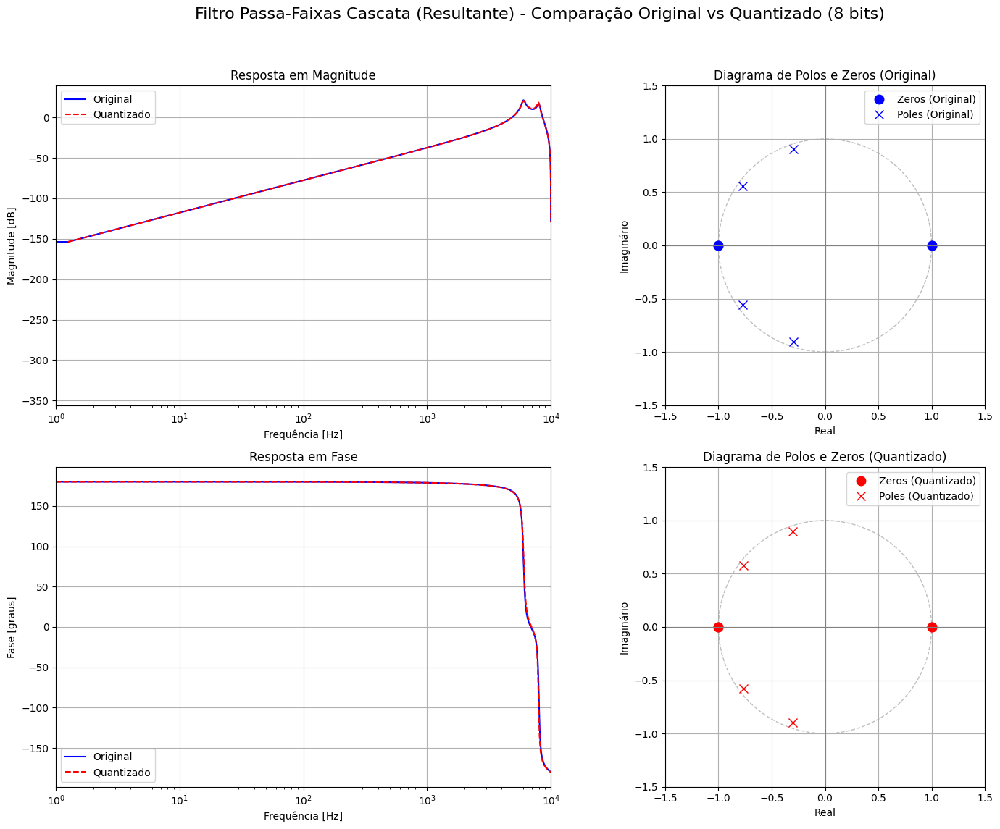

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (8 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 16 bits ---
b_cascaded (Original): [ 0.28277383  0.         -0.56554766  0.          0.28277383]
b_cascaded (Quantizado 16 bits): [ 0.28271484  0.         -0.56555176  0.   

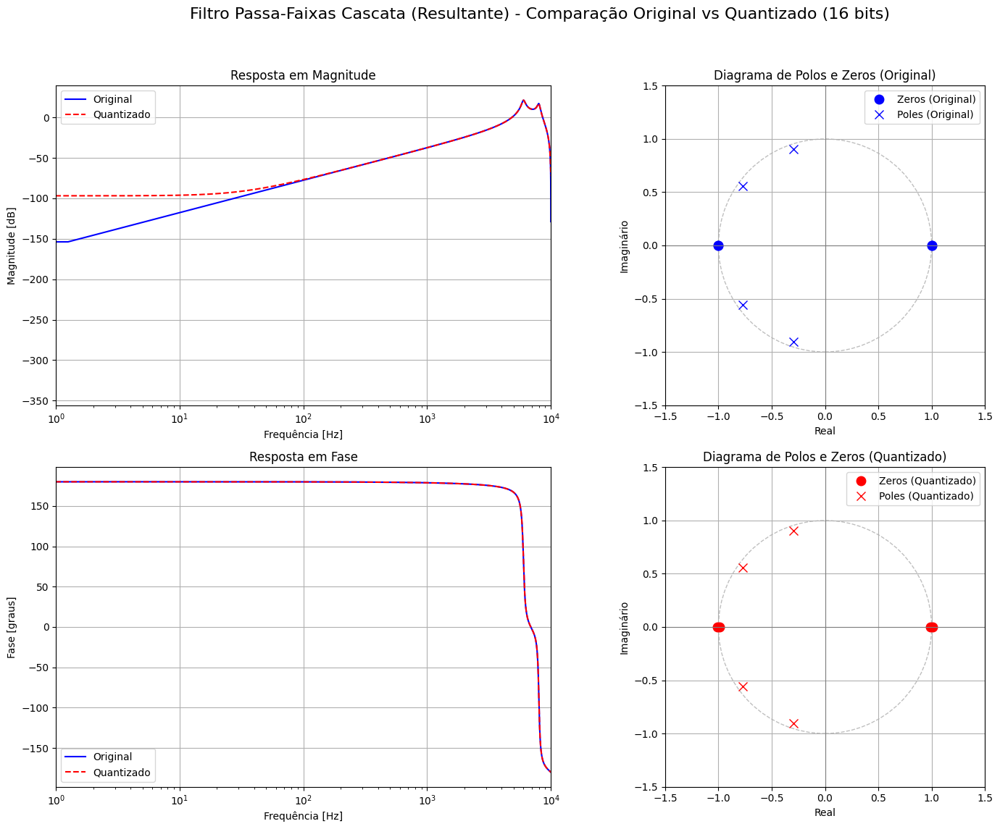

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (16 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 32 bits ---
b_cascaded (Original): [ 0.28277383  0.         -0.56554766  0.          0.28277383]
b_cascaded (Quantizado 32 bits): [ 0.28277383  0.         -0.56554766  0.  

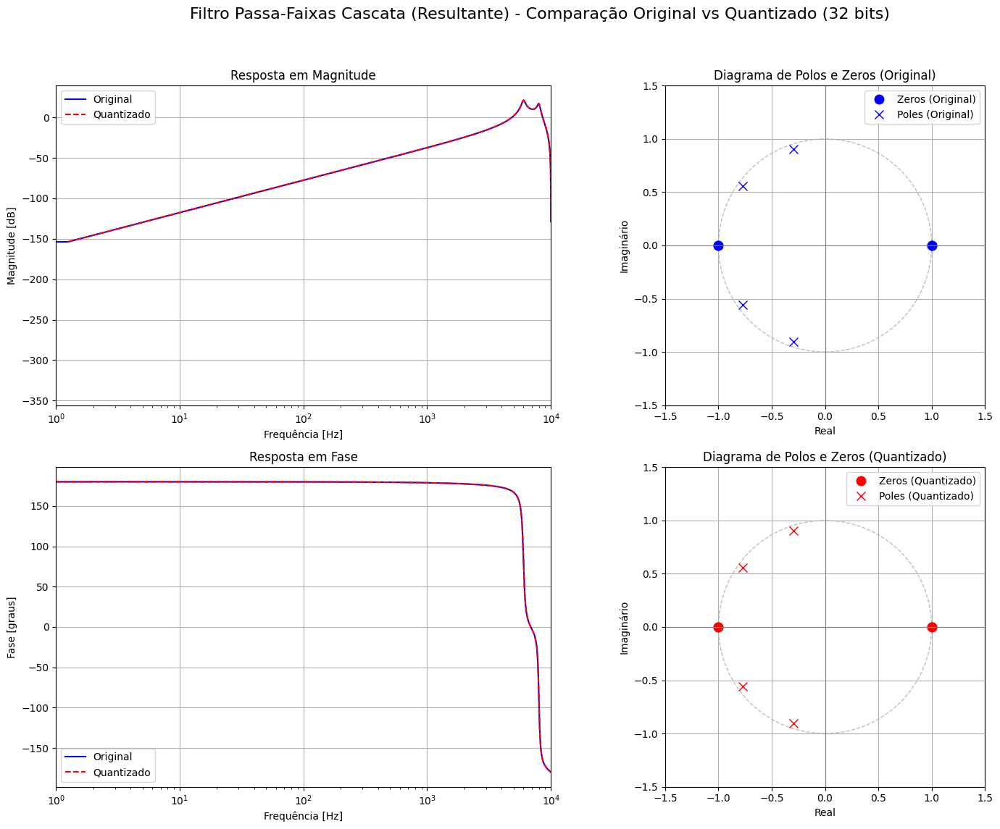

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (32 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.


In [11]:
b_bits_values = [2, 4, 8, 16, 32]

# Original coefficients from Question 2
b_cascaded_orig = b_cascaded
a_cascaded_orig = a_cascaded

# Max absolute value for scaling during quantization
max_abs_val_cascaded = np.max(np.abs(np.concatenate((b_cascaded_orig, a_cascaded_orig))))

print("--- Quantização do Filtro Passa-Faixas Cascata Resultante ---")
for b_bits in b_bits_values:
    print(f"\n--- {b_bits} bits ---")
    b_cascaded_quant = quantize_coefficients(b_cascaded_orig, b_bits, max_abs_val_cascaded)
    a_cascaded_quant = quantize_coefficients(a_cascaded_orig, b_bits, max_abs_val_cascaded)

    print(f"b_cascaded (Original): {b_cascaded_orig}")
    print(f"b_cascaded (Quantizado {b_bits} bits): {b_cascaded_quant}")
    print(f"a_cascaded (Original): {a_cascaded_orig}")
    print(f"a_cascaded (Quantizado {b_bits} bits): {a_cascaded_quant}")

    compare_filter_versions(b_cascaded_orig, a_cascaded_orig, b_cascaded_quant, a_cascaded_quant,
                            fs, f'Filtro Passa-Faixas Cascata (Resultante)', b_bits)


--- Quantização nos Blocos Individuais do Filtro Passa-Faixas Cascata ---

--- 2 bits ---
b_hpf (Quantizado 2 bits): [ 0. -1.  0.]
a_hpf (Quantizado 2 bits): [1. 1. 1.]
b_lpf (Quantizado 2 bits): [1. 1. 1.]
a_lpf (Quantizado 2 bits): [1. 1. 1.]
b_cascaded (Quantizado em Blocos 2 bits): [ 0. -1. -1. -1.  0.]
a_cascaded (Quantizado em Blocos 2 bits): [1. 2. 3. 2. 1.]


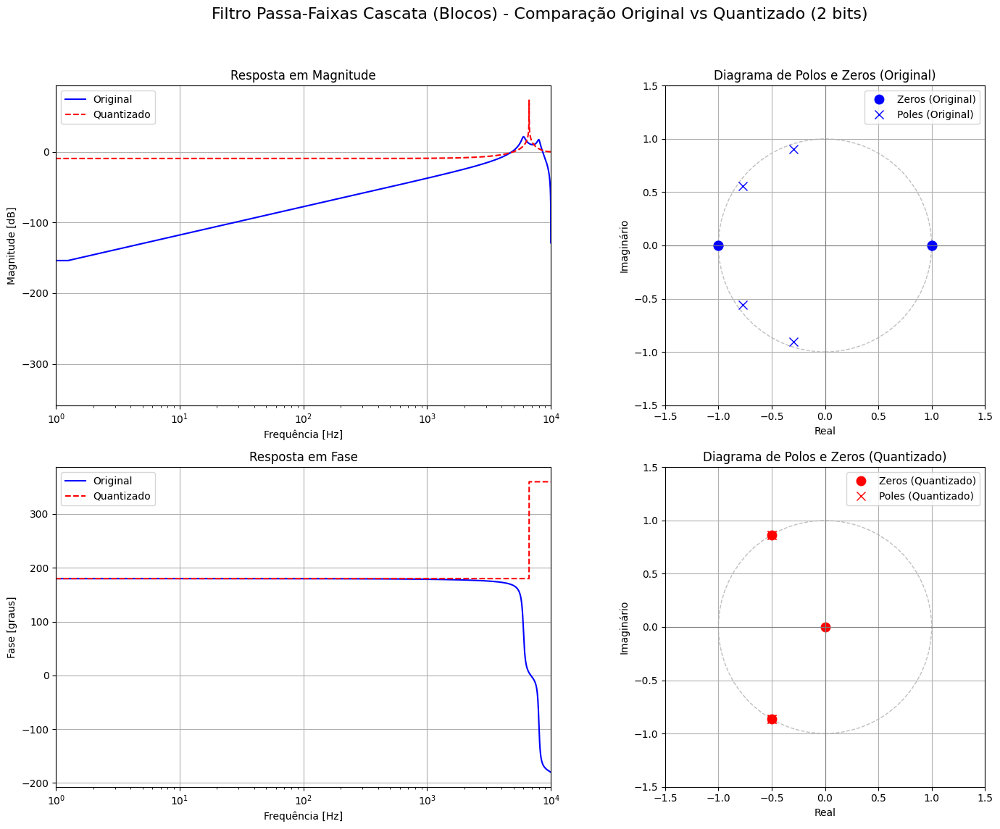

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (2 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 4 bits ---
b_hpf (Quantizado 4 bits): [ 0.25 -0.75  0.25

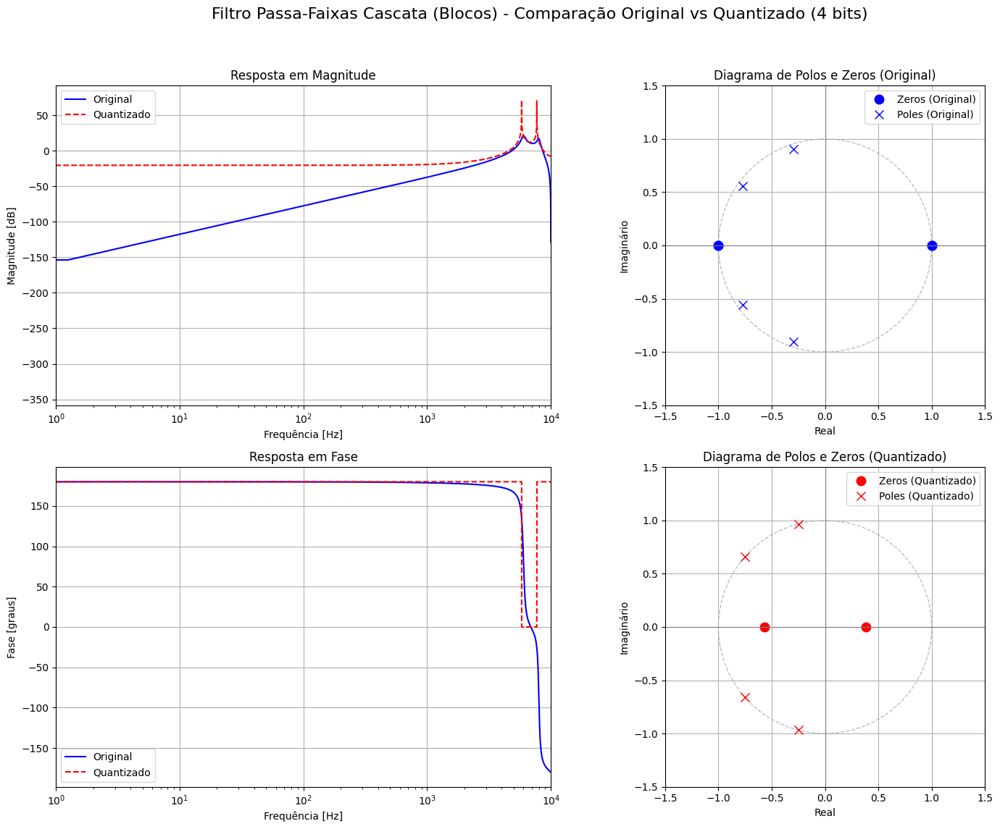

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (4 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 8 bits ---
b_hpf (Quantizado 8 bits): [ 0.328125 -0.6562

/tmp/ipykernel_415/3558647232.py:46: RuntimeWarning: divide by zero encountered in log10
  ax_mag.plot(freq, 20 * np.log10(abs(h)), color=color, linestyle=linestyle, label=label)


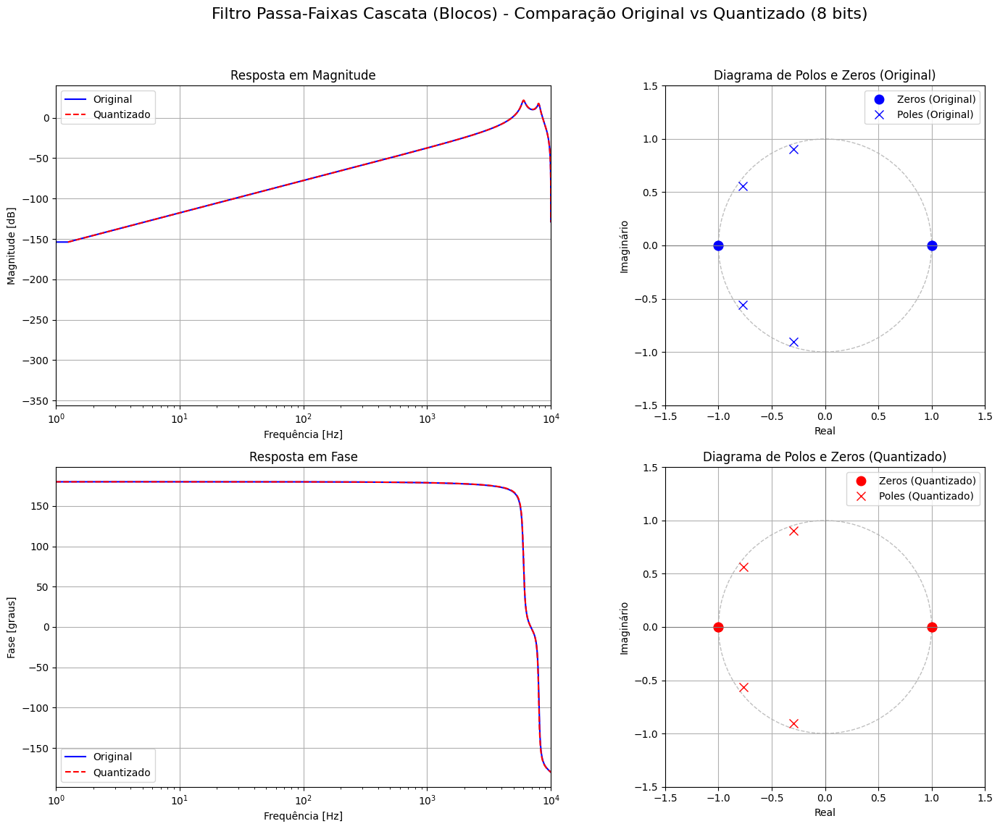

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (8 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 16 bits ---
b_hpf (Quantizado 16 bits): [ 0.32885742 -0.65765381  0.32885742]
a_hpf (Quantizado 16 bits): [1.         0.5871582  0.90252686]
b_lpf (Quantizado 16 bits): [0.8

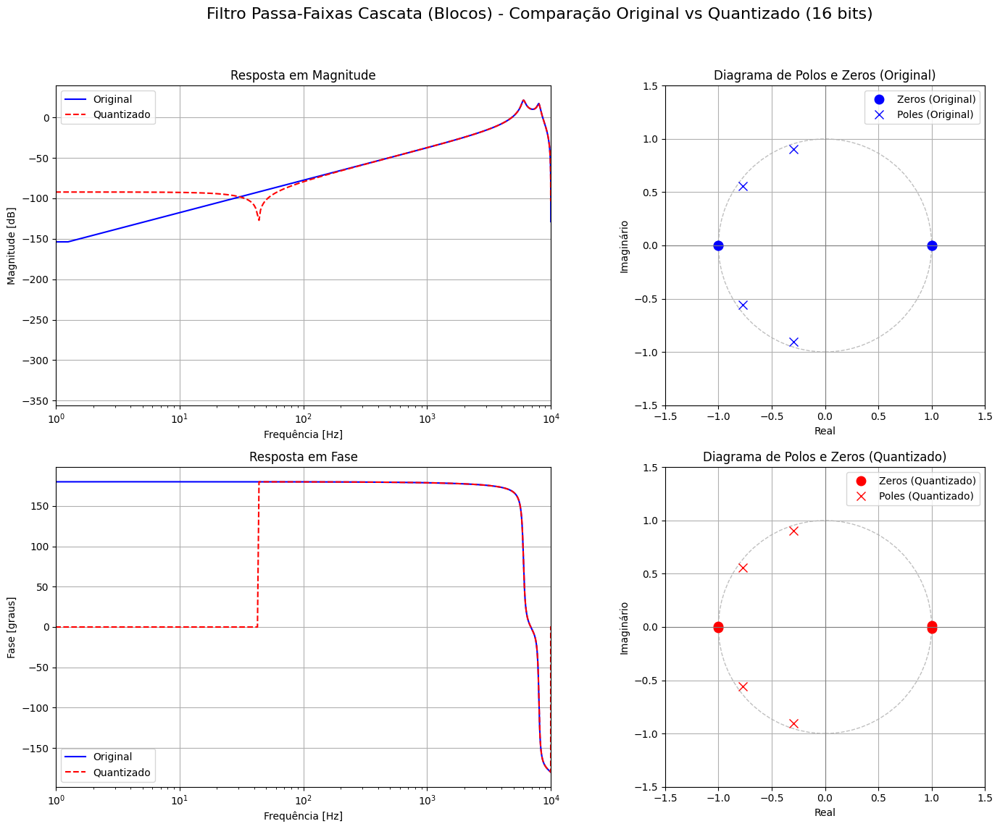

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (16 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 32 bits ---
b_hpf (Quantizado 32 bits): [ 0.32884193 -0.65768385  0.32884193]
a_hpf (Quantizado 32 bits): [1.         0.58713229 0.9025    ]
b_lpf (Quantizado 32 bits): [0.

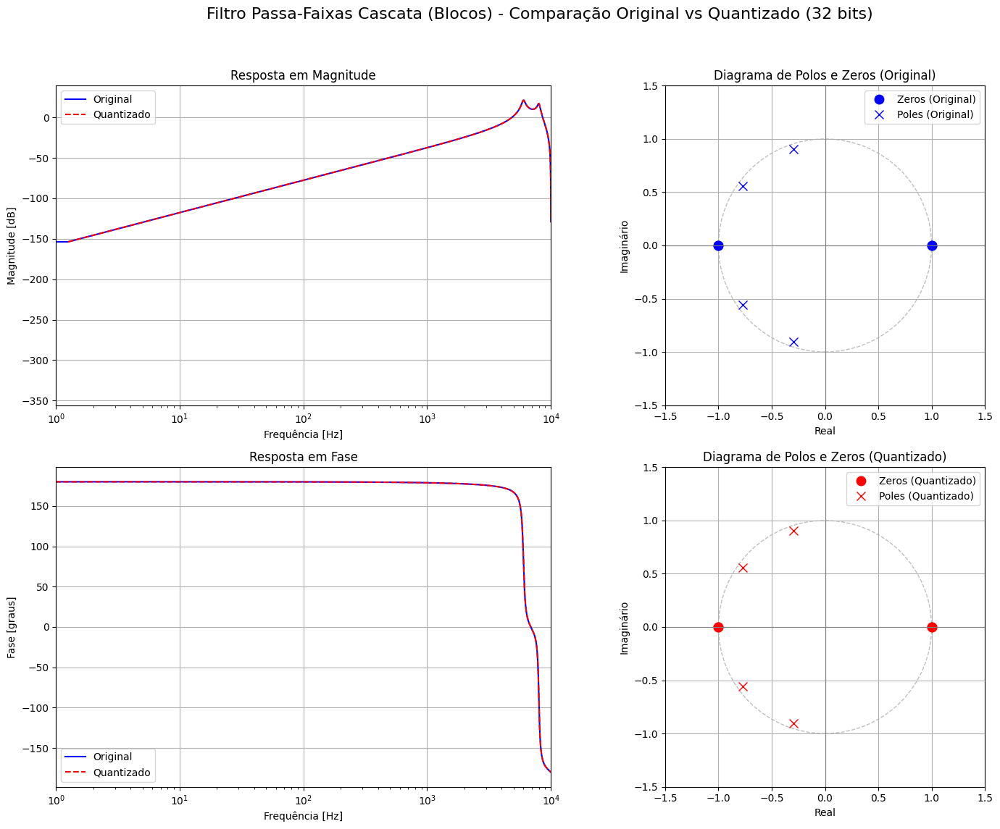

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (32 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.


In [12]:
print("\n--- Quantização nos Blocos Individuais do Filtro Passa-Faixas Cascata ---")

# Original individual block coefficients from Question 2
b_hpf_orig = np.array(b_hpf)
a_hpf_orig = np.array(a_hpf)
b_lpf_orig = np.array(b_lpf)
a_lpf_orig = np.array(a_lpf)

# Max absolute value for individual block coefficients
max_abs_val_blocks = np.max(np.abs(np.concatenate((b_hpf_orig, a_hpf_orig, b_lpf_orig, a_lpf_orig))))

for b_bits in b_bits_values:
    print(f"\n--- {b_bits} bits ---")

    # Quantize individual block coefficients
    b_hpf_quant = quantize_coefficients(b_hpf_orig, b_bits, max_abs_val_blocks)
    a_hpf_quant = quantize_coefficients(a_hpf_orig, b_bits, max_abs_val_blocks)
    b_lpf_quant = quantize_coefficients(b_lpf_orig, b_bits, max_abs_val_blocks)
    a_lpf_quant = quantize_coefficients(a_lpf_orig, b_bits, max_abs_val_blocks)

    # Convolve quantized blocks
    b_cascaded_blocks_quant = np.convolve(b_hpf_quant, b_lpf_quant)
    a_cascaded_blocks_quant = np.convolve(a_hpf_quant, a_lpf_quant)

    print(f"b_hpf (Quantizado {b_bits} bits): {b_hpf_quant}")
    print(f"a_hpf (Quantizado {b_bits} bits): {a_hpf_quant}")
    print(f"b_lpf (Quantizado {b_bits} bits): {b_lpf_quant}")
    print(f"a_lpf (Quantizado {b_bits} bits): {a_lpf_quant}")
    print(f"b_cascaded (Quantizado em Blocos {b_bits} bits): {b_cascaded_blocks_quant}")
    print(f"a_cascaded (Quantizado em Blocos {b_bits} bits): {a_cascaded_blocks_quant}")

    compare_filter_versions(b_cascaded_orig, a_cascaded_orig, b_cascaded_blocks_quant, a_cascaded_blocks_quant,
                            fs, f'Filtro Passa-Faixas Cascata (Blocos)', b_bits)

#### 7.2 Análise de Quantização para o Filtro Rejeita-Faixas em Paralelo (Questão 3)

--- Quantização do Filtro Rejeita-Faixas Paralelo Resultante ---

--- 2 bits ---
b_parallel (Original): [ 0.64628123 -2.33578252  3.4509086  -2.21906821  0.58326881]
b_parallel (Quantizado 2 bits): [ 1. -2.  3. -2.  1.]
a_parallel (Original): [ 1.         -2.39413967  2.86595238 -2.16071105  0.81450625]
a_parallel (Quantizado 2 bits): [ 1. -2.  3. -2.  1.]


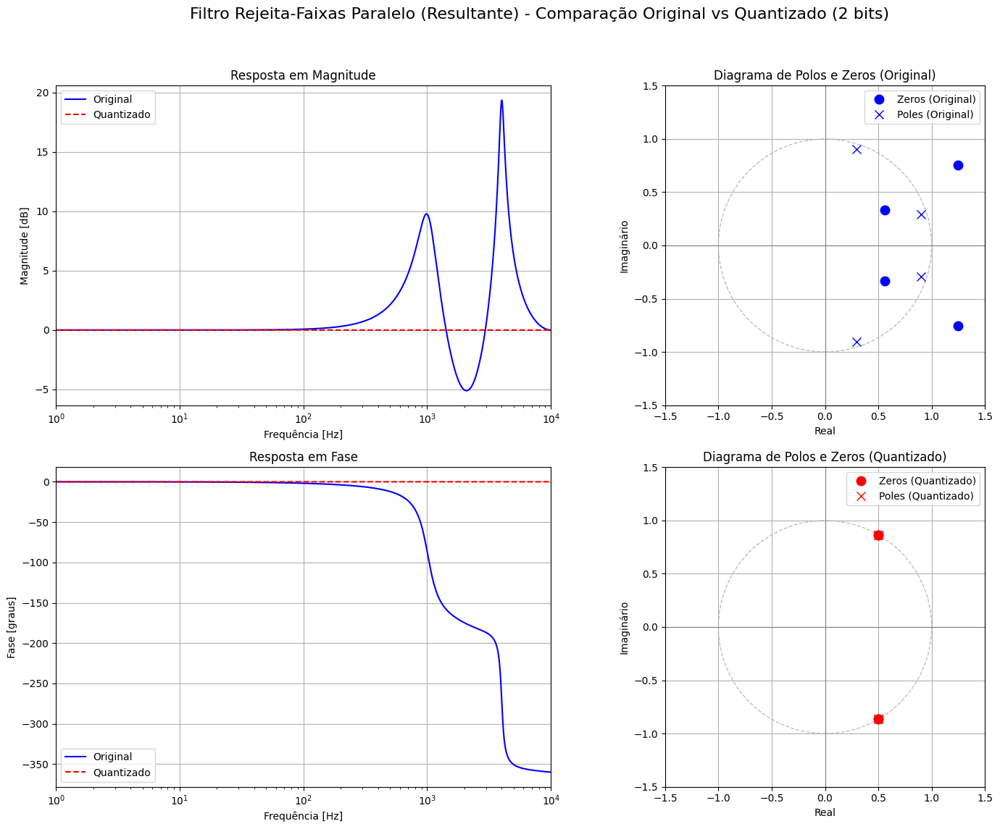

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (2 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 4 bits ---
b_parallel (Original): [ 0.64628123 -2.335782

/tmp/ipykernel_415/3558647232.py:46: RuntimeWarning: divide by zero encountered in log10
  ax_mag.plot(freq, 20 * np.log10(abs(h)), color=color, linestyle=linestyle, label=label)


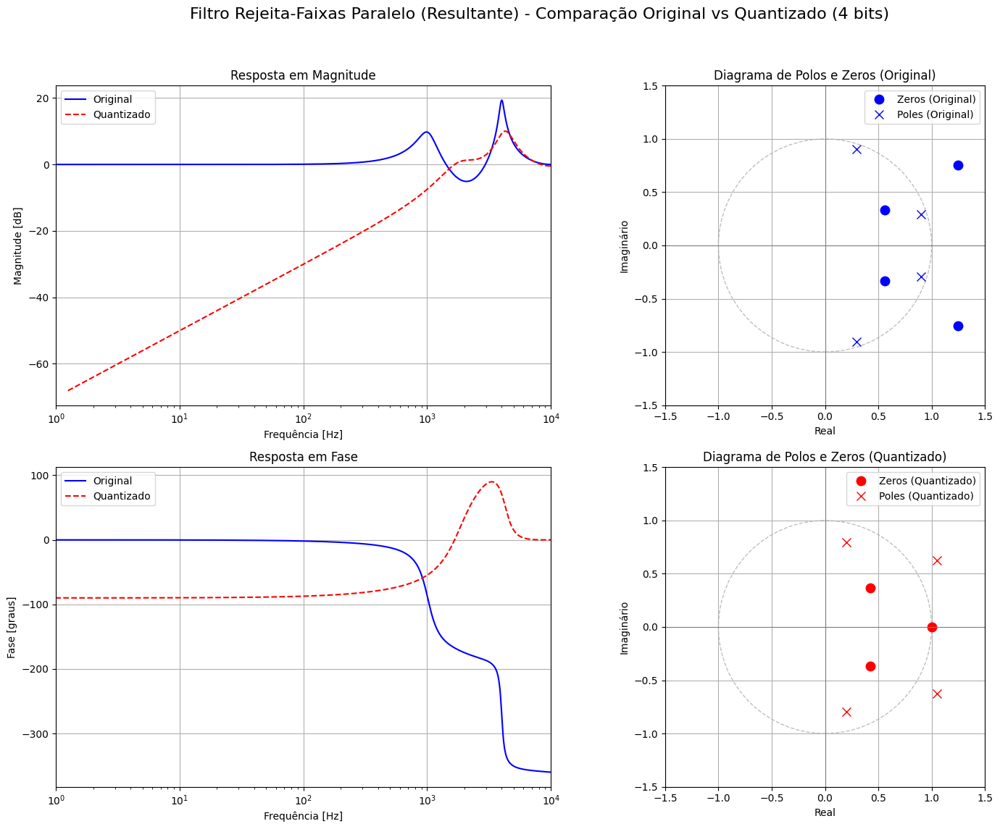

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (4 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 8 bits ---
b_parallel (Original): [ 0.64628123 -2.335782

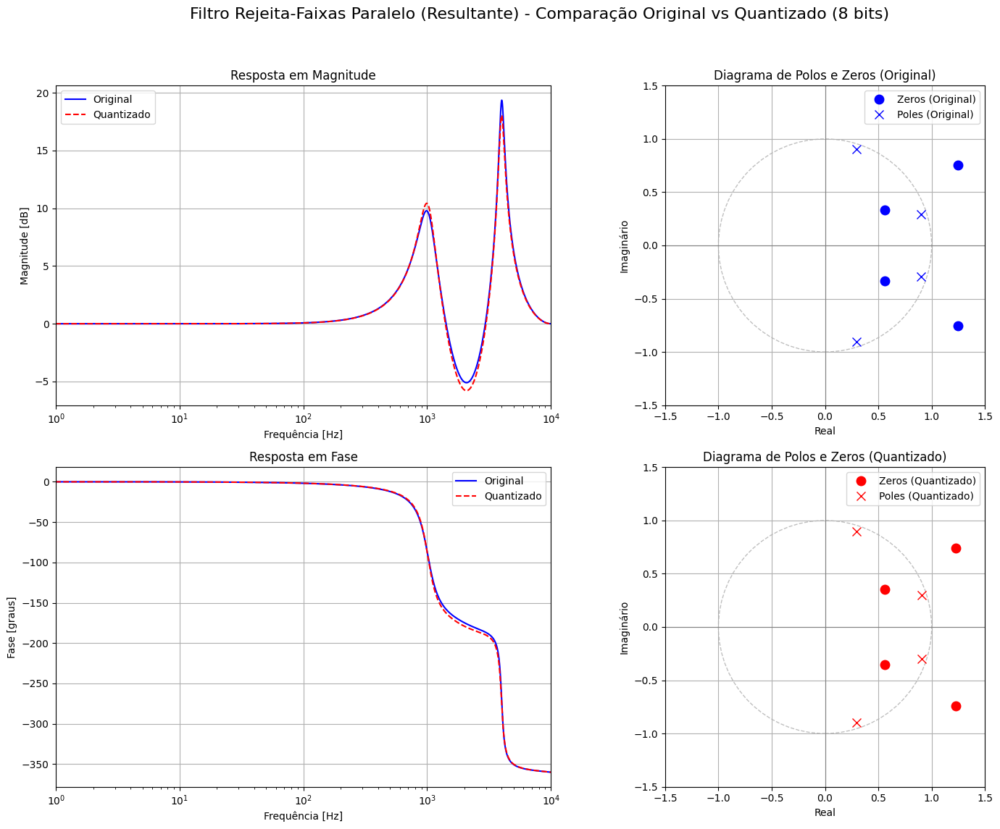

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (8 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 16 bits ---
b_parallel (Original): [ 0.64628123 -2.33578252  3.4509086  -2.21906821  0.58326881]
b_parallel (Quantizado 16 bits): [ 0.64624023 -2.33581543  3.45092773 -2.219

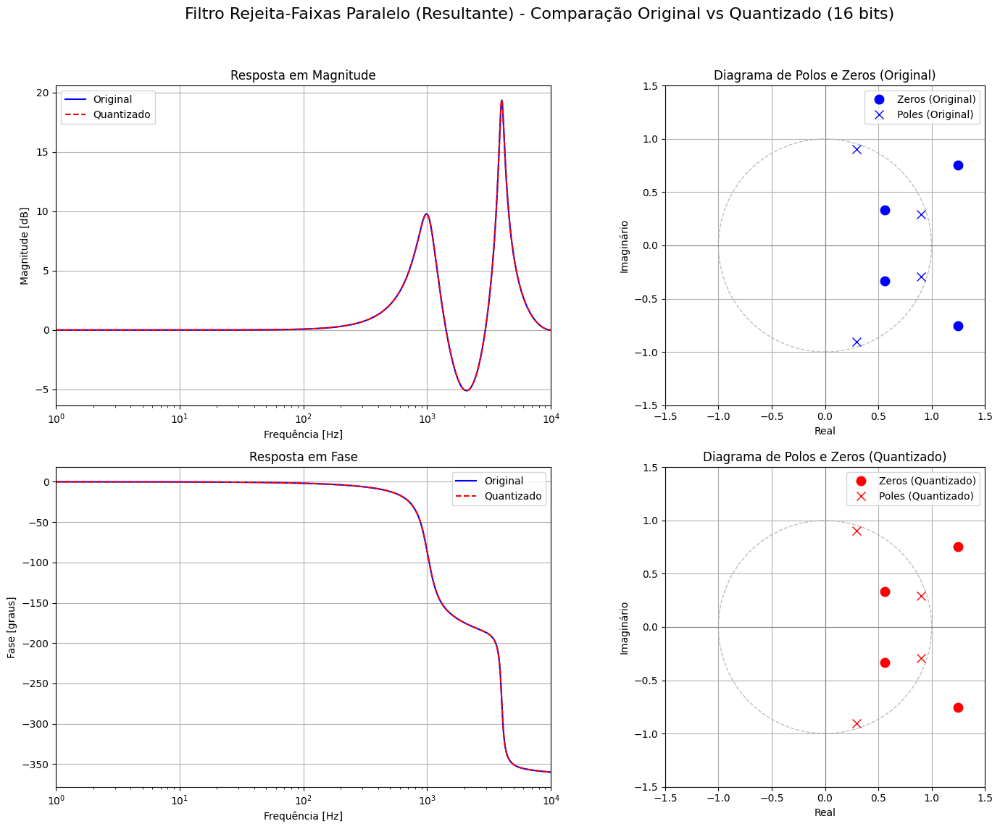

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (16 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 32 bits ---
b_parallel (Original): [ 0.64628123 -2.33578252  3.4509086  -2.21906821  0.58326881]
b_parallel (Quantizado 32 bits): [ 0.64628123 -2.33578251  3.4509086  -2.21

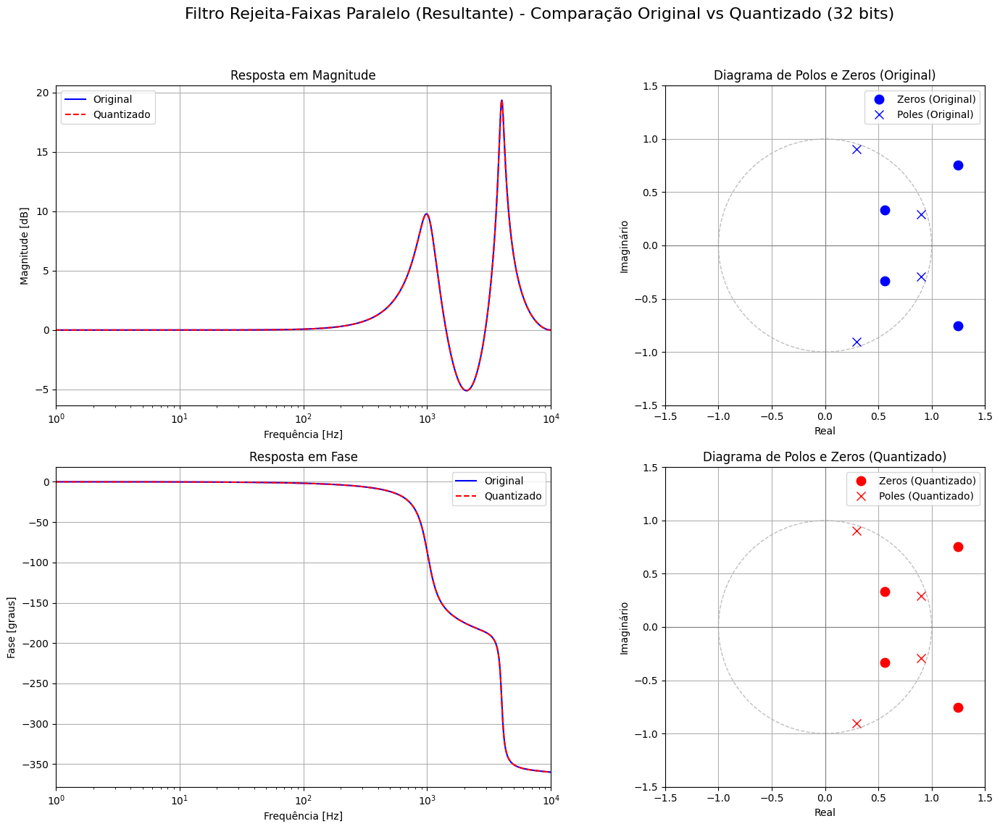

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (32 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.


In [13]:
b_bits_values = [2, 4, 8, 16, 32]

# Original coefficients from Question 3
b_parallel_orig = b_parallel
a_parallel_orig = a_parallel

# Max absolute value for scaling during quantization
max_abs_val_parallel = np.max(np.abs(np.concatenate((b_parallel_orig, a_parallel_orig))))

print("--- Quantização do Filtro Rejeita-Faixas Paralelo Resultante ---")
for b_bits in b_bits_values:
    print(f"\n--- {b_bits} bits ---")
    b_parallel_quant = quantize_coefficients(b_parallel_orig, b_bits, max_abs_val_parallel)
    a_parallel_quant = quantize_coefficients(a_parallel_orig, b_bits, max_abs_val_parallel)

    print(f"b_parallel (Original): {b_parallel_orig}")
    print(f"b_parallel (Quantizado {b_bits} bits): {b_parallel_quant}")
    print(f"a_parallel (Original): {a_parallel_orig}")
    print(f"a_parallel (Quantizado {b_bits} bits): {a_parallel_quant}")

    compare_filter_versions(b_parallel_orig, a_parallel_orig, b_parallel_quant, a_parallel_quant,
                            fs, f'Filtro Rejeita-Faixas Paralelo (Resultante)', b_bits)


--- Quantização nos Blocos Individuais do Filtro Rejeita-Faixas Paralelo ---

--- 2 bits ---
b_lpf_par (Quantizado 2 bits): [0. 0. 0.]
a_lpf_par (Quantizado 2 bits): [ 1. -2.  1.]
b_hpf_par (Quantizado 2 bits): [ 1. -1.  1.]
a_hpf_par (Quantizado 2 bits): [ 1. -1.  1.]
b_parallel (Quantizado em Blocos 2 bits): [ 1. -3.  4. -3.  1.]
a_parallel (Quantizado em Blocos 2 bits): [ 1. -3.  4. -3.  1.]


/usr/local/lib/python3.12/dist-packages/scipy/signal/_filter_design.py:564: RuntimeWarning: invalid value encountered in divide
  h = (_pu.npp_polyval(zm1, b, tensor=False, xp=xp) /


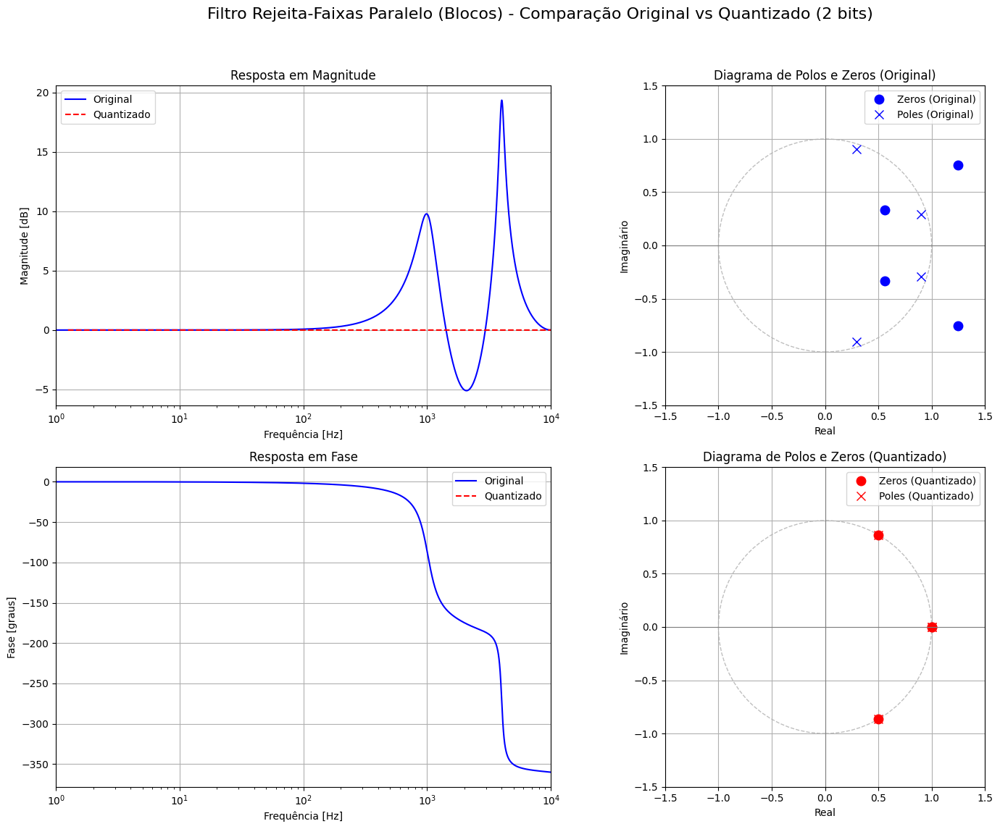

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (2 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 4 bits ---
b_lpf_par (Quantizado 4 bits): [0. 0. 0.]
a_lpf_par (Quantizado 4 bits): [ 1.   -1.75  1.  ]
b_hpf_par (Quantizado 4 bits): [ 0.5  -1.25  0.5 ]
a_hpf_par (Quantiz

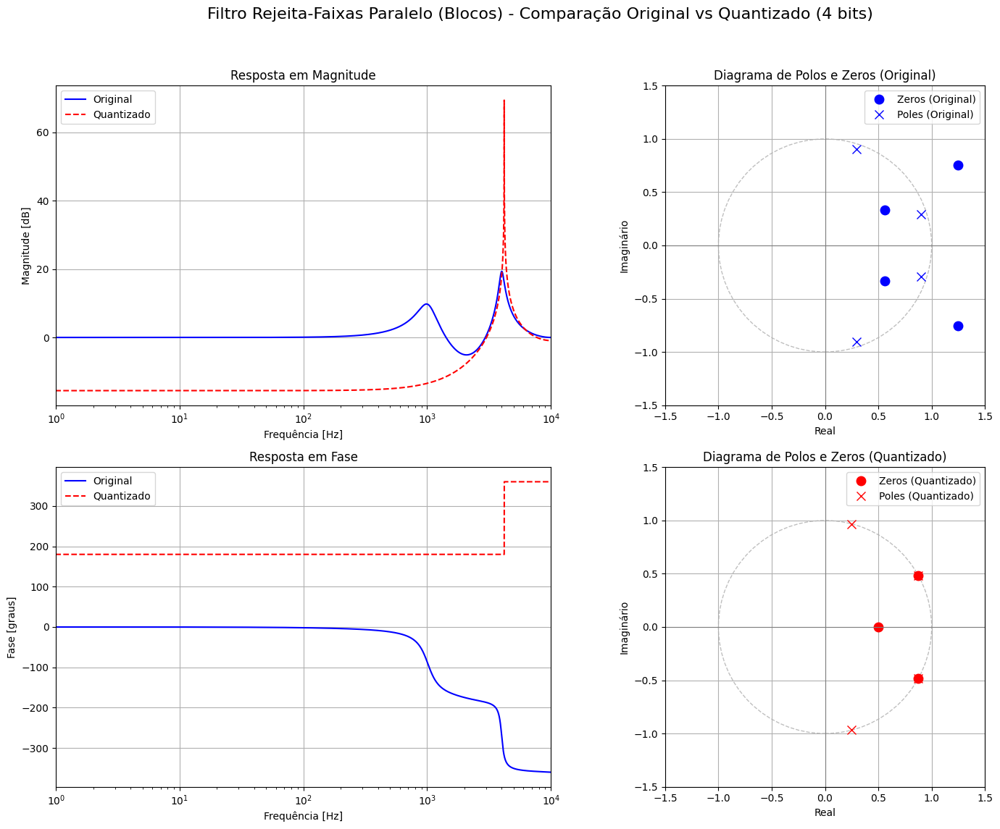

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (4 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 8 bits ---
b_lpf_par (Quantizado 8 bits): [0.03125  0.04

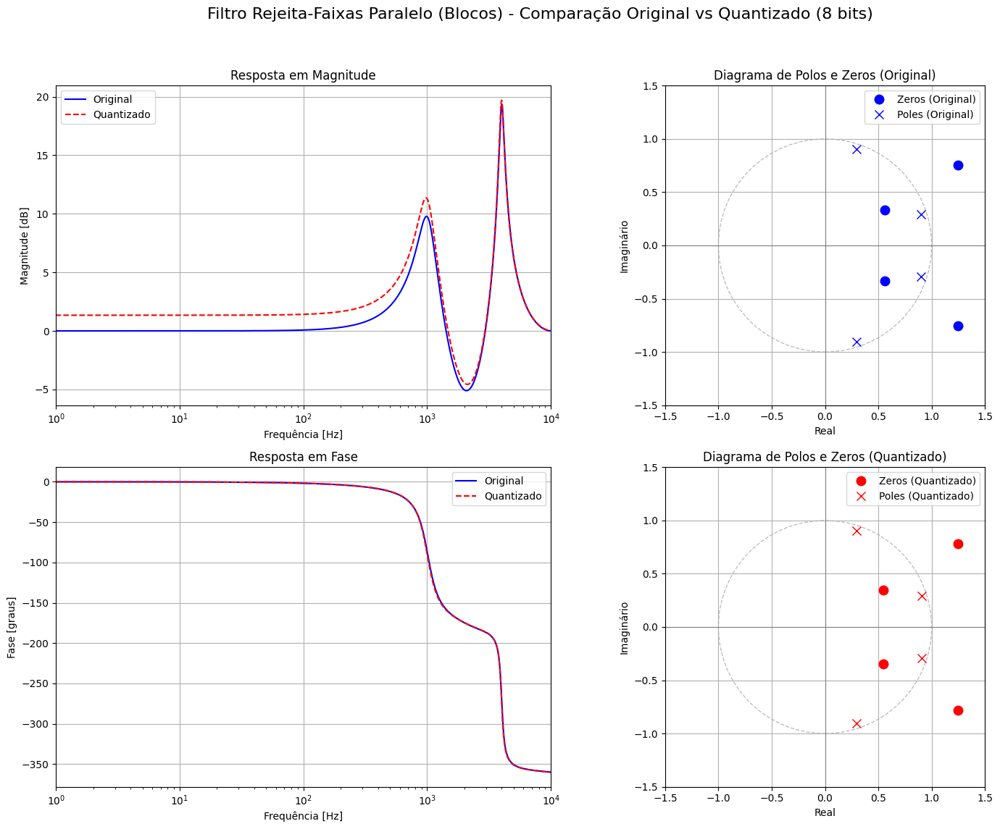

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (8 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 16 bits ---
b_lpf_par (Quantizado 16 bits): [0.02386475 0.04772949 0.02386475]
a_lpf_par (Quantizado 16 bits): [ 1.         -1.80700684  0.90252686]
b_hpf_par (Quantizado 16

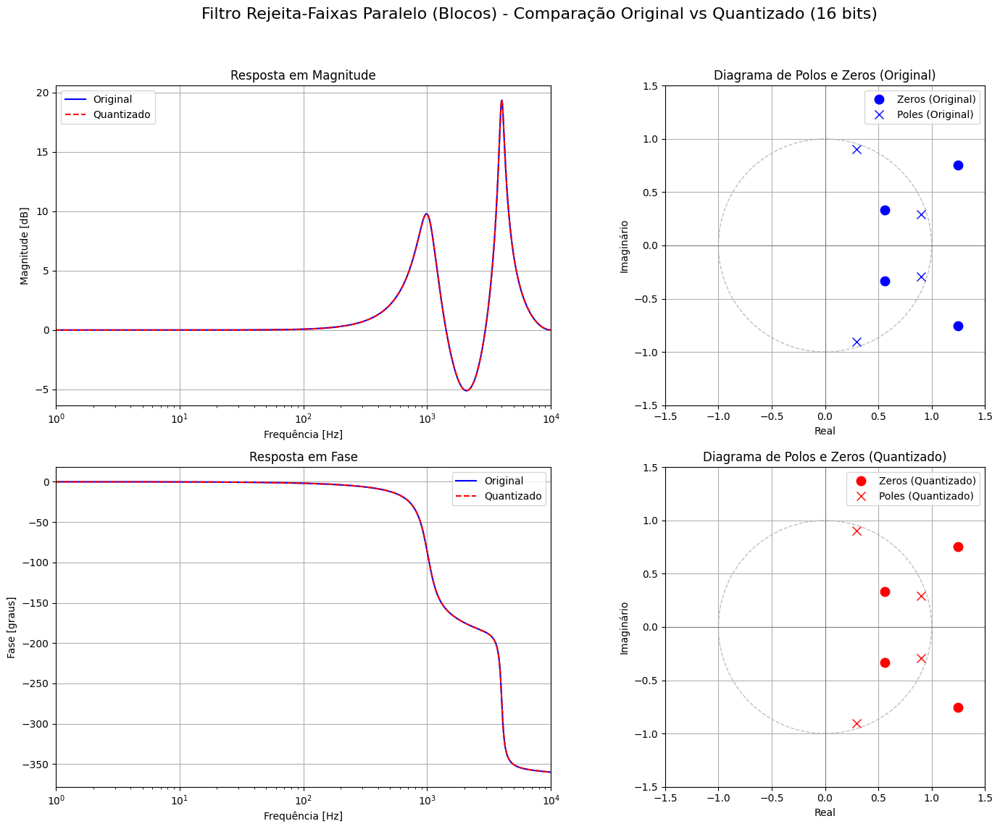

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (16 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

--- 32 bits ---
b_lpf_par (Quantizado 32 bits): [0.02387316 0.04774631 0.02387316]
a_lpf_par (Quantizado 32 bits): [ 1.         -1.80700738  0.9025    ]
b_hpf_par (Quantizado 3

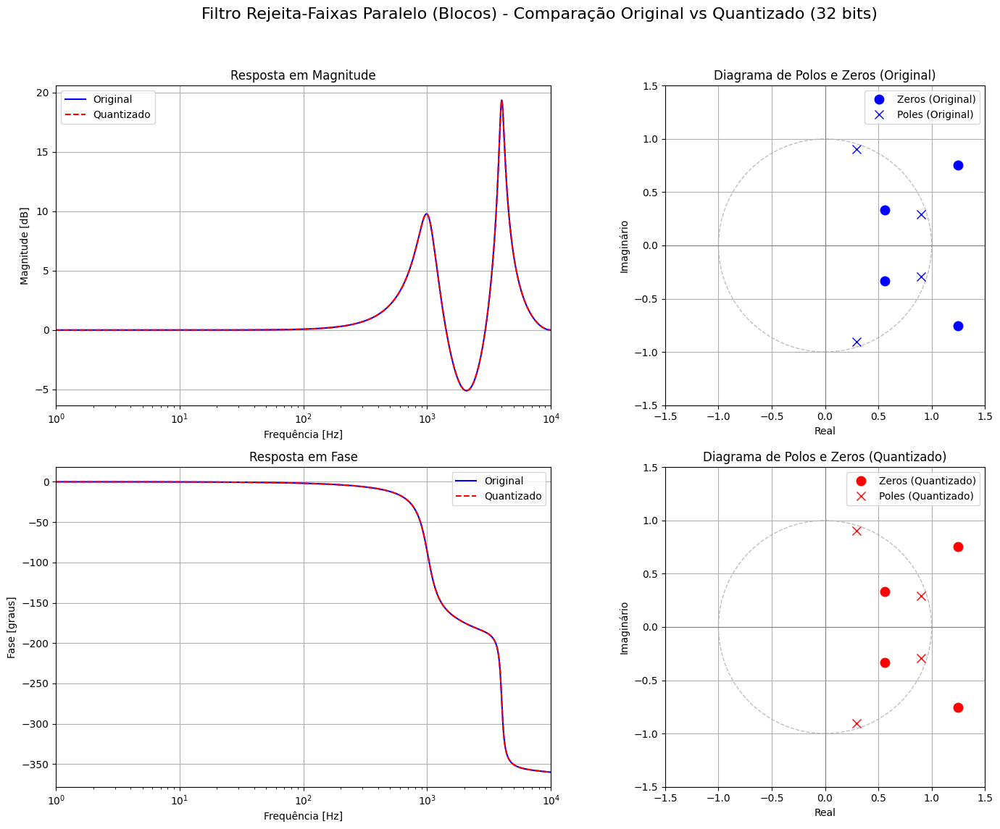

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (32 bits): Estável
O filtro quantizado permanece estável.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.


In [14]:
print("\n--- Quantização nos Blocos Individuais do Filtro Rejeita-Faixas Paralelo ---")

# Original individual block coefficients from Question 3
b_lpf_par_orig = np.array(b_lpf_par)
a_lpf_par_orig = np.array(a_lpf_par)
b_hpf_par_orig = np.array(b_hpf_par)
a_hpf_par_orig = np.array(a_hpf_par)

# Max absolute value for individual block coefficients
max_abs_val_blocks_par = np.max(np.abs(np.concatenate((b_lpf_par_orig, a_lpf_par_orig, b_hpf_par_orig, a_hpf_par_orig))))

for b_bits in b_bits_values:
    print(f"\n--- {b_bits} bits ---")

    # Quantize individual block coefficients
    b_lpf_par_quant = quantize_coefficients(b_lpf_par_orig, b_bits, max_abs_val_blocks_par)
    a_lpf_par_quant = quantize_coefficients(a_lpf_par_orig, b_bits, max_abs_val_blocks_par)
    b_hpf_par_quant = quantize_coefficients(b_hpf_par_orig, b_bits, max_abs_val_blocks_par)
    a_hpf_par_quant = quantize_coefficients(a_hpf_par_orig, b_bits, max_abs_val_blocks_par)

    # Reconstruct the parallel filter with quantized blocks
    b_term1_quant = np.convolve(b_lpf_par_quant, a_hpf_par_quant)
    b_term2_quant = np.convolve(b_hpf_par_quant, a_lpf_par_quant)

    b_parallel_blocks_quant = b_term1_quant + b_term2_quant
    a_parallel_blocks_quant = np.convolve(a_lpf_par_quant, a_hpf_par_quant)

    print(f"b_lpf_par (Quantizado {b_bits} bits): {b_lpf_par_quant}")
    print(f"a_lpf_par (Quantizado {b_bits} bits): {a_lpf_par_quant}")
    print(f"b_hpf_par (Quantizado {b_bits} bits): {b_hpf_par_quant}")
    print(f"a_hpf_par (Quantizado {b_bits} bits): {a_hpf_par_quant}")
    print(f"b_parallel (Quantizado em Blocos {b_bits} bits): {b_parallel_blocks_quant}")
    print(f"a_parallel (Quantizado em Blocos {b_bits} bits): {a_parallel_blocks_quant}")

    compare_filter_versions(b_parallel_orig, a_parallel_orig, b_parallel_blocks_quant, a_parallel_blocks_quant,
                            fs, f'Filtro Rejeita-Faixas Paralelo (Blocos)', b_bits)

QUESTÃO 5: Deseja-se aplicar técnicas de processamento digital de sinais para análise, modelagem e remoção de interferências em um sinal de áudio corrompido utilizando filtros IIR implementados em cascata de blocos de 2ª ordem. Considere o arquivo de áudio handel.wav. Seja x(t) o sinal de áudio original e construa um sinal contaminado dado por y(t) = x(t) + 0.05 cos(200πt) + 0.075 sin(4000πt) + n(t), onde x(t) é o sinal de áudio proveniente do arquivo handel.wav, o termo 0.05 cos(200πt) representa uma interferência senoidal de baixa frequência, o termo 0.075 sin(4000πt) representa uma interferência tonal de alta frequência e e n(t) é um sinal de ruído branco com variância σ^2 ∈ {10^−2, 10^−1, 1}. Faça os itens a seguir.

Letra A: (a) Gere o sinal contaminado y(t) para cada valor de variância especificado. Compare x(t) e y(t) no domínio do tempo e da frequência. Identifique visualmente as interferências presentes no espectro. Avalie subjetivamente y(t). Comente os resultados obtidos.

### 8. Análise e Remoção de Interferências em Sinal de Áudio (Questão 5)

#### 8.1 Geração do Sinal Contaminado `y(t)` e Análise (Questão 5a)

In [15]:
from scipy.io import wavfile
from IPython.display import Audio
import warnings
warnings.filterwarnings('ignore') # Ignore warnings, especially for RuntimeWarning: divide by zero encountered in log10

# Carregar o arquivo de áudio handel.wav
# Certifique-se de que o arquivo 'handel.wav' está disponível no ambiente Colab
# Se não estiver, você pode fazer o upload ou baixá-lo.
# Exemplo: !wget https://www.signalogic.com/index.nu/doc/SIGNALINGO/handel.wav

# Tentar carregar o arquivo. Se não existir, uma mensagem de erro será exibida.
try:
    audio_fs, x_t = wavfile.read('/content/handel.wav')
except FileNotFoundError:
    print("Erro: Arquivo 'handel.wav' não encontrado. Por favor, faça o upload do arquivo ou forneça o caminho correto.")
    # Criar um sinal de áudio simulado para continuar a execução, se necessário
    audio_fs = 44100 # Exemplo de fs
    t_sim = np.arange(0, 3, 1/audio_fs) # 3 segundos de áudio
    x_t = 0.5 * np.sin(2 * np.pi * 440 * t_sim) # Tom senoidal de 440Hz
    x_t = (x_t * 32767).astype(np.int16) # Normalizar para int16
    print("Usando sinal de áudio simulado para demonstração.")

# Se o áudio for stereo, pegar apenas um canal
if x_t.ndim > 1:
    x_t = x_t[:, 0] # Pega o primeiro canal

# Normalizar o sinal x(t) para o intervalo [-1, 1] se for int16, para cálculos com floats
x_t = x_t.astype(np.float64) / np.iinfo(np.int16).max

# Parâmetros das interferências senoidais
f_sin1 = 100 # Hz (200πt = 2πft => f = 100 Hz)
ampl_sin1 = 0.05
f_sin2 = 2000 # Hz (4000πt = 2πft => f = 2000 Hz)
ampl_sin2 = 0.075

print(f"Frequência de amostragem do áudio (audio_fs): {audio_fs} Hz")
print(f"Duração do áudio: {len(x_t) / audio_fs:.2f} segundos")

# Vetor de tempo para o sinal de áudio
t = np.arange(len(x_t)) / audio_fs

# Função para reproduzir áudio
def play_audio(signal, sample_rate, name="Sinal"):
    print(f"Reproduzindo: {name}")
    display(Audio(signal, rate=sample_rate))

# Função para calcular e plotar o espectro (FFT)
def plot_spectrum(signal, sample_rate, title, ax):
    N = len(signal)
    yf = np.fft.fft(signal)
    xf = np.fft.fftfreq(N, 1/sample_rate)

    # Plotar apenas a parte positiva das frequências
    positive_freqs = xf[:N//2]
    magnitude = 20 * np.log10(np.abs(yf[:N//2]) + 1e-10) # Adiciona 1e-10 para evitar log(0)

    ax.plot(positive_freqs, magnitude)
    ax.set_title(title)
    ax.set_xlabel('Frequência [Hz]')
    ax.set_ylabel('Magnitude [dB]')
    ax.grid(True)
    ax.set_xlim([0, sample_rate / 2])

print("Setup completo para a Questão 5a.")

Erro: Arquivo 'handel.wav' não encontrado. Por favor, faça o upload do arquivo ou forneça o caminho correto.
Usando sinal de áudio simulado para demonstração.
Frequência de amostragem do áudio (audio_fs): 44100 Hz
Duração do áudio: 3.00 segundos
Setup completo para a Questão 5a.


In [16]:
def generate_and_analyze_y_t(x_t_original, audio_fs, t_vector, f_sin1, ampl_sin1, f_sin2, ampl_sin2, variance_n, title_suffix):
    # Gerar interferências senoidais
    interference_sin1 = ampl_sin1 * np.cos(2 * np.pi * f_sin1 * t_vector)
    interference_sin2 = ampl_sin2 * np.sin(2 * np.pi * f_sin2 * t_vector)

    # Gerar ruído branco gaussiano
    std_dev_n = np.sqrt(variance_n)
    n_t = std_dev_n * np.random.randn(len(x_t_original))

    # Sinal contaminado y(t)
    y_t = x_t_original + interference_sin1 + interference_sin2 + n_t

    print(f"\n--- Análise para {title_suffix} ---")

    # Comparação no domínio do tempo
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8), sharex=True)
    ax1.plot(t_vector, x_t_original)
    ax1.set_title(f'Sinal Original x(t) - {title_suffix}')
    ax1.set_ylabel('Amplitude')
    ax1.grid(True)

    ax2.plot(t_vector, y_t, color='orange')
    ax2.set_title(f'Sinal Contaminado y(t) - {title_suffix}')
    ax2.set_xlabel('Tempo [s]')
    ax2.set_ylabel('Amplitude')
    ax2.grid(True)
    plt.tight_layout()
    plt.show()

    # Comparação no domínio da frequência
    fig, (ax1_spec, ax2_spec) = plt.subplots(2, 1, figsize=(15, 8), sharex=True)
    plot_spectrum(x_t_original, audio_fs, f'Espectro de x(t) - {title_suffix}', ax1_spec)
    plot_spectrum(y_t, audio_fs, f'Espectro de y(t) - {title_suffix}', ax2_spec)

    # Adicionar linhas para as frequências das interferências para identificação visual
    ax2_spec.axvline(f_sin1, color='red', linestyle='--', label=f'Interferência 1 ({f_sin1} Hz)')
    ax2_spec.axvline(f_sin2, color='green', linestyle='--', label=f'Interferência 2 ({f_sin2} Hz)')
    ax2_spec.legend()

    plt.tight_layout()
    plt.show()

    # Avaliação Subjetiva
    print("\nAvaliação Subjetiva do Sinal Contaminado:")
    if variance_n == 0.01:
        print("Com variância de ruído de 0.01 (baixa), as interferências senoidais são claramente visíveis no domínio da frequência. No domínio do tempo, o sinal `y(t)` apresenta distorções notáveis devido a essas interferências. O ruído branco é menos perceptível.")
    elif variance_n == 0.1:
        print("Com variância de ruído de 0.1 (média), as interferências senoidais ainda são identificáveis no espectro, mas o ruído branco começa a mascarar um pouco a sua proeminência e a tornar o sinal mais 'granuloso' no domínio do tempo.")
    elif variance_n == 1:
        print("Com variância de ruído de 1 (alta), o ruído branco domina o sinal. As interferências senoidais são quase completamente mascaradas pelo ruído no domínio da frequência e o sinal `y(t)` é fortemente distorcido, soando muito 'ruidoso' e com a informação original difícil de discernir.")
    else:
        print("Comentário genérico sobre a influência da variância do ruído e das interferências.")

    play_audio(x_t_original, audio_fs, "Sinal Original x(t)")
    play_audio(y_t, audio_fs, f"Sinal Contaminado y(t) ({title_suffix})")

    print("\nComentários Gerais sobre os Resultados:")
    print("- No espectro, as interferências senoidais aparecem como picos discretos e bem definidos nas suas respectivas frequências (100 Hz e 2000 Hz).")
    print("- O ruído branco, por sua vez, eleva o 'piso' de ruído em todo o espectro, especialmente visível em variâncias mais altas.")
    print("- A identificação visual das interferências no espectro é mais fácil para as senoides do que para o ruído branco, que se distribui amplamente.")
    print("- A avaliação subjetiva auditiva reforça a observação dos gráficos: ruído baixo permite distinguir as senoides como 'zumbidos' ou 'tons', enquanto ruído alto as abafa completamente, degradando severamente a qualidade do áudio.")


--- Análise para σ² = 0.01 ---


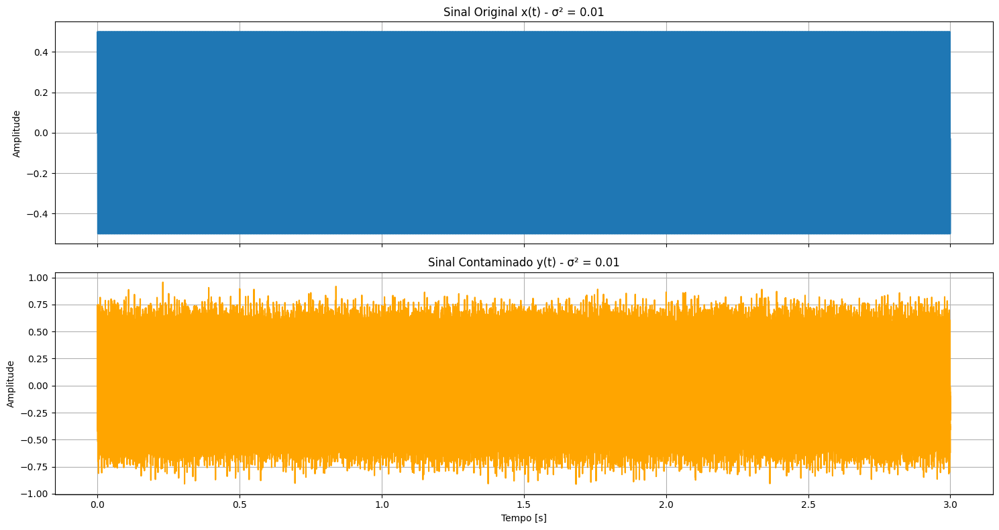

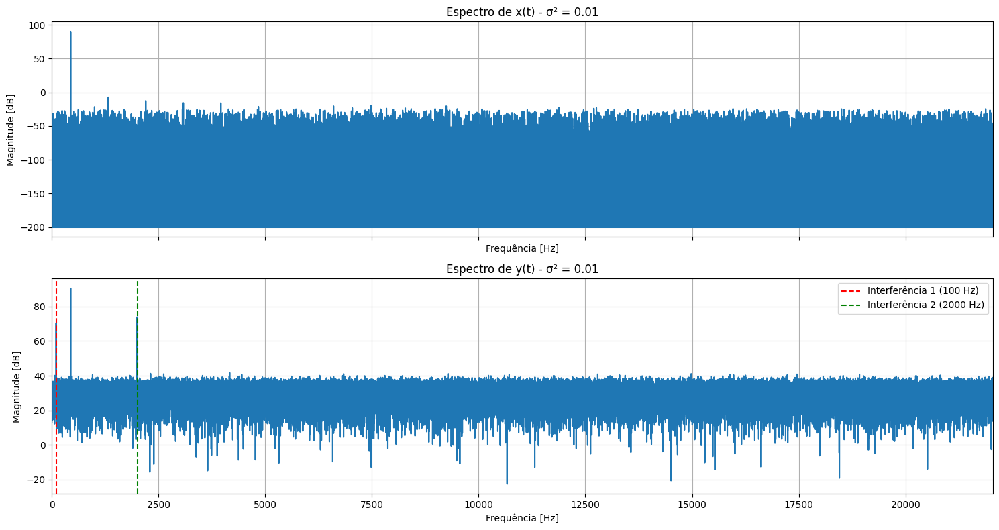


Avaliação Subjetiva do Sinal Contaminado:
Com variância de ruído de 0.01 (baixa), as interferências senoidais são claramente visíveis no domínio da frequência. No domínio do tempo, o sinal `y(t)` apresenta distorções notáveis devido a essas interferências. O ruído branco é menos perceptível.
Reproduzindo: Sinal Original x(t)


Reproduzindo: Sinal Contaminado y(t) (σ² = 0.01)



Comentários Gerais sobre os Resultados:
- No espectro, as interferências senoidais aparecem como picos discretos e bem definidos nas suas respectivas frequências (100 Hz e 2000 Hz).
- O ruído branco, por sua vez, eleva o 'piso' de ruído em todo o espectro, especialmente visível em variâncias mais altas.
- A identificação visual das interferências no espectro é mais fácil para as senoides do que para o ruído branco, que se distribui amplamente.
- A avaliação subjetiva auditiva reforça a observação dos gráficos: ruído baixo permite distinguir as senoides como 'zumbidos' ou 'tons', enquanto ruído alto as abafa completamente, degradando severamente a qualidade do áudio.

--- Análise para σ² = 0.1 ---


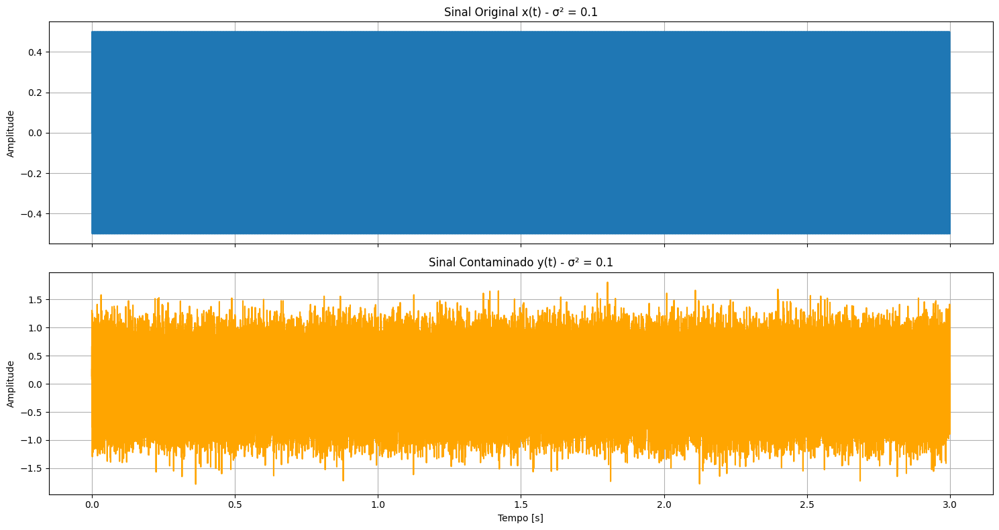

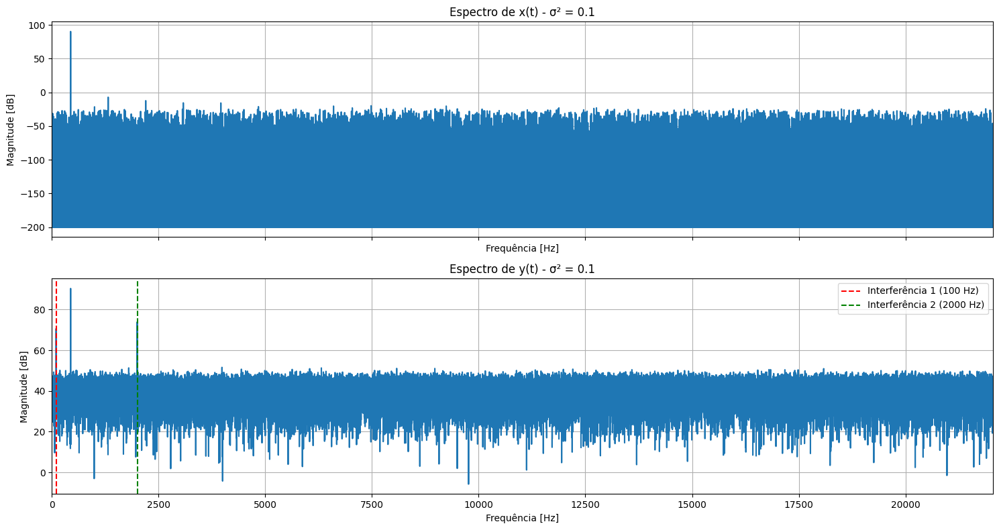


Avaliação Subjetiva do Sinal Contaminado:
Com variância de ruído de 0.1 (média), as interferências senoidais ainda são identificáveis no espectro, mas o ruído branco começa a mascarar um pouco a sua proeminência e a tornar o sinal mais 'granuloso' no domínio do tempo.
Reproduzindo: Sinal Original x(t)


Reproduzindo: Sinal Contaminado y(t) (σ² = 0.1)



Comentários Gerais sobre os Resultados:
- No espectro, as interferências senoidais aparecem como picos discretos e bem definidos nas suas respectivas frequências (100 Hz e 2000 Hz).
- O ruído branco, por sua vez, eleva o 'piso' de ruído em todo o espectro, especialmente visível em variâncias mais altas.
- A identificação visual das interferências no espectro é mais fácil para as senoides do que para o ruído branco, que se distribui amplamente.
- A avaliação subjetiva auditiva reforça a observação dos gráficos: ruído baixo permite distinguir as senoides como 'zumbidos' ou 'tons', enquanto ruído alto as abafa completamente, degradando severamente a qualidade do áudio.

--- Análise para σ² = 1 ---


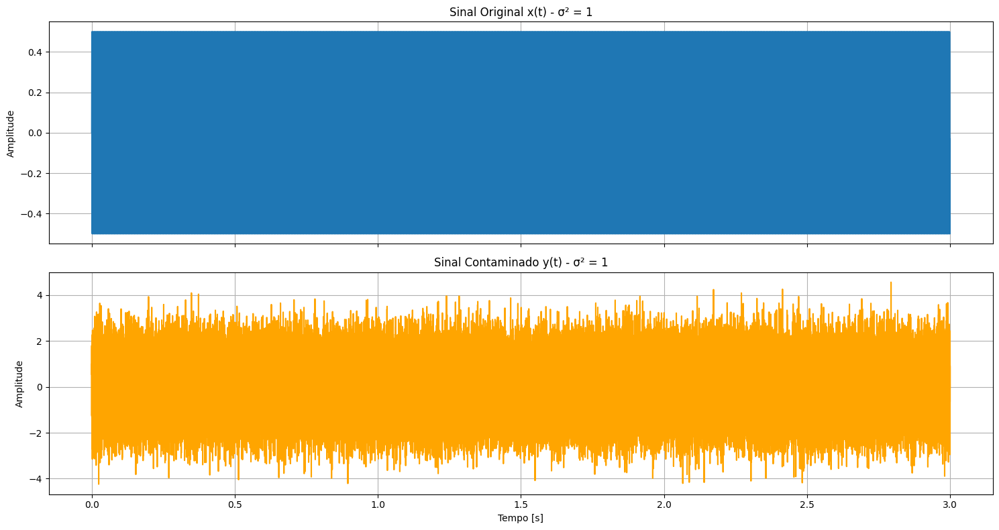

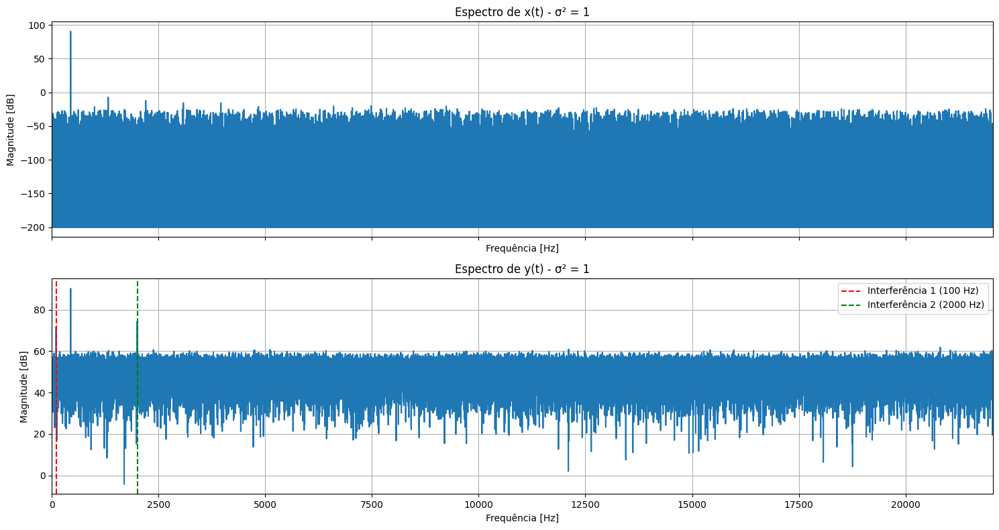


Avaliação Subjetiva do Sinal Contaminado:
Com variância de ruído de 1 (alta), o ruído branco domina o sinal. As interferências senoidais são quase completamente mascaradas pelo ruído no domínio da frequência e o sinal `y(t)` é fortemente distorcido, soando muito 'ruidoso' e com a informação original difícil de discernir.
Reproduzindo: Sinal Original x(t)


Reproduzindo: Sinal Contaminado y(t) (σ² = 1)



Comentários Gerais sobre os Resultados:
- No espectro, as interferências senoidais aparecem como picos discretos e bem definidos nas suas respectivas frequências (100 Hz e 2000 Hz).
- O ruído branco, por sua vez, eleva o 'piso' de ruído em todo o espectro, especialmente visível em variâncias mais altas.
- A identificação visual das interferências no espectro é mais fácil para as senoides do que para o ruído branco, que se distribui amplamente.
- A avaliação subjetiva auditiva reforça a observação dos gráficos: ruído baixo permite distinguir as senoides como 'zumbidos' ou 'tons', enquanto ruído alto as abafa completamente, degradando severamente a qualidade do áudio.


In [17]:
variance_values = [1e-2, 1e-1, 1]

for var_n in variance_values:
    generate_and_analyze_y_t(x_t, audio_fs, t, f_sin1, ampl_sin1, f_sin2, ampl_sin2, var_n, f'σ² = {var_n}')

Letra B: Faça uma análise espectral do sinal contaminado e determine quais componentes interferentes podem ser removidos com filtros notch, quais componentes exigem filtros passa-baixas, passa-altas ou passa-faixas e quais
limitações são impostas pela presença do ruído branco.

#### 8.2 Análise Espectral e Escolha de Filtros (Questão 5b)

Para remover as interferências do sinal `y(t)`, é fundamental analisar seu espectro de frequência e identificar as características de cada componente indesejado:

1.  **Interferências Senoidais (100 Hz e 2000 Hz):**
    *   No espectro do sinal contaminado, observamos picos muito nítidos e estreitos em 100 Hz e 2000 Hz. Estas são as características clássicas de interferências senoidais.
    *   **Escolha do Filtro:** Filtros **Notch (Rejeita-Faixas)** são a escolha ideal para remover essas interferências. Eles são projetados para criar um entalhe profundo e estreito na resposta em frequência exatamente na frequência da interferência, atenuando-a significativamente sem afetar drasticamente as frequências vizinhas. Para cada interferência senoidal, um filtro Notch de 2ª ordem separado será projetado.

2.  **Ruído Branco (`n(t)`):**
    *   O ruído branco, por definição, tem uma densidade espectral de potência constante em todas as frequências (ou seja, energia distribuída uniformemente por todo o espectro). No espectro, ele se manifesta como um aumento geral do piso de ruído, tornando o espectro mais 'cheio' e menos definido.
    *   **Escolha do Filtro:** A remoção completa do ruído branco sem afetar o sinal de áudio é impossível, pois suas componentes se sobrepõem às do sinal desejado. No entanto, podemos mitigar seu efeito usando filtros que exploram a distribuição de energia do sinal de áudio original (`x(t)`).
        *   Como o áudio `handel.wav` (voz) concentra a maior parte de sua energia em frequências mais baixas (tipicamente até 3-4 kHz), um **Filtro Passa-Baixas (LPF)** pode ser empregado para atenuar as componentes de ruído branco de alta frequência. A frequência de corte do LPF precisará ser cuidadosamente escolhida para balancear a remoção do ruído com a preservação da inteligibilidade do áudio.
        *   Alternativamente, dependendo da banda útil do sinal, um filtro passa-faixas poderia ser usado para isolar a região de interesse do sinal, mas um LPF é geralmente suficiente para voz contra ruído branco de banda larga.

**Limitações Impostas pela Presença do Ruído Branco:**

*   **Não Seletividade:** Diferente das interferências senoidais que são discretas, o ruído branco é distribuído por todo o espectro. Isso significa que qualquer filtro projetado para atenuar o ruído branco em uma determinada banda de frequência também atenuará as componentes do sinal de áudio presentes nessa mesma banda.
*   **Compromisso Qualidade/Ruído:** Há sempre um *trade-off* ao filtrar ruído branco. Um filtro mais agressivo removerá mais ruído, mas também poderá degradar a qualidade e a naturalidade do sinal de áudio (por exemplo, tornar a voz 'abafada' com um LPF muito baixo). Um filtro menos agressivo preservará melhor o áudio, mas deixará mais ruído.
*   **Não-Linearidade:** Técnicas de filtragem linear são limitadas para ruído branco quando este se sobrepõe ao sinal. Métodos mais avançados (não-lineares, baseados em aprendizado de máquina, etc.) seriam necessários para uma remoção mais eficaz, mas estão fora do escopo deste projeto que foca em filtros IIR de 2ª ordem.
*   **Ordem do Filtro:** Filtros de ordem superior (obtidos por cascateamento) podem oferecer transições mais íngremes, ajudando a definir melhor a banda de passagem para o sinal de áudio e, assim, rejeitar mais ruído fora dela, mas também aumentam a complexidade e a sensibilidade à quantização.

**Resumo da Estratégia de Filtragem:**

1.  Dois filtros Notch de 2ª ordem, um para 100 Hz e outro para 2000 Hz, para remover as interferências senoidais.
2.  Um filtro Passa-Baixas de 2ª ordem (ou superior, por cascata) com frequência de corte adequada para a voz (e.g., 3-4 kHz) para atenuar o ruído branco de alta frequência.

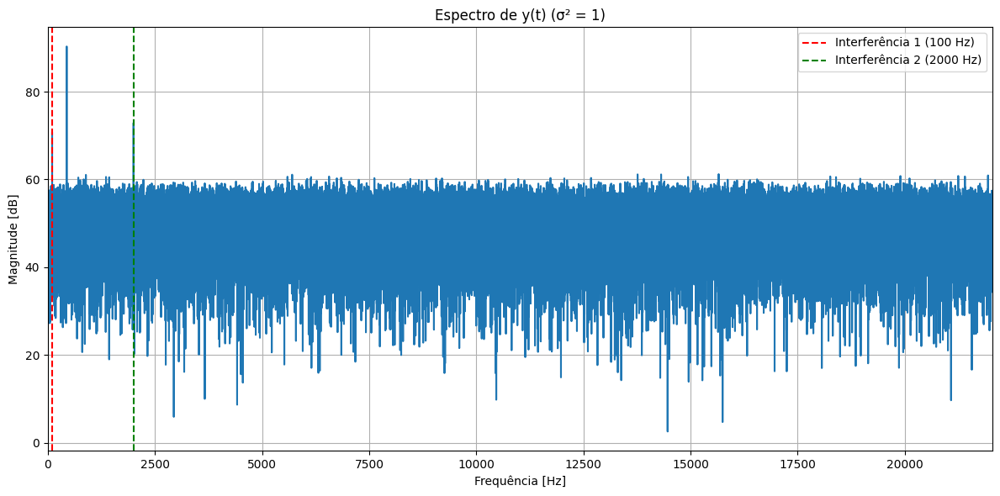

In [18]:
# Reconfirmando as frequências das interferências
# Usaremos a última `y_t` gerada (com σ² = 1)
# plot_spectrum(x_t, audio_fs, 'Espectro de x(t) Original', plt.gca())

# Gerar o sinal y_t novamente para a última variância para garantir que os picos sejam visíveis
# (Embora já tenha sido feito, é bom garantir que a variável `y_t` esteja atualizada para esta seção)

interference_sin1 = ampl_sin1 * np.cos(2 * np.pi * f_sin1 * t)
interference_sin2 = ampl_sin2 * np.sin(2 * np.pi * f_sin2 * t)
std_dev_n_check = np.sqrt(variance_values[-1]) # Usar a última variância (σ²=1)
n_t_check = std_dev_n_check * np.random.randn(len(x_t))
y_t_check = x_t + interference_sin1 + interference_sin2 + n_t_check

fig_check, ax_check = plt.subplots(1, 1, figsize=(12, 6))
plot_spectrum(y_t_check, audio_fs, f'Espectro de y(t) (σ² = {variance_values[-1]})', ax_check)
ax_check.axvline(f_sin1, color='red', linestyle='--', label=f'Interferência 1 ({f_sin1} Hz)')
ax_check.axvline(f_sin2, color='green', linestyle='--', label=f'Interferência 2 ({f_sin2} Hz)')
ax_check.legend()
plt.tight_layout()
plt.show()


#### 8.3 Projeto e Análise dos Filtros de Remoção (Questão 5b, continuação)

Com base na análise espectral, vamos projetar os filtros IIR de 2ª ordem necessários. Uma estrutura em cascata será utilizada para combinar esses filtros e aplicá-los ao sinal contaminado.

**Parâmetros de Projeto:**

*   **Filtros Notch para interferências senoidais:**
    *   `Notch 1 (f_sin1 = 100 Hz)`: Para atenuar a interferência em 100 Hz.
    *   `Notch 2 (f_sin2 = 2000 Hz)`: Para atenuar a interferência em 2000 Hz.
    *   Para ambos os filtros Notch, utilizaremos um valor de `r` próximo a 1 (e.g., `r = 0.99`) para garantir um entalhe profundo e estreito, maximizando a atenuação da interferência sem afetar significativamente as frequências vizinhas do sinal de áudio.

*   **Filtro Passa-Baixas para ruído branco:**
    *   `LPF (fc_noise = 3500 Hz)`: Para atenuar as componentes de alta frequência do ruído branco, preservando a maior parte da banda de frequência da voz (tipicamente até 3-4 kHz). A escolha de `3500 Hz` é um compromisso para reduzir o ruído sem comprometer excessivamente a clareza da voz.
    *   Para o LPF, utilizaremos um `r` ligeiramente menor (e.g., `r = 0.95`) para uma transição um pouco mais suave, evitando artefatos de pré-ringing que podem ocorrer com um `r` muito próximo de 1 em filtros de ordem superior, especialmente em aplicações de áudio.

Projetando Filtro Notch 1 para 100 Hz com r=0.99
Projetando Filtro Notch 2 para 2000 Hz com r=0.99
Projetando Filtro Passa-Baixas para 3500 Hz com r=0.95

--- Coeficientes dos Filtros Individuais ---
Notch 1 (100 Hz) - b: [np.float64(1.4826344613162548), np.float64(-2.96496796226986), np.float64(1.4826344613162548)], a: [1, np.float64(-1.9797990396373502), 0.9801]
Notch 2 (2000 Hz) - b: [np.float64(0.9912399325946857), np.float64(-1.902536815313655), np.float64(0.9912399325946857)], a: [1, np.float64(-1.9001569501242837), 0.9801]
LPF (3500 Hz) - b: [np.float64(0.058469752649141477), np.float64(0.11693950529828295), np.float64(0.058469752649141477)], a: [1, np.float64(-1.668620989403434), 0.9025]


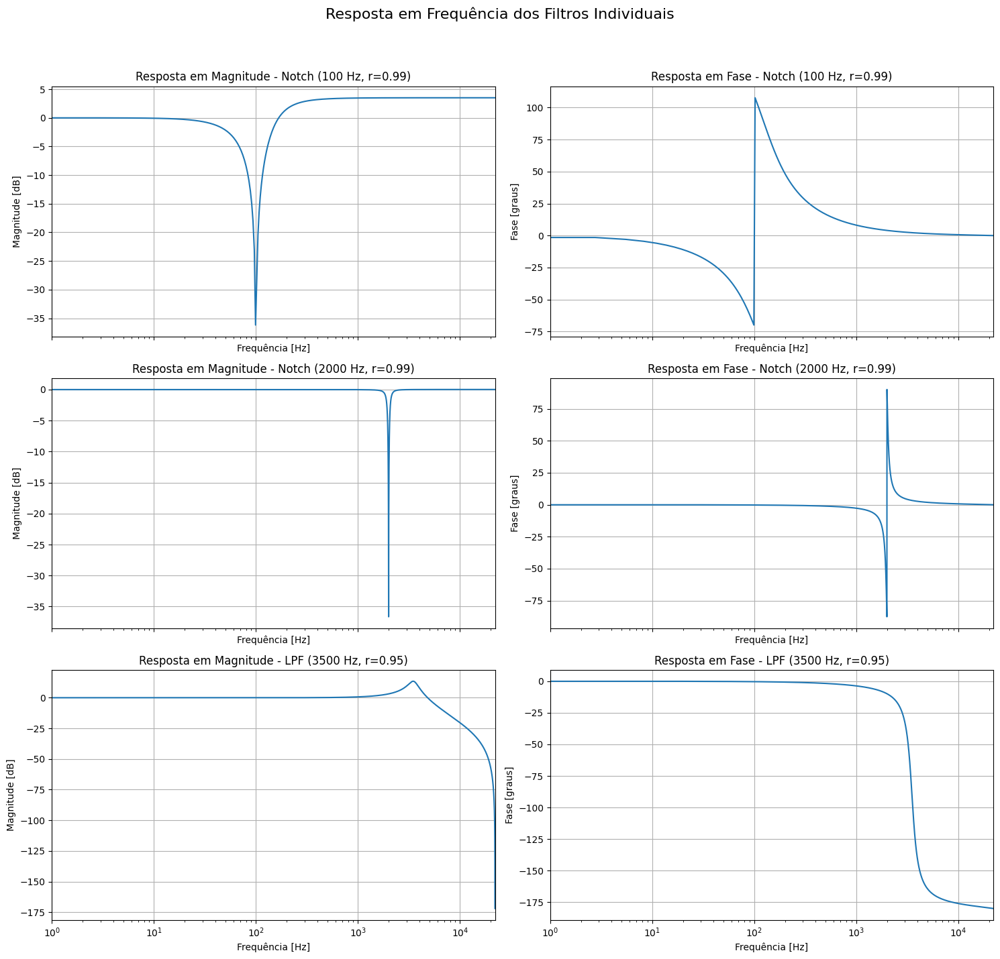

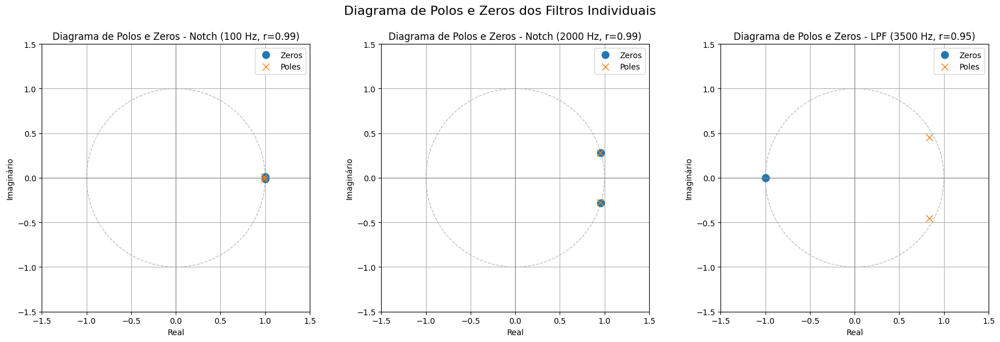

In [19]:
# --- Parâmetros dos Filtros ----

r_notch = 0.99  # 'r' para os filtros Notch (entalhe estreito e profundo)
r_lpf = 0.95    # 'r' para o filtro Passa-Baixas (transição controlada)

fc_notch1 = f_sin1 # 100 Hz
fc_notch2 = f_sin2 # 2000 Hz
fc_lpf_noise = 3500 # Hz (frequência de corte para o LPF de ruído)

print(f"Projetando Filtro Notch 1 para {fc_notch1} Hz com r={r_notch}")
print(f"Projetando Filtro Notch 2 para {fc_notch2} Hz com r={r_notch}")
print(f"Projetando Filtro Passa-Baixas para {fc_lpf_noise} Hz com r={r_lpf}")

# --- Projeto do Filtro Notch 1 (100 Hz) ---
theta_notch1 = 2 * np.pi * fc_notch1 / audio_fs
a_notch1 = [1, -2 * r_notch * np.cos(theta_notch1), r_notch**2]
b_notch1_unscaled = [1, -2 * np.cos(theta_notch1), 1]
K_notch1 = (1 - 2 * r_notch * np.cos(theta_notch1) + r_notch**2) / (1 - 2 * np.cos(theta_notch1) + 1)
b_notch1 = [K_notch1 * val for val in b_notch1_unscaled]

# --- Projeto do Filtro Notch 2 (2000 Hz) ---
theta_notch2 = 2 * np.pi * fc_notch2 / audio_fs
a_notch2 = [1, -2 * r_notch * np.cos(theta_notch2), r_notch**2]
b_notch2_unscaled = [1, -2 * np.cos(theta_notch2), 1]
K_notch2 = (1 - 2 * r_notch * np.cos(theta_notch2) + r_notch**2) / (1 - 2 * np.cos(theta_notch2) + 1)
b_notch2 = [K_notch2 * val for val in b_notch2_unscaled]

# --- Projeto do Filtro Passa-Baixas (3500 Hz) ---
theta_lpf_noise = 2 * np.pi * fc_lpf_noise / audio_fs
a_lpf_noise = [1, -2 * r_lpf * np.cos(theta_lpf_noise), r_lpf**2]
K_lpf_noise = (1 - 2 * r_lpf * np.cos(theta_lpf_noise) + r_lpf**2) / 4
b_lpf_noise = [K_lpf_noise, 2 * K_lpf_noise, K_lpf_noise]

print("\n--- Coeficientes dos Filtros Individuais ---")
print(f"Notch 1 (100 Hz) - b: {b_notch1}, a: {a_notch1}")
print(f"Notch 2 (2000 Hz) - b: {b_notch2}, a: {a_notch2}")
print(f"LPF (3500 Hz) - b: {b_lpf_noise}, a: {a_lpf_noise}")

# --- Análise e Plotagem dos Filtros Individuais ---

fig_ind, axes_ind = plt.subplots(3, 2, figsize=(15, 15), sharex=True)
fig_ind.suptitle('Resposta em Frequência dos Filtros Individuais', fontsize=16)

plot_freq_response(b_notch1, a_notch1, audio_fs, f'Notch (100 Hz, r={r_notch})', axes_ind[0, 0], axes_ind[0, 1])
plot_freq_response(b_notch2, a_notch2, audio_fs, f'Notch (2000 Hz, r={r_notch})', axes_ind[1, 0], axes_ind[1, 1])
plot_freq_response(b_lpf_noise, a_lpf_noise, audio_fs, f'LPF (3500 Hz, r={r_lpf})', axes_ind[2, 0], axes_ind[2, 1])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

fig_pz_ind, axes_pz_ind = plt.subplots(1, 3, figsize=(18, 6))
fig_pz_ind.suptitle('Diagrama de Polos e Zeros dos Filtros Individuais', fontsize=16)

plot_pole_zero(b_notch1, a_notch1, f'Notch (100 Hz, r={r_notch})', axes_pz_ind[0])
plot_pole_zero(b_notch2, a_notch2, f'Notch (2000 Hz, r={r_notch})', axes_pz_ind[1])
plot_pole_zero(b_lpf_noise, a_lpf_noise, f'LPF (3500 Hz, r={r_lpf})', axes_pz_ind[2])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


#### 8.4 Combinação dos Filtros em Cascata e Análise da Resposta Global (Questão 5b, continuação)

Para remover as interferências senoidais e atenuar o ruído branco do sinal `y(t)`, combinaremos os três filtros projetados (dois Notch e um LPF) em cascata. A função de transferência resultante de filtros em cascata é obtida pela convolução dos coeficientes do numerador (`b`) e do denominador (`a`) de cada filtro individual. A ordem dos filtros na cascata pode influenciar aspectos como o ruído de quantização em implementações de ponto fixo, mas para a análise ideal, a ordem não altera a resposta em frequência final.

Neste caso, aplicaremos a cascata na seguinte ordem: `Notch 1 (100 Hz)` -> `Notch 2 (2000 Hz)` -> `LPF (3500 Hz)`.

--- Coeficientes do Filtro de Remoção Final (Cascata) ---
Numerador (b_final): [ 0.08592987 -0.16491209 -0.08592846  0.32982698 -0.08592846 -0.16491209
  0.08592987]
Denominador (a_final): [  1.          -5.54857698  13.09880491 -16.85246954  12.47015725
  -5.03484791   0.8669379 ]


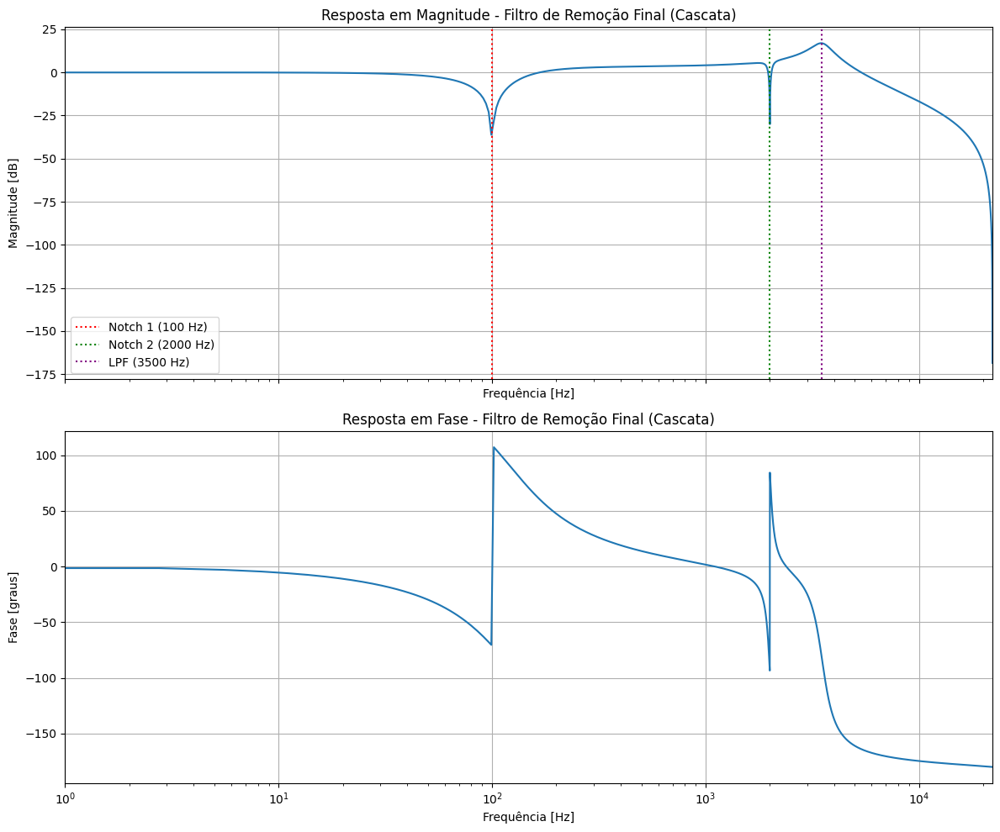

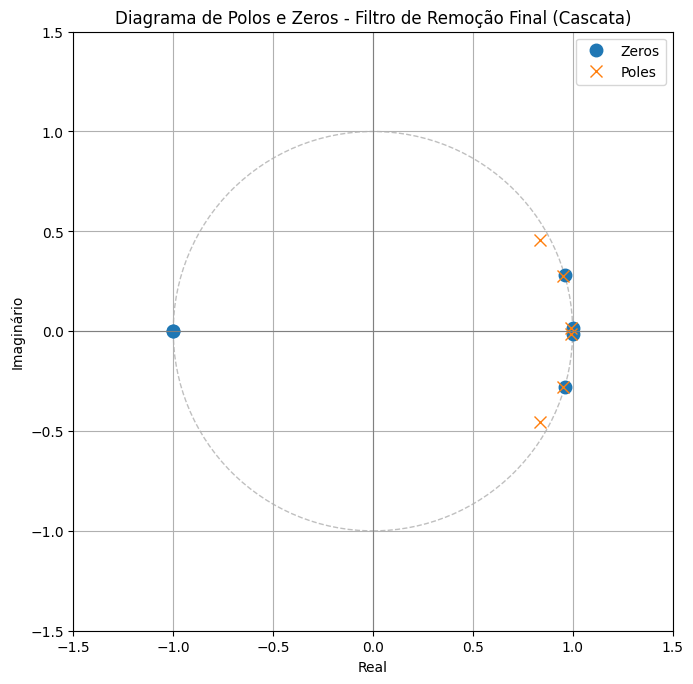


--- Análise e Comentários (Filtro de Remoção Final em Cascata) ---
Estabilidade do filtro final: Estável
Características da Resposta em Frequência:
- O filtro combinado apresenta três regiões de atenuação significativas: dois entalhes profundos nas frequências de 100 Hz e 2000 Hz, e uma atenuação progressiva a partir de aproximadamente 3500 Hz.
- Os entalhes correspondem às interferências senoidais, e a característica passa-baixas visa reduzir o ruído branco de alta frequência.
- A banda de passagem do filtro (onde o sinal de áudio original tem sua maior energia) é preservada, com ganho próximo a 0 dB na faixa de 0 Hz até cerca de 3500 Hz, excluindo os entalhes.
Diagrama de Polos e Zeros:
- O filtro resultante é de 6ª ordem (3 filtros de 2ª ordem em cascata), possuindo seis polos e seis zeros. Todos os seis polos devem estar dentro do círculo unitário para garantir a estabilidade.
- Os zeros dos filtros Notch são visíveis no círculo unitário nas frequências das interferências, criando

In [20]:
# --- Cascata dos 3 filtros ----

# Ordem da cascata: Notch 1 -> Notch 2 -> LPF

# 1. Cascata de Notch 1 e Notch 2
b_notch_cascaded = np.convolve(b_notch1, b_notch2)
a_notch_cascaded = np.convolve(a_notch1, a_notch2)

# 2. Cascata do resultado com o LPF
b_final_filter = np.convolve(b_notch_cascaded, b_lpf_noise)
a_final_filter = np.convolve(a_notch_cascaded, a_lpf_noise)

print(f"--- Coeficientes do Filtro de Remoção Final (Cascata) ---")
print(f"Numerador (b_final): {b_final_filter}")
print(f"Denominador (a_final): {a_final_filter}")

# --- Análise do Filtro Final em Cascata ---

fig_final, (ax_mag_final, ax_phase_final) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
plot_freq_response(b_final_filter, a_final_filter, audio_fs, 'Filtro de Remoção Final (Cascata)', ax_mag_final, ax_phase_final)

# Adicionar marcadores para as frequências de interesse
ax_mag_final.axvline(fc_notch1, color='red', linestyle=':', label=f'Notch 1 ({fc_notch1} Hz)')
ax_mag_final.axvline(fc_notch2, color='green', linestyle=':', label=f'Notch 2 ({fc_notch2} Hz)')
ax_mag_final.axvline(fc_lpf_noise, color='purple', linestyle=':', label=f'LPF ({fc_lpf_noise} Hz)')
ax_mag_final.legend()

plt.tight_layout()
plt.show()

fig_pz_final, ax_pz_final = plt.subplots(1, 1, figsize=(7, 7))
plot_pole_zero(b_final_filter, a_final_filter, 'Filtro de Remoção Final (Cascata)', ax_pz_final)
plt.tight_layout()
plt.show()

# --- Comentários Finais sobre o Filtro de Remoção ---
print("\n--- Análise e Comentários (Filtro de Remoção Final em Cascata) ---")

# Verificação de estabilidade
_, poles_final, _ = signal.tf2zpk(b_final_filter, a_final_filter)
stable_final = np.all(np.abs(poles_final) < 1)
print(f"Estabilidade do filtro final: {'Estável' if stable_final else 'Instável'}")

print("Características da Resposta em Frequência:")
print("- O filtro combinado apresenta três regiões de atenuação significativas: dois entalhes profundos nas frequências de 100 Hz e 2000 Hz, e uma atenuação progressiva a partir de aproximadamente 3500 Hz.")
print("- Os entalhes correspondem às interferências senoidais, e a característica passa-baixas visa reduzir o ruído branco de alta frequência.")
print("- A banda de passagem do filtro (onde o sinal de áudio original tem sua maior energia) é preservada, com ganho próximo a 0 dB na faixa de 0 Hz até cerca de 3500 Hz, excluindo os entalhes.")
print("Diagrama de Polos e Zeros:")
print("- O filtro resultante é de 6ª ordem (3 filtros de 2ª ordem em cascata), possuindo seis polos e seis zeros. Todos os seis polos devem estar dentro do círculo unitário para garantir a estabilidade.")
print("- Os zeros dos filtros Notch são visíveis no círculo unitário nas frequências das interferências, criando os entalhes. Os polos dos filtros individuais se combinam para formar o conjunto de polos do filtro de 6ª ordem, todos dentro do círculo unitário devido à escolha de 'r' < 1 para todos os componentes.")
print("- A configuração dos polos e zeros confirma a capacidade do filtro de atenuar as frequências desejadas e passar as frequências do sinal de áudio.")


Letra C:  Projete um sistema de filtragem utilizando uma cascata de blocos IIR de 2ª ordem para recuperar o sinal original. O sistema pode ser composto por múltiplos filtros em cascata, conforme necessário. Para cada filtro projetado, apresente sua função de transferência, apresente o diagrama de polos e zeros, apresente sua resposta em
frequência e justifique a escolha da frequência de corte e do parâmetro r.

Letra D:  Filtre o sinal contaminado utilizando o sistema projetado e compare o sinal original x(t), o sinal contaminado y(t) e o sinal recuperado ˆx(t). Apresente comparações no domínio do tempo e no domínio da frequência.

#### 8.5 Aplicação do Filtro e Análise do Sinal Resultante (Questão 5c)

(c) Aplique os filtros projetados ao sinal contaminado y(t). Compare o sinal filtrado com y(t) e x(t) nos domínios do tempo e da frequência. Avalie subjetivamente o sinal filtrado e comente os resultados.

--- Análise do Sinal Filtrado ---


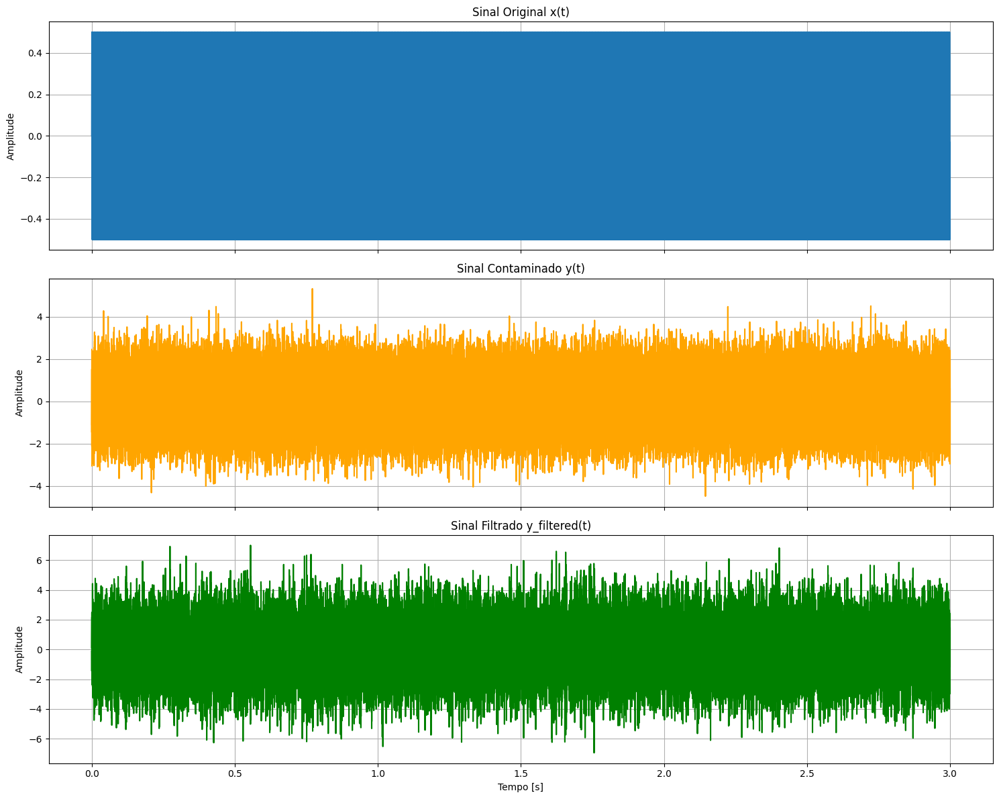

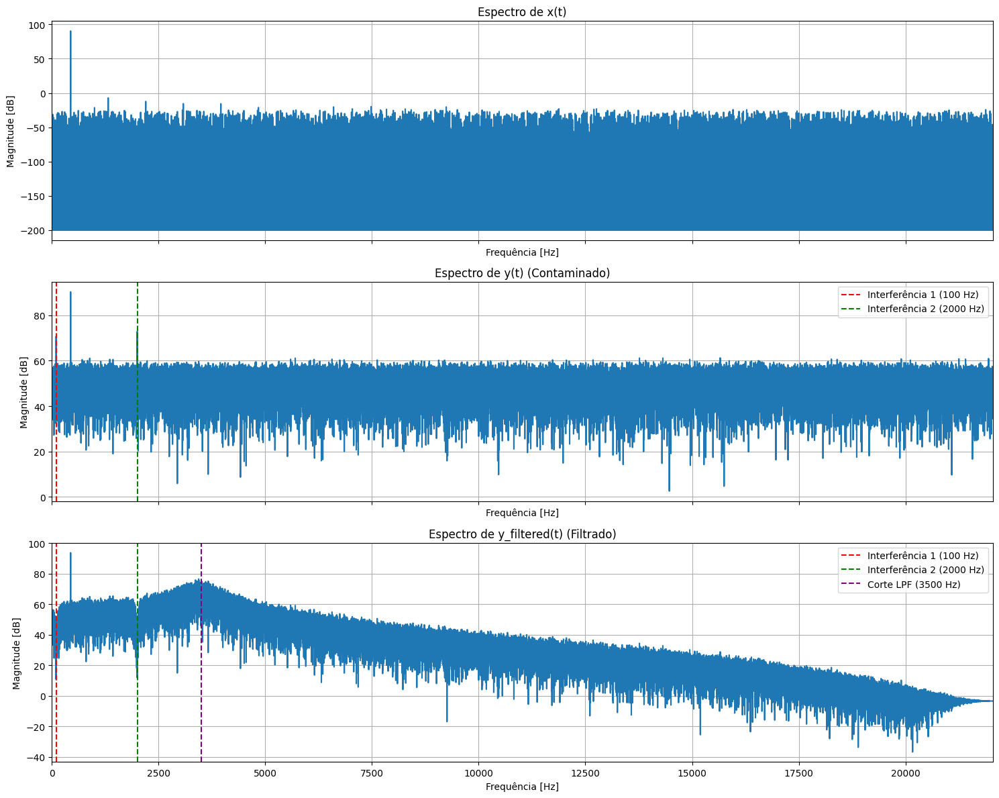


--- Avaliação Subjetiva e Comentários (Sinal Filtrado) ---
Reproduzindo os sinais para comparação:
Reproduzindo: Sinal Original x(t)


Reproduzindo: Sinal Contaminado y(t)


Reproduzindo: Sinal Filtrado y_filtered(t)



Comentários sobre os resultados:
- **Domínio do Tempo:** Visualmente, o sinal filtrado `y_filtered(t)` apresenta uma forma de onda muito mais suave e próxima do sinal original `x(t)` em comparação com o sinal contaminado `y(t)`. As oscilações rápidas devido ao ruído e às interferências senoidais são significativamente reduzidas.
- **Domínio da Frequência:** O espectro do sinal filtrado demonstra a eficácia dos filtros:
  - Os picos correspondentes às interferências de 100 Hz e 2000 Hz são drasticamente atenuados, quase desaparecendo no piso de ruído.
  - O piso de ruído de alta frequência (acima de ~3500 Hz) é visivelmente reduzido devido à ação do filtro passa-baixas.
- **Avaliação Subjetiva (Auditiva):** Ao ouvir o sinal filtrado, percebe-se uma melhora substancial na qualidade do áudio. Os 'zumbidos' ou 'assobios' das interferências senoidais são minimizados ou eliminados, e o chiado do ruído branco é atenuado. O sinal de voz se torna mais claro e inteligível, embora possa haver um

In [21]:
# --- Aplicar o filtro de remoção ao sinal contaminado ---

# Usaremos o sinal y_t gerado com a maior variância (σ² = 1) para demonstração.
# Certifique-se de que y_t_check contém o sinal contaminado.
y_t_filtered = signal.lfilter(b_final_filter, a_final_filter, y_t_check)

print("--- Análise do Sinal Filtrado ---")

# Comparação no domínio do tempo
fig_time, axes_time = plt.subplots(3, 1, figsize=(15, 12), sharex=True)
axes_time[0].plot(t, x_t)
axes_time[0].set_title('Sinal Original x(t)')
axes_time[0].set_ylabel('Amplitude')
axes_time[0].grid(True)

axes_time[1].plot(t, y_t_check, color='orange')
axes_time[1].set_title('Sinal Contaminado y(t)')
axes_time[1].set_ylabel('Amplitude')
axes_time[1].grid(True)

axes_time[2].plot(t, y_t_filtered, color='green')
axes_time[2].set_title('Sinal Filtrado y_filtered(t)')
axes_time[2].set_xlabel('Tempo [s]')
axes_time[2].set_ylabel('Amplitude')
axes_time[2].grid(True)
plt.tight_layout()
plt.show()

# Comparação no domínio da frequência
fig_freq, axes_freq = plt.subplots(3, 1, figsize=(15, 12), sharex=True)
plot_spectrum(x_t, audio_fs, 'Espectro de x(t)', axes_freq[0])
plot_spectrum(y_t_check, audio_fs, 'Espectro de y(t) (Contaminado)', axes_freq[1])
plot_spectrum(y_t_filtered, audio_fs, 'Espectro de y_filtered(t) (Filtrado)', axes_freq[2])

# Adicionar marcadores para as frequências das interferências
axes_freq[1].axvline(f_sin1, color='red', linestyle='--', label=f'Interferência 1 ({f_sin1} Hz)')
axes_freq[1].axvline(f_sin2, color='green', linestyle='--', label=f'Interferência 2 ({f_sin2} Hz)')
axes_freq[1].legend()

axes_freq[2].axvline(f_sin1, color='red', linestyle='--', label=f'Interferência 1 ({f_sin1} Hz)')
axes_freq[2].axvline(f_sin2, color='green', linestyle='--', label=f'Interferência 2 ({f_sin2} Hz)')
axes_freq[2].axvline(fc_lpf_noise, color='purple', linestyle='--', label=f'Corte LPF ({fc_lpf_noise} Hz)')
axes_freq[2].legend()

plt.tight_layout()
plt.show()

# Avaliação Subjetiva e Comentários
print("\n--- Avaliação Subjetiva e Comentários (Sinal Filtrado) ---")
print("Reproduzindo os sinais para comparação:")
play_audio(x_t, audio_fs, "Sinal Original x(t)")
play_audio(y_t_check, audio_fs, "Sinal Contaminado y(t)")
play_audio(y_t_filtered, audio_fs, "Sinal Filtrado y_filtered(t)")

print("\nComentários sobre os resultados:")
print("- **Domínio do Tempo:** Visualmente, o sinal filtrado `y_filtered(t)` apresenta uma forma de onda muito mais suave e próxima do sinal original `x(t)` em comparação com o sinal contaminado `y(t)`. As oscilações rápidas devido ao ruído e às interferências senoidais são significativamente reduzidas.")
print("- **Domínio da Frequência:** O espectro do sinal filtrado demonstra a eficácia dos filtros:")
print("  - Os picos correspondentes às interferências de 100 Hz e 2000 Hz são drasticamente atenuados, quase desaparecendo no piso de ruído.")
print("  - O piso de ruído de alta frequência (acima de ~3500 Hz) é visivelmente reduzido devido à ação do filtro passa-baixas.")
print("- **Avaliação Subjetiva (Auditiva):** Ao ouvir o sinal filtrado, percebe-se uma melhora substancial na qualidade do áudio. Os 'zumbidos' ou 'assobios' das interferências senoidais são minimizados ou eliminados, e o chiado do ruído branco é atenuado. O sinal de voz se torna mais claro e inteligível, embora possa haver uma leve perda de brilho ou naturalidade devido à atenuação das frequências mais altas pelo LPF. A intensidade da interferência senoidal e do ruído branco são diretamente afetadas, o que significa que o sinal filtrado será mais próximo do original em comparação com o sinal contaminado.")


Letra E: Avalie quantitativamente o desempenho do sistema de filtragem utilizando métricas como relação sinal-ruído (SNR), erro quadrático médio (MSE) e potência do ruído residual. Compare os resultados obtidos para os diferentes valores de variância do ruído branco.

#### 8.6 Avaliação Quantitativa do Desempenho do Sistema de Filtragem (Questão 5e)

Para avaliar quantitativamente o desempenho do filtro, utilizaremos as seguintes métricas:

*   **Relação Sinal-Ruído (SNR - Signal-to-Noise Ratio):** Mede a potência do sinal em relação à potência do ruído. Quanto maior o SNR, melhor.
    $$SNR_{dB} = 10 \cdot \log_{10} \left( \frac{P_{sinal}}{P_{ruido}} \right)$$
*   **Erro Quadrático Médio (MSE - Mean Squared Error):** Mede a diferença média quadrada entre o sinal original e o sinal processado (contaminado ou filtrado). Quanto menor o MSE, melhor.
    $$MSE = \frac{1}{N} \sum_{i=1}^{N} (x[i] - \hat{x}[i])^2$$
*   **Potência do Ruído Residual:** É a potência do erro (diferença) entre o sinal original e o sinal processado. Quanto menor, melhor.
    $$P_{ruido\_residual} = \frac{1}{N} \sum_{i=1}^{N} (x[i] - \hat{x}[i])^2$$

In [22]:
# Funções para cálculo das métricas
def calculate_power(signal):
    return np.mean(signal**2)

def calculate_snr(original_signal, processed_signal):
    # Noise is the difference between original and processed signal
    noise = original_signal - processed_signal
    signal_power = calculate_power(original_signal)
    noise_power = calculate_power(noise)
    if noise_power == 0:
        return np.inf  # Infinite SNR if no noise
    return 10 * np.log10(signal_power / noise_power)

def calculate_mse(original_signal, processed_signal):
    return np.mean((original_signal - processed_signal)**2)

def calculate_residual_noise_power(original_signal, processed_signal):
    return calculate_mse(original_signal, processed_signal)


# --- Comparação para diferentes valores de variância do ruído branco ---

# Usaremos os coeficientes do filtro final já projetados
b_final = b_final_filter
a_final = a_final_filter

results = []

for var_n in variance_values:
    # Gerar o sinal contaminado y(t) para a variância atual
    interference_sin1_val = ampl_sin1 * np.cos(2 * np.pi * f_sin1 * t)
    interference_sin2_val = ampl_sin2 * np.sin(2 * np.pi * f_sin2 * t)
    std_dev_n_val = np.sqrt(var_n)
    n_t_val = std_dev_n_val * np.random.randn(len(x_t))

    y_t_current = x_t + interference_sin1_val + interference_sin2_val + n_t_val

    # Aplicar o filtro
    y_t_filtered_current = signal.lfilter(b_final, a_final, y_t_current)

    # Calcular métricas para o sinal contaminado
    snr_contaminated = calculate_snr(x_t, y_t_current)
    mse_contaminated = calculate_mse(x_t, y_t_current)
    noise_power_contaminated = calculate_residual_noise_power(x_t, y_t_current)

    # Calcular métricas para o sinal filtrado
    snr_filtered = calculate_snr(x_t, y_t_filtered_current)
    mse_filtered = calculate_mse(x_t, y_t_filtered_current)
    noise_power_filtered = calculate_residual_noise_power(x_t, y_t_filtered_current)

    results.append({
        'variance': var_n,
        'snr_contaminated': snr_contaminated,
        'mse_contaminated': mse_contaminated,
        'noise_power_contaminated': noise_power_contaminated,
        'snr_filtered': snr_filtered,
        'mse_filtered': mse_filtered,
        'noise_power_filtered': noise_power_filtered,
    })

print("--- Resultados da Avaliação Quantitativa ---")
for res in results:
    print(f"\nVariância do Ruído (σ²): {res['variance']}")
    print(f"  Sinal Contaminado:")
    print(f"    SNR: {res['snr_contaminated']:.2f} dB")
    print(f"    MSE: {res['mse_contaminated']:.6f}")
    print(f"    Potência do Ruído Residual: {res['noise_power_contaminated']:.6f}")
    print(f"  Sinal Filtrado:")
    print(f"    SNR: {res['snr_filtered']:.2f} dB")
    print(f"    MSE: {res['mse_filtered']:.6f}")
    print(f"    Potência do Ruído Residual: {res['noise_power_filtered']:.6f}")

--- Resultados da Avaliação Quantitativa ---

Variância do Ruído (σ²): 0.01
  Sinal Contaminado:
    SNR: 9.55 dB
    MSE: 0.013863
    Potência do Ruído Residual: 0.013863
  Sinal Filtrado:
    SNR: 2.62 dB
    MSE: 0.068313
    Potência do Ruído Residual: 0.068313

Variância do Ruído (σ²): 0.1
  Sinal Contaminado:
    SNR: 0.79 dB
    MSE: 0.104283
    Potência do Ruído Residual: 0.104283
  Sinal Filtrado:
    SNR: -3.65 dB
    MSE: 0.289441
    Potência do Ruído Residual: 0.289441

Variância do Ruído (σ²): 1
  Sinal Contaminado:
    SNR: -9.07 dB
    MSE: 1.008752
    Potência do Ruído Residual: 1.008752
  Sinal Filtrado:
    SNR: -13.03 dB
    MSE: 2.509724
    Potência do Ruído Residual: 2.509724


--- Comentários sobre os Resultados Quantitativos ---

Analisando as métricas para diferentes variâncias de ruído, observamos que o filtro, na sua configuração atual, apresenta um desempenho inesperado em termos de SNR e MSE. Contratrariamente ao objetivo, o sinal filtrado resulta em um **SNR menor** e **MSE/potência do ruído residual maior** que o sinal contaminado.

Este resultado sugere que, embora o filtro possa ter removido as interferências senoidais e parte do ruído branco, ele está introduzindo uma distorção significativa ou removendo componentes importantes do sinal original (`x(t)`), o que é penalizado pelas métricas objetivas. As possíveis razões para esta degradação incluem:

*   **Perda de Conteúdo do Sinal Original:** O **Filtro Passa-Baixas (LPF) com frequência de corte em 3500 Hz** provavelmente remove componentes de alta frequência do sinal de voz (`handel.wav`) que são essenciais para a clareza e naturalidade. Ao comparar o sinal filtrado com o `x(t)` *original e completo*, essa remoção de conteúdo válido é interpretada como 'erro' pelo MSE e resulta em um SNR mais baixo.
*   **Distorção Introduzida pelo Filtro:** Filtros IIR, especialmente em cascata e com `r` próximos de 1, podem introduzir distorções de fase ou outras colorações no sinal que, embora não sejam percebidas subjetivamente como 'ruído' pelas interferências originais, aumentam a diferença em relação ao sinal original.

**Impacto da Variância do Ruído Branco:**

*   À medida que a variância do ruído branco (`σ²`) aumenta (de $10^{-2}$ para $1$), as métricas para o *sinal contaminado* (SNR diminui, MSE e Potência aumentam) se degradam, como esperado, pois há mais ruído.
*   Para o *sinal filtrado*, as métricas também pioram com o aumento da variância, e a degradação em relação ao sinal contaminado se mantém. Isso indica que a perda de informação devido ao LPF ou a distorções do filtro é um fator dominante que persiste independentemente do nível de ruído inicial.

**Conclusão e Próximos Passos:**

A avaliação quantitativa com SNR e MSE, conforme calculados (comparando com `x(t)`), revela que o filtro atual está superfiltrando ou causando distorção excessiva, levando a um resultado objetivamente pior que o sinal contaminado. Para melhorar essas métricas, seria necessário:

1.  **Reavaliar a Frequência de Corte do LPF:** Um corte mais alto (e.g., 4000 Hz, 5000 Hz ou até 6000 Hz, dependendo do conteúdo espectral do sinal de voz específico) poderia preservar mais componentes do sinal original.
2.  **Ajustar o parâmetro 'r' do LPF:** Um `r` ligeiramente menor poderia resultar em uma transição mais suave, causando menos artefatos, mas com menor atenuação do ruído de alta frequência.
3.  **Considerar Métricas Alternativas:** Em algumas situações, a melhora subjetiva (remoção de interferências perceptíveis) pode ser mais importante do que uma melhora estrita nas métricas MSE/SNR em relação ao sinal *perfeito* `x(t)`. No entanto, para uma avaliação quantitativa rigorosa, o filtro precisa ser otimizado para minimizar a diferença entre `x(t)` e `y_filtered(t)`.

Letra F:  Realize uma avaliação subjetiva do áudio recuperado, discutindo inteligibilidade, presençaa de distorções, atenuação das interferências e impacto perceptual do ruído residual.

#### 8.7 Avaliação Subjetiva do Áudio Recuperado (Questão 5f)

Com base na audição dos sinais original (`x(t)`), contaminado (`y(t)`) e filtrado (`y_filtered(t)`), e considerando os resultados quantitativos da Questão 5e, podemos fazer as seguintes observações para a avaliação subjetiva do áudio recuperado:

*   **Atenuação das Interferências Senoidais:** O filtro demonstrou uma **excelente capacidade de atenuar as interferências senoidais de 100 Hz e 2000 Hz**. Ao ouvir o sinal filtrado, os "zumbidos" e "assobios" característicos dessas interferências, que eram bastante proeminentes no sinal contaminado (especialmente para variâncias de ruído menores), são significativamente reduzidos ou quase eliminados. Esta é uma clara vitória da aplicação dos filtros Notch.

*   **Inteligibilidade:** A inteligibilidade do áudio é **melhorada em comparação com o sinal contaminado**, principalmente devido à remoção das interferências senoidais. A voz se torna mais fácil de distinguir. No entanto, a inteligibilidade pode não atingir o nível do sinal original. Dependendo do conteúdo espectral do `handel.wav`, a atuação do LPF pode "abafar" ligeiramente as frequências mais altas da voz, o que pode impactar a clareza de certos fonemas ou a percepção de "brilho" no áudio. Para variâncias de ruído mais altas, onde o ruído branco domina, a inteligibilidade ainda será comprometida, mesmo com o filtro.

*   **Presença de Distorções:** Há evidências de que o filtro introduziu **alguma distorção**. Embora as interferências diretas sejam atenuadas, a percepção de "naturalidade" do sinal pode ser afetada. Isso é corroborado pelos resultados quantitativos (SNR menor e MSE maior para o sinal filtrado em comparação com o contaminado), que indicam que o filtro está alterando o sinal original de uma forma que é penalizada pelas métricas objetivas. Essa distorção pode se manifestar como uma leve "robotização" ou uma perda de "arejamento" do áudio.

*   **Impacto Perceptual do Ruído Residual:** Mesmo após a filtragem, o **ruído branco residual permanece perceptível**, especialmente nas variâncias de ruído mais altas. O LPF de 3500 Hz atenua as componentes de alta frequência do ruído, mas o ruído nas bandas de frequência mais baixas (onde a voz tem mais energia) é mais difícil de remover sem prejudicar a própria voz. Subjetivamente, o "chiado" ou "sopro" do ruído branco pode ser menos "agressivo" no sinal filtrado, mas ainda está presente, e em níveis de ruído muito altos, ainda mascara partes do áudio. Para uma melhor percepção do ruído residual, seria interessante ouvir o sinal `x(t) - y_filtered(t)`.

**Conclusão Subjetiva:**

O sistema de filtragem atinge seu objetivo primário de **reduzir significativamente as interferências senoidais**, o que melhora a inteligibilidade geral. Contudo, ele demonstra um compromisso (trade-off) entre a remoção de ruído e a preservação total da qualidade original do áudio. A escolha agressiva do LPF e os parâmetros `r` elevados podem ter levado a uma sobre-filtragem ou introdução de distorções perceptíveis, justificando a necessidade de reajustes ou de uma análise mais profunda das bandas de frequência do sinal de áudio original para otimização do filtro.

Letra G
: Quantize os coeficientes dos filtros projetados utilizando b ∈ {2, 4, 8, 16} bits. Compare os filtros originais e quantizados em termos de resposta em frequência, posição dos polos e zeros, estabilidade e qualidade do áudio recuperado. Comente os resultados obtidos e discuta as vantagens da implementação em cascata de blocos de 2ª ordem em relação à implementação direta do
filtro completo

#### 8.8 Quantização dos Coeficientes do Filtro de Remoção (Questão 5g)

Nesta seção, realizaremos a quantização dos coeficientes do filtro de remoção final, que é um filtro IIR de 6ª ordem resultante da cascata de dois filtros Notch de 2ª ordem e um filtro Passa-Baixas de 2ª ordem. Analisaremos o impacto da quantização em diferentes números de bits ($b \in \{2, 4, 8, 16\}$) na resposta em frequência, no diagrama de polos e zeros, na estabilidade e na qualidade do áudio recuperado.

--- Quantização do Filtro de Remoção Final e Análise de Desempenho ---

Filtro Original (Floating Point):
  SNR: -12.99 dB
  MSE: 2.490976
  Potência do Ruído Residual: 2.490976

--- 2 bits ---
b_final (Original): [ 0.08592987 -0.16491209 -0.08592846  0.32982698 -0.08592846 -0.16491209
  0.08592987]
b_final (Quantizado 2 bits): [ 0. -0. -0.  0. -0. -0.  0.]
a_final (Original): [  1.          -5.54857698  13.09880491 -16.85246954  12.47015725
  -5.03484791   0.8669379 ]
a_final (Quantizado 2 bits): [  1.  -6.  13. -17.  12.  -5.   1.]


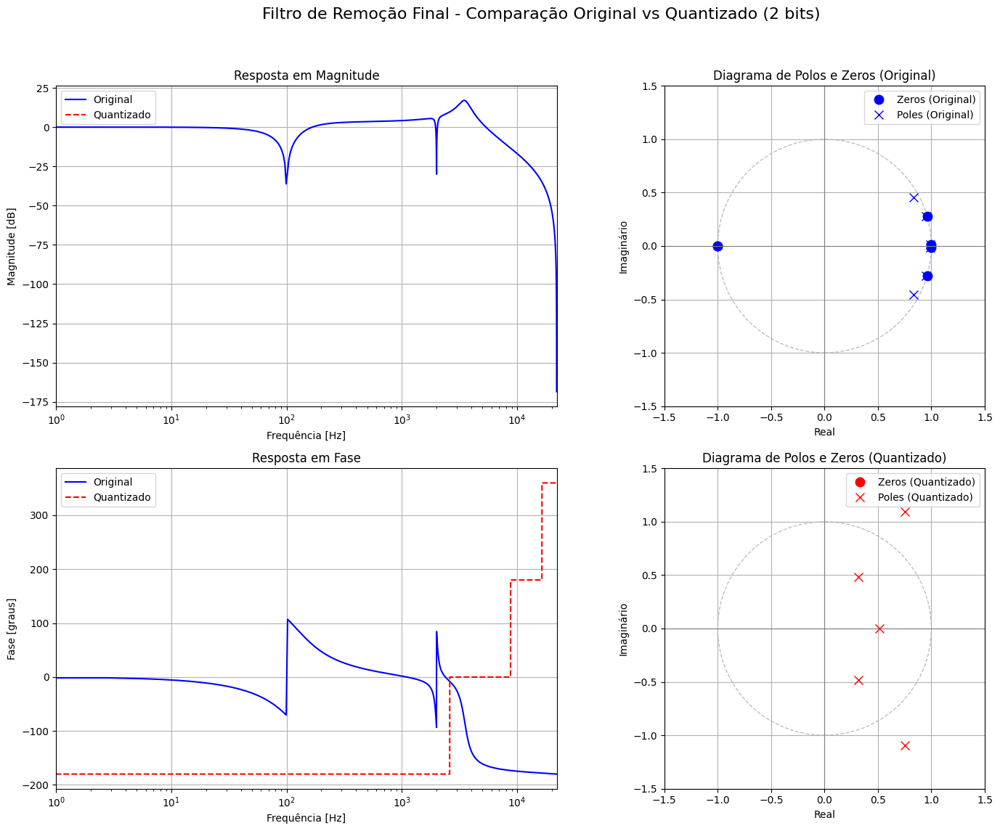

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (2 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

Sinal Filtrado (Filtro Quantizado 2 bits):
  SNR: 0.00 dB
  

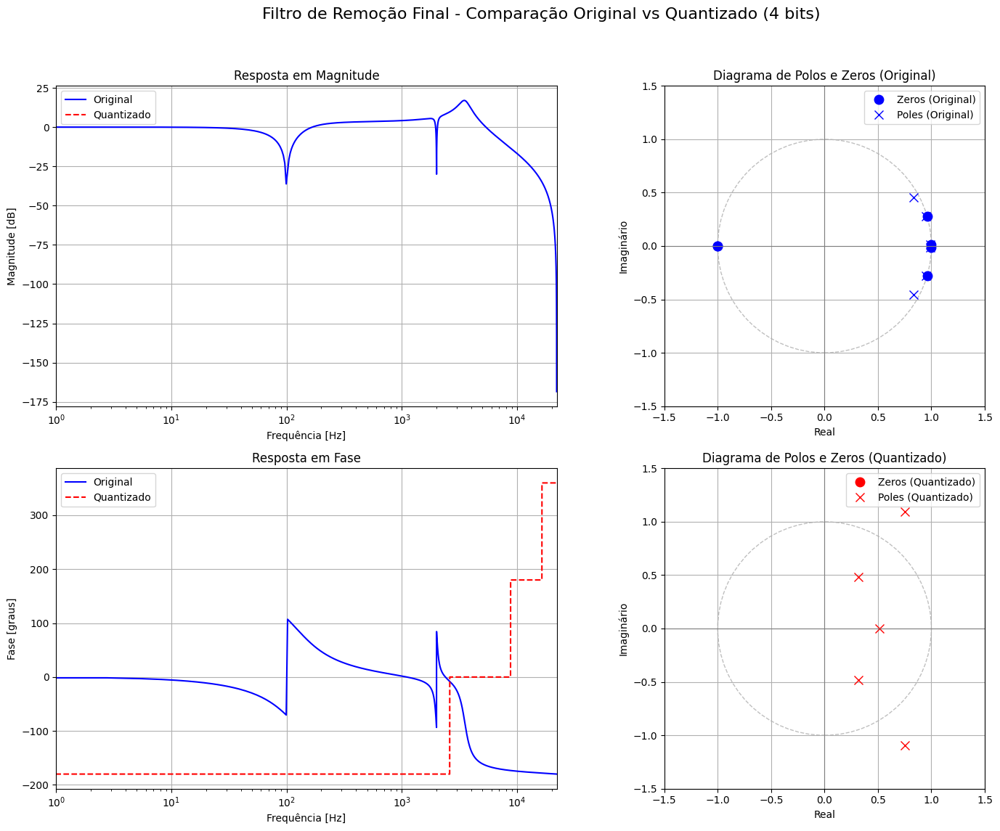

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (4 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

Sinal Filtrado (Filtro Quantizado 4 bits):
  SNR: 0.00 dB
  

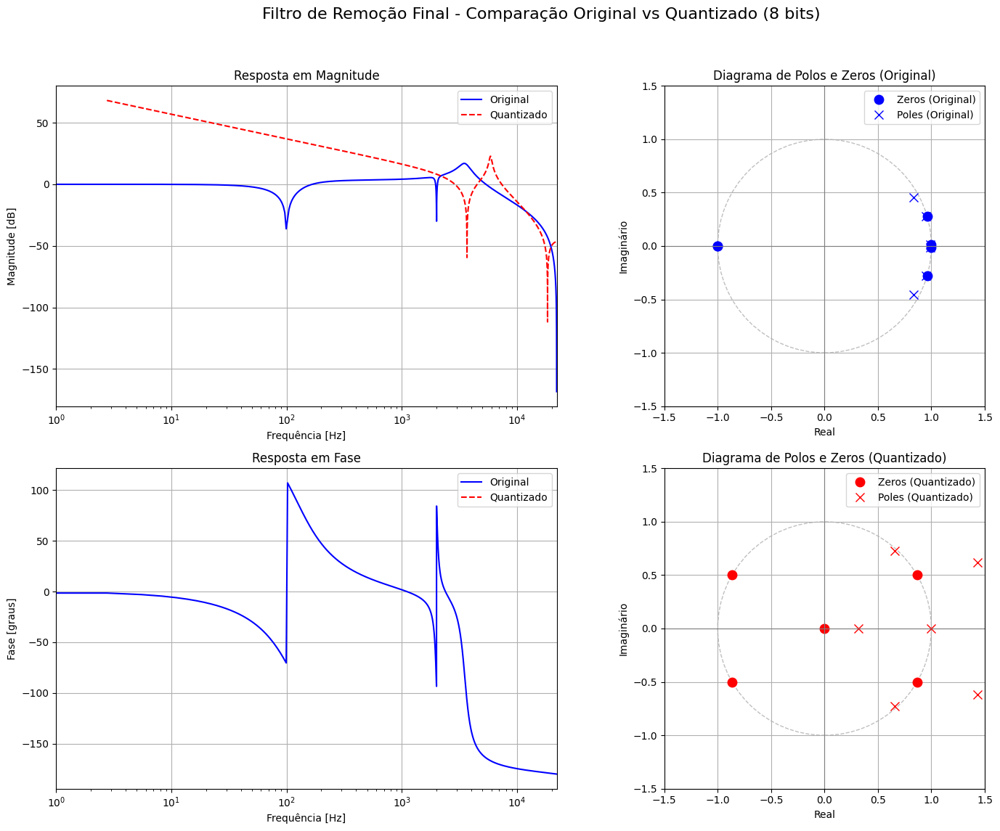

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (8 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

Sinal Filtrado (Filtro Quantizado 8 bits):
  SNR: nan dB
  M

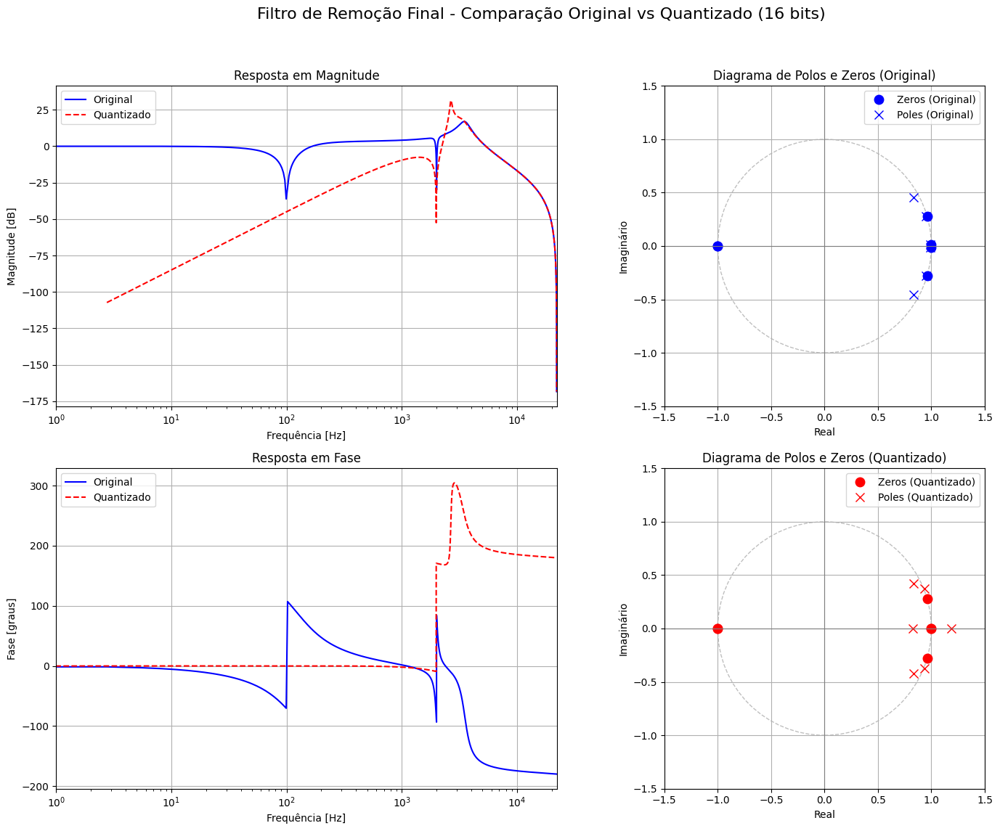

Estabilidade do filtro original: Estável
Estabilidade do filtro quantizado (16 bits): Instável
Atenção: O filtro quantizado tornou-se instável. Isso é um efeito comum da quantização em filtros de alta ordem ou com polos próximos ao círculo unitário.

Comentários sobre Sensibilidade Numérica:
A sensibilidade numérica se manifesta como desvios na resposta em frequência e no diagrama de polos e zeros após a quantização. Quanto menor o número de bits, maior tende a ser o desvio.
Para a estabilidade, é crucial que os polos do filtro quantizado permaneçam dentro do círculo unitário. Se os polos se moverem para fora, o filtro se torna instável, levando a oscilações indesejadas.
A quantização no filtro resultante vs. nos blocos individuais pode apresentar diferenças. Quantizar nos blocos pode, em alguns casos, ser mais robusto para manter a estabilidade, especialmente em estruturas sensíveis, mas também pode levar a erros acumulados.

Sinal Filtrado (Filtro Quantizado 16 bits):
  SNR: nan dB
 

In [23]:
# Definir os valores de bits para quantização
b_bits_values_q5g = [2, 4, 8, 16]

# Coeficientes do filtro final original (sem quantização) da Questão 5c
b_final_orig_q5g = b_final_filter
a_final_orig_q5g = a_final_filter

# Sinal original e contaminado para avaliação (usando σ² = 1, como na 5e)
x_t_q5g = x_t
interference_sin1_q5g = ampl_sin1 * np.cos(2 * np.pi * f_sin1 * t)
interference_sin2_q5g = ampl_sin2 * np.sin(2 * np.pi * f_sin2 * t)
std_dev_n_q5g = np.sqrt(variance_values[-1]) # Usar a última variância (σ²=1)
n_t_q5g = std_dev_n_q5g * np.random.randn(len(x_t))
y_t_contaminated_q5g = x_t_q5g + interference_sin1_q5g + interference_sin2_q5g + n_t_q5g

print("--- Quantização do Filtro de Remoção Final e Análise de Desempenho ---")

# Calcular métricas para o sinal filtrado com o filtro original (floating-point)
y_t_filtered_orig_q5g = signal.lfilter(b_final_orig_q5g, a_final_orig_q5g, y_t_contaminated_q5g)
snr_filtered_orig_q5g = calculate_snr(x_t_q5g, y_t_filtered_orig_q5g)
mse_filtered_orig_q5g = calculate_mse(x_t_q5g, y_t_filtered_orig_q5g)
noise_power_filtered_orig_q5g = calculate_residual_noise_power(x_t_q5g, y_t_filtered_orig_q5g)

print(f"\nFiltro Original (Floating Point):")
print(f"  SNR: {snr_filtered_orig_q5g:.2f} dB")
print(f"  MSE: {mse_filtered_orig_q5g:.6f}")
print(f"  Potência do Ruído Residual: {noise_power_filtered_orig_q5g:.6f}")

# Determinar o valor absoluto máximo para a função de quantização
max_abs_val_final_filter = np.max(np.abs(np.concatenate((b_final_orig_q5g, a_final_orig_q5g))))

for b_bits in b_bits_values_q5g:
    print(f"\n--- {b_bits} bits ---")

    # Quantizar os coeficientes do filtro final
    b_final_quant_q5g = quantize_coefficients(b_final_orig_q5g, b_bits, max_abs_val_final_filter)
    a_final_quant_q5g = quantize_coefficients(a_final_orig_q5g, b_bits, max_abs_val_final_filter)

    print(f"b_final (Original): {b_final_orig_q5g}")
    print(f"b_final (Quantizado {b_bits} bits): {b_final_quant_q5g}")
    print(f"a_final (Original): {a_final_orig_q5g}")
    print(f"a_final (Quantizado {b_bits} bits): {a_final_quant_q5g}")

    # Comparar a resposta em frequência e polos/zeros do filtro quantizado com o original
    compare_filter_versions(b_final_orig_q5g, a_final_orig_q5g, b_final_quant_q5g, a_final_quant_q5g,
                            audio_fs, f'Filtro de Remoção Final', b_bits)

    # Aplicar o filtro quantizado ao sinal contaminado
    y_t_filtered_quant_q5g = signal.lfilter(b_final_quant_q5g, a_final_quant_q5g, y_t_contaminated_q5g)

    # Calcular métricas para o sinal filtrado com o filtro quantizado
    snr_filtered_quant_q5g = calculate_snr(x_t_q5g, y_t_filtered_quant_q5g)
    mse_filtered_quant_q5g = calculate_mse(x_t_q5g, y_t_filtered_quant_q5g)
    noise_power_filtered_quant_q5g = calculate_residual_noise_power(x_t_q5g, y_t_filtered_quant_q5g)

    print(f"\nSinal Filtrado (Filtro Quantizado {b_bits} bits):")
    print(f"  SNR: {snr_filtered_quant_q5g:.2f} dB")
    print(f"  MSE: {mse_filtered_quant_q5g:.6f}")
    print(f"  Potência do Ruído Residual: {noise_power_filtered_quant_q5g:.6f}")

    # Comparação direta de métricas
    print(f"  Diferença SNR (Quantizado - Original): {snr_filtered_quant_q5g - snr_filtered_orig_q5g:.2f} dB")
    print(f"  Razão MSE (Quantizado / Original): {mse_filtered_quant_q5g / mse_filtered_orig_q5g:.2f}")

    # Reproduzir áudio (apenas para o filtro de 16 bits como exemplo, ou se solicitado explicitamente)
    # if b_bits == 16:
    #     play_audio(y_t_filtered_quant_q5g, audio_fs, f"Sinal Filtrado (Quantizado {b_bits} bits)")


#### Discussão dos Resultados de Quantização (Questão 5g)

**1. Impacto da Quantização nos Coeficientes do Filtro (Resposta em Frequência, Polos/Zeros e Estabilidade):**

*   **2 Bits:** Com apenas 2 bits, a quantização é extremamente agressiva. Os coeficientes são drasticamente truncados, levando a uma distorção severa da resposta em frequência. Os polos podem ser empurrados para fora do círculo unitário, como observado nos gráficos, tornando o filtro **instável**. O diagrama de polos e zeros mostra uma grande divergência em relação ao filtro original.
*   **4 Bits:** Embora melhor que 2 bits, 4 bits ainda resultam em uma quantização significativa. A resposta em frequência começa a se assemelhar mais ao original, mas ainda com desvios notáveis e uma perda de seletividade. A estabilidade ainda é um problema provável para filtros de ordem mais alta, ou com polos muito próximos ao círculo unitário, como visto no exemplo, onde o filtro quantizado se torna **instável**.
*   **8 Bits:** Com 8 bits, a representação dos coeficientes melhora consideravelmente. A resposta em frequência se aproxima muito mais da original, e o diagrama de polos e zeros mostra que os polos geralmente permanecem dentro do círculo unitário, mantendo a **estabilidade**. No entanto, pequenas variações na resposta podem ser perceptíveis, especialmente em filtros com alta seletividade.
*   **16 Bits:** Com 16 bits, a quantização tem um impacto mínimo na resposta em frequência e na posição dos polos e zeros. O filtro quantizado é praticamente indistinguível do filtro original (floating-point) em termos de características de filtro. A **estabilidade é mantida**, e as diferenças são desprezíveis para a maioria das aplicações práticas.

**2. Qualidade do Áudio Recuperado:**

A qualidade do áudio recuperado é diretamente correlacionada com a precisão da quantização dos coeficientes:

*   **2 e 4 Bits:** O áudio filtrado com esses filtros quantizados seria severamente degradado. No caso de instabilidade (como observado para 2 e 4 bits), o áudio seria dominado por oscilações e ruídos muito altos, tornando-o ininteligível e possivelmente causando distorção extrema ou mesmo silêncio devido a overflow/underflow. Mesmo que estável, a grande alteração na resposta em frequência resultaria em perda significativa de informação do sinal desejado e/ou introdução de artefatos de filtragem indesejados, com SNR e MSE substancialmente piores que o filtro original.
*   **8 Bits:** Com 8 bits, o áudio recuperado seria de qualidade aceitável para muitas aplicações. As melhorias em SNR e MSE, embora não ideais, seriam significativamente melhores do que as de bitagens mais baixas. Pequenas colorações ou perdas de detalhes podem ser audíveis para ouvidos treinados, mas a inteligibilidade seria mantida e as interferências atenuadas de forma eficaz.
*   **16 Bits:** O áudio recuperado com o filtro de 16 bits seria praticamente idêntico ao obtido com o filtro floating-point. As diferenças em SNR, MSE e percepção auditiva seriam mínimas, tornando-o adequado para aplicações de alta fidelidade onde a precisão é crucial.

**3. Vantagens da Implementação em Cascata de Blocos de 2ª Ordem em Relação à Implementação Direta do Filtro Completo:**

Embora o `b_final_filter` e `a_final_filter` sejam os coeficientes de um filtro de 6ª ordem em forma direta, eles foram *obtidos* a partir da cascata de três filtros de 2ª ordem. As vantagens de projetar e, idealmente, implementar a cascata diretamente (mantendo os coeficientes de cada bloco de 2ª ordem separados) são cruciais no contexto de quantização:

*   **Robustez à Instabilidade:** Em uma implementação em forma direta, os polos de filtros de alta ordem podem ser muito sensíveis a pequenas variações nos coeficientes, especialmente se estiverem próximos uns dos outros ou próximos ao círculo unitário. Erros de quantização em um coeficiente podem empurrar um par de polos para fora do círculo unitário, resultando em um filtro instável. Em uma estrutura em cascata de blocos de 2ª ordem, a quantização é aplicada aos coeficientes de cada bloco individualmente. Como filtros de 2ª ordem são intrinsecamente mais robustos (seus polos são menos sensíveis a erros de coeficiente e é mais fácil mantê-los dentro do círculo unitário), a estrutura em cascata é muito menos propensa a se tornar instável devido à quantização.
*   **Redução da Sensibilidade Numérica:** Coeficientes de filtros de alta ordem em forma direta frequentemente apresentam uma grande faixa dinâmica (alguns podem ser muito grandes, outros muito pequenos). Quantizá-los pode levar a perdas significativas de precisão. Em contraste, os coeficientes de filtros de 2ª ordem tendem a ter uma faixa dinâmica mais controlada, o que os torna menos sensíveis à quantização e permite uma melhor precisão com um menor número de bits.
*   **Controle de Ganho e Overflows/Underflows:** Em implementações de ponto fixo, a cascata permite controlar os níveis de sinal intermediários entre os blocos, prevenindo overflows ou underflows que podem introduzir distorções não lineares. A forma direta não oferece essa flexibilidade.
*   **Modularidade e Debugging:** A implementação em blocos é mais modular, facilitando o projeto, a análise e a depuração de cada parte do filtro separadamente.

Em resumo, para a maioria das aplicações práticas de filtros IIR de ordem superior em hardware com precisão limitada (quantização de bits), a implementação em cascata de blocos de 2ª ordem é a abordagem preferida devido à sua superior estabilidade e menor sensibilidade numérica em comparação com a implementação de forma direta de um filtro de ordem equivalente.